In [1]:
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import datetime
%matplotlib inline

In [2]:
n_sensors=16

In [3]:
x = np.linspace(0, 1, 101)
y = np.linspace(0, 1, 101)

In [4]:
t = np.linspace(0, 1, 41)

In [5]:
xrange = np.linspace(0, 1, 101)
yrange = np.linspace(0, 1, 101)
xmesh, ymesh = np.meshgrid(xrange, yrange)

In [6]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

$$ f_1(x, y, t) = e^{-t}(cos2\pi xcos2\pi y + sin2\pi xsin2\pi y) $$
$$ f_2(x, y, t) = x + y + t $$
$$ f_3(x, y, t) = e^{-t}(2sin2\pi x + sin2\pi xcos2\pi y) $$

Case 1: f1

In [7]:
out1 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out1[i, j, k] = np.exp(-t[i])*(np.cos(2*np.pi*x[j])*np.cos(2*np.pi*y[k])
                                           + np.sin(2*np.pi*x[j])*np.sin(2*np.pi*y[k]))

In [8]:
out1[0, :, :]

array([[1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ],
       [0.99802673, 1.        , 0.99802673, ..., 0.98228725, 0.9921147 ,
        0.99802673],
       [0.9921147 , 0.99802673, 1.        , ..., 0.96858316, 0.98228725,
        0.9921147 ],
       ...,
       [0.9921147 , 0.98228725, 0.96858316, ..., 1.        , 0.99802673,
        0.9921147 ],
       [0.99802673, 0.9921147 , 0.98228725, ..., 0.99802673, 1.        ,
        0.99802673],
       [1.        , 0.99802673, 0.9921147 , ..., 0.9921147 , 0.99802673,
        1.        ]])

In [9]:
sensor1 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor1[i, j, k] = out1[i, 20*(j+1)+1, 20*(k+1)+1]

In [10]:
sensor1.shape

(41, 4, 4)

In [11]:
sensor1 = sensor1.reshape(41, 16, 1)

In [12]:
sensor1.shape

(41, 16, 1)

In [13]:
x_train1, x_test1, y_train1, y_test1, t_train, t_test = train_test_split(sensor1, out1, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [14]:
t_train

array([[0.725],
       [0.15 ],
       [0.65 ],
       [0.3  ],
       [0.425],
       [0.225],
       [0.375],
       [0.8  ],
       [0.4  ],
       [0.875],
       [0.85 ],
       [0.   ],
       [0.675],
       [0.125],
       [0.275],
       [0.025],
       [0.75 ],
       [0.525],
       [0.05 ],
       [0.775],
       [0.925],
       [0.075],
       [0.9  ],
       [0.575],
       [0.825],
       [0.25 ],
       [0.55 ],
       [0.45 ],
       [0.5  ],
       [0.175],
       [0.35 ],
       [0.7  ],
       [0.95 ]])

In [15]:
x_train1

array([[[ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457],
        [ 0.14966452],
        [-0.39182681],
        [-0.39182681],
        [ 0.14966452],
        [ 0.48432457]],

       [[ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798],
        [ 0.26597339],
        [-0.69632738],
        [-0.69632738],
        [ 0.26597339],
        [ 0.86070798]],

       [[ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
        [ 0.16132102],
        [-0.42234391],
        [-0.42234391],
        [ 0.16132102],
        [ 0.52204578],
       

In [16]:
x_test1

array([[[ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164],
        [ 0.16959212],
        [-0.44399794],
        [-0.44399794],
        [ 0.16959212],
        [ 0.54881164]],

       [[ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735],
        [ 0.22327323],
        [-0.58453691],
        [-0.58453691],
        [ 0.22327323],
        [ 0.72252735]],

       [[ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
        [ 0.25300172],
        [-0.66236709],
        [-0.66236709],
        [ 0.25300172],
        [ 0.81873075],
       

In [17]:
input_time = tf.keras.Input(shape=(1))
reshape = tf.keras.layers.Reshape((1,))(input_time)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='fourthHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='fifthHiddenLayerSensor',
                          kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=16, activation=None, name='outputLayerSensor')(x_)
output_sensor = tf.keras.layers.Reshape((16, 1))(output_data)
# MLP
sensor_pred1 = tf.keras.Model(input_time, output_sensor)
sensor_pred2 = tf.keras.Model(input_time, output_sensor)
sensor_pred3 = tf.keras.Model(input_time, output_sensor)

In [18]:
sensor_pred1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 1)]               0         
                                                                 
 reshape (Reshape)           (None, 1)                 0         
                                                                 
 firstHiddenLayerSensor (Den  (None, 128)              256       
 se)                                                             
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 secondHiddenLayerSensor (De  (None, 128)              16512     
 nse)                                                            
                                                             

In [19]:
sensor_pred1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [20]:
start1 = datetime.datetime.now()
history1 = sensor_pred1.fit(t_train, x_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 10ms/step - loss: 2.2328 - rmse: 1.3107
Epoch 2/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8470 - rmse: 1.1544
Epoch 3/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6294 - rmse: 1.0561
Epoch 4/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4668 - rmse: 0.9762
Epoch 5/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3571 - rmse: 0.9185
Epoch 6/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2971 - rmse: 0.8854
Epoch 7/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2164 - rmse: 0.8388
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1539 - rmse: 0.8009
Epoch 9/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0932 - rmse: 0.7623
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0734 - rmse: 0.7494
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 10ms/step - loss: 0.6554 - rmse: 0.4140
Epoch 86/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6522 - rmse: 0.4106
Epoch 87/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6492 - rmse: 0.4074
Epoch 88/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6489 - rmse: 0.4075
Epoch 89/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6478 - rmse: 0.4066
Epoch 90/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.6464 - rmse: 0.4054
Epoch 91/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.6439 - rmse: 0.4028
Epoch 92/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6510 - rmse: 0.4120
Epoch 93/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.6430 - rmse: 0.4026
Epoch 94/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.6421 - rmse: 0.4020
Epoch 95/10000
2/2 [==========================

2/2 [==============================] - 0s 12ms/step - loss: 0.5635 - rmse: 0.3333
Epoch 170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5622 - rmse: 0.3319
Epoch 171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5609 - rmse: 0.3304
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5594 - rmse: 0.3288
Epoch 173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5589 - rmse: 0.3286
Epoch 174/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.5575 - rmse: 0.3270
Epoch 175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.5565 - rmse: 0.3260
Epoch 176/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.5618 - rmse: 0.3346
Epoch 177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5570 - rmse: 0.3279
Epoch 178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.5553 - rmse: 0.3258
Epoch 179/10000
2/2 [=================

2/2 [==============================] - 0s 15ms/step - loss: 0.4852 - rmse: 0.2488
Epoch 253/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4845 - rmse: 0.2481
Epoch 254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4834 - rmse: 0.2465
Epoch 255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4821 - rmse: 0.2445
Epoch 256/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4839 - rmse: 0.2489
Epoch 257/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4808 - rmse: 0.2432
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4803 - rmse: 0.2429
Epoch 259/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.4788 - rmse: 0.2406
Epoch 260/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4787 - rmse: 0.2409
Epoch 261/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4777 - rmse: 0.2397
Epoch 262/10000
2/2 [================

Epoch 336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4254 - rmse: 0.1707
Epoch 337/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4225 - rmse: 0.1631
Epoch 338/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4218 - rmse: 0.1616
Epoch 339/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4213 - rmse: 0.1612
Epoch 340/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4209 - rmse: 0.1608
Epoch 341/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4190 - rmse: 0.1558
Epoch 342/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4205 - rmse: 0.1616
Epoch 343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4192 - rmse: 0.1583
Epoch 344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.4185 - rmse: 0.1572
Epoch 345/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.4202 - rmse: 0.1633
Epoch 346/10000
2/2 

2/2 [==============================] - 0s 14ms/step - loss: 0.3797 - rmse: 0.0879
Epoch 420/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3795 - rmse: 0.0883
Epoch 421/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3819 - rmse: 0.1024
Epoch 422/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3783 - rmse: 0.0849
Epoch 423/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3780 - rmse: 0.0843
Epoch 424/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3773 - rmse: 0.0818
Epoch 425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3798 - rmse: 0.0973
Epoch 426/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3768 - rmse: 0.0821
Epoch 427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3762 - rmse: 0.0806
Epoch 428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3770 - rmse: 0.0865
Epoch 429/10000
2/2 [=================

2/2 [==============================] - 0s 15ms/step - loss: 0.3522 - rmse: 0.0483
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3521 - rmse: 0.0502
Epoch 504/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3534 - rmse: 0.0633
Epoch 505/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3531 - rmse: 0.0629
Epoch 506/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3520 - rmse: 0.0560
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3517 - rmse: 0.0555
Epoch 508/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3521 - rmse: 0.0612
Epoch 509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3507 - rmse: 0.0516
Epoch 510/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3510 - rmse: 0.0564
Epoch 511/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.3506 - rmse: 0.0547
Epoch 512/10000
2/2 [================

2/2 [==============================] - 0s 13ms/step - loss: 0.3325 - rmse: 0.0537
Epoch 586/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3315 - rmse: 0.0460
Epoch 587/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3312 - rmse: 0.0455
Epoch 588/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3314 - rmse: 0.0502
Epoch 589/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3319 - rmse: 0.0565
Epoch 590/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3306 - rmse: 0.0460
Epoch 591/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.3310 - rmse: 0.0532
Epoch 592/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3295 - rmse: 0.0396
Epoch 593/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3300 - rmse: 0.0479
Epoch 594/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3297 - rmse: 0.0470
Epoch 595/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.3125 - rmse: 0.0396
Epoch 669/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3143 - rmse: 0.0595
Epoch 670/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3125 - rmse: 0.0445
Epoch 671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.3121 - rmse: 0.0430
Epoch 672/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.3122 - rmse: 0.0463
Epoch 673/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3124 - rmse: 0.0505
Epoch 674/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3117 - rmse: 0.0449
Epoch 675/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.3115 - rmse: 0.0460
Epoch 676/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3136 - rmse: 0.0661
Epoch 677/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.3111 - rmse: 0.0463
Epoch 678/10000
2/2 [=================

2/2 [==============================] - 0s 12ms/step - loss: 0.2953 - rmse: 0.0397
Epoch 752/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2952 - rmse: 0.0414
Epoch 753/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2958 - rmse: 0.0506
Epoch 754/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2959 - rmse: 0.0533
Epoch 755/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2950 - rmse: 0.0456
Epoch 756/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2941 - rmse: 0.0384
Epoch 757/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2945 - rmse: 0.0453
Epoch 758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2969 - rmse: 0.0683
Epoch 759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2944 - rmse: 0.0480
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2947 - rmse: 0.0530
Epoch 761/10000
2/2 [===================

2/2 [==============================] - 0s 14ms/step - loss: 0.2808 - rmse: 0.0557
Epoch 835/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2790 - rmse: 0.0387
Epoch 836/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2797 - rmse: 0.0489
Epoch 837/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2792 - rmse: 0.0459
Epoch 838/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2793 - rmse: 0.0493
Epoch 839/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2784 - rmse: 0.0409
Epoch 840/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2784 - rmse: 0.0434
Epoch 841/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2781 - rmse: 0.0421
Epoch 842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2778 - rmse: 0.0398
Epoch 843/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.2776 - rmse: 0.0401
Epoch 844/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.2647 - rmse: 0.0457
Epoch 918/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2658 - rmse: 0.0576
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2663 - rmse: 0.0635
Epoch 920/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2640 - rmse: 0.0428
Epoch 921/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2642 - rmse: 0.0471
Epoch 922/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2636 - rmse: 0.0428
Epoch 923/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2632 - rmse: 0.0399
Epoch 924/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2637 - rmse: 0.0478
Epoch 925/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2639 - rmse: 0.0517
Epoch 926/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2629 - rmse: 0.0423
Epoch 927/10000
2/2 [===============

2/2 [==============================] - 0s 13ms/step - loss: 0.2499 - rmse: 0.0357
Epoch 1001/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2506 - rmse: 0.0461
Epoch 1002/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2509 - rmse: 0.0513
Epoch 1003/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2497 - rmse: 0.0405
Epoch 1004/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2499 - rmse: 0.0443
Epoch 1005/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2492 - rmse: 0.0378
Epoch 1006/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2498 - rmse: 0.0470
Epoch 1007/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2492 - rmse: 0.0418
Epoch 1008/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2486 - rmse: 0.0362
Epoch 1009/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2486 - rmse: 0.0383
Epoch 1010/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.2370 - rmse: 0.0385
Epoch 1083/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2373 - rmse: 0.0432
Epoch 1084/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2368 - rmse: 0.0396
Epoch 1085/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2369 - rmse: 0.0426
Epoch 1086/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2369 - rmse: 0.0443
Epoch 1087/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2367 - rmse: 0.0445
Epoch 1088/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2360 - rmse: 0.0377
Epoch 1089/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2355 - rmse: 0.0319
Epoch 1090/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2376 - rmse: 0.0575
Epoch 1091/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2363 - rmse: 0.0462
Epoch 1092/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.2250 - rmse: 0.0425
Epoch 1165/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2254 - rmse: 0.0480
Epoch 1166/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2243 - rmse: 0.0374
Epoch 1167/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2250 - rmse: 0.0472
Epoch 1168/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2258 - rmse: 0.0560
Epoch 1169/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2249 - rmse: 0.0497
Epoch 1170/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2247 - rmse: 0.0484
Epoch 1171/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2250 - rmse: 0.0529
Epoch 1172/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2237 - rmse: 0.0412
Epoch 1173/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2238 - rmse: 0.0436
Epoch 1174/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.2128 - rmse: 0.0361
Epoch 1247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2122 - rmse: 0.0291
Epoch 1248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2137 - rmse: 0.0493
Epoch 1249/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2128 - rmse: 0.0415
Epoch 1250/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2124 - rmse: 0.0383
Epoch 1251/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2127 - rmse: 0.0438
Epoch 1252/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2126 - rmse: 0.0435
Epoch 1253/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2120 - rmse: 0.0382
Epoch 1254/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2125 - rmse: 0.0460
Epoch 1255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2115 - rmse: 0.0346
Epoch 1256/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.2016 - rmse: 0.0344
Epoch 1329/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2024 - rmse: 0.0456
Epoch 1330/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2030 - rmse: 0.0531
Epoch 1331/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2017 - rmse: 0.0409
Epoch 1332/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2019 - rmse: 0.0440
Epoch 1333/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2013 - rmse: 0.0388
Epoch 1334/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.2013 - rmse: 0.0399
Epoch 1335/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2022 - rmse: 0.0515
Epoch 1336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2008 - rmse: 0.0376
Epoch 1337/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2015 - rmse: 0.0472
Epoch 1338/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1918 - rmse: 0.0421
Epoch 1411/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1918 - rmse: 0.0441
Epoch 1412/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1918 - rmse: 0.0450
Epoch 1413/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1915 - rmse: 0.0440
Epoch 1414/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1911 - rmse: 0.0397
Epoch 1415/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1913 - rmse: 0.0435
Epoch 1416/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1910 - rmse: 0.0418
Epoch 1417/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1907 - rmse: 0.0394
Epoch 1418/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1912 - rmse: 0.0466
Epoch 1419/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1898 - rmse: 0.0302
Epoch 1420/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1836 - rmse: 0.0595
Epoch 1493/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1814 - rmse: 0.0379
Epoch 1494/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1810 - rmse: 0.0339
Epoch 1495/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1828 - rmse: 0.0556
Epoch 1496/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1810 - rmse: 0.0380
Epoch 1497/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1807 - rmse: 0.0358
Epoch 1498/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1812 - rmse: 0.0430
Epoch 1499/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1808 - rmse: 0.0402
Epoch 1500/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1822 - rmse: 0.0559
Epoch 1501/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1808 - rmse: 0.0425
Epoch 1502/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1717 - rmse: 0.0333
Epoch 1575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1717 - rmse: 0.0352
Epoch 1576/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1716 - rmse: 0.0349
Epoch 1577/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1728 - rmse: 0.0503
Epoch 1578/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1720 - rmse: 0.0432
Epoch 1579/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1714 - rmse: 0.0375
Epoch 1580/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1712 - rmse: 0.0352
Epoch 1581/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1733 - rmse: 0.0590
Epoch 1582/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1721 - rmse: 0.0488
Epoch 1583/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1724 - rmse: 0.0536
Epoch 1584/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1639 - rmse: 0.0484
Epoch 1657/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1630 - rmse: 0.0388
Epoch 1658/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1626 - rmse: 0.0347
Epoch 1659/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1643 - rmse: 0.0554
Epoch 1660/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1635 - rmse: 0.0478
Epoch 1661/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1627 - rmse: 0.0399
Epoch 1662/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1629 - rmse: 0.0439
Epoch 1663/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1628 - rmse: 0.0437
Epoch 1664/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1626 - rmse: 0.0435
Epoch 1665/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1622 - rmse: 0.0396
Epoch 1666/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1557 - rmse: 0.0513
Epoch 1739/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1542 - rmse: 0.0363
Epoch 1740/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1537 - rmse: 0.0300
Epoch 1741/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1542 - rmse: 0.0382
Epoch 1742/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1537 - rmse: 0.0324
Epoch 1743/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1538 - rmse: 0.0362
Epoch 1744/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1538 - rmse: 0.0375
Epoch 1745/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1537 - rmse: 0.0367
Epoch 1746/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1531 - rmse: 0.0292
Epoch 1747/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1532 - rmse: 0.0328
Epoch 1748/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1460 - rmse: 0.0349
Epoch 1821/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1456 - rmse: 0.0290
Epoch 1822/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1469 - rmse: 0.0474
Epoch 1823/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1459 - rmse: 0.0372
Epoch 1824/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1460 - rmse: 0.0389
Epoch 1825/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1461 - rmse: 0.0425
Epoch 1826/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1455 - rmse: 0.0354
Epoch 1827/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1456 - rmse: 0.0384
Epoch 1828/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1451 - rmse: 0.0317
Epoch 1829/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1456 - rmse: 0.0400
Epoch 1830/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.1382 - rmse: 0.0336
Epoch 1903/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1376 - rmse: 0.0250
Epoch 1904/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1395 - rmse: 0.0518
Epoch 1905/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1378 - rmse: 0.0328
Epoch 1906/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1380 - rmse: 0.0358
Epoch 1907/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1373 - rmse: 0.0261
Epoch 1908/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1383 - rmse: 0.0419
Epoch 1909/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1384 - rmse: 0.0447
Epoch 1910/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1381 - rmse: 0.0427
Epoch 1911/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1381 - rmse: 0.0434
Epoch 1912/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1315 - rmse: 0.0423
Epoch 1985/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1308 - rmse: 0.0347
Epoch 1986/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1331 - rmse: 0.0596
Epoch 1987/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1308 - rmse: 0.0373
Epoch 1988/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1322 - rmse: 0.0535
Epoch 1989/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1311 - rmse: 0.0426
Epoch 1990/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1314 - rmse: 0.0468
Epoch 1991/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1305 - rmse: 0.0376
Epoch 1992/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1307 - rmse: 0.0410
Epoch 1993/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1302 - rmse: 0.0365
Epoch 1994/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1243 - rmse: 0.0393
Epoch 2067/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1243 - rmse: 0.0405
Epoch 2068/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1242 - rmse: 0.0402
Epoch 2069/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1240 - rmse: 0.0391
Epoch 2070/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1257 - rmse: 0.0573
Epoch 2071/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1239 - rmse: 0.0395
Epoch 2072/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1231 - rmse: 0.0297
Epoch 2073/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1236 - rmse: 0.0381
Epoch 2074/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1245 - rmse: 0.0489
Epoch 2075/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1233 - rmse: 0.0364
Epoch 2076/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1174 - rmse: 0.0366
Epoch 2149/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1175 - rmse: 0.0378
Epoch 2150/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1190 - rmse: 0.0555
Epoch 2151/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1182 - rmse: 0.0479
Epoch 2152/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1171 - rmse: 0.0361
Epoch 2153/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1172 - rmse: 0.0387
Epoch 2154/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1174 - rmse: 0.0425
Epoch 2155/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.1178 - rmse: 0.0475
Epoch 2156/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1166 - rmse: 0.0336
Epoch 2157/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1189 - rmse: 0.0589
Epoch 2158/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1108 - rmse: 0.0307
Epoch 2231/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1111 - rmse: 0.0366
Epoch 2232/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1106 - rmse: 0.0288
Epoch 2233/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1127 - rmse: 0.0549
Epoch 2234/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.1108 - rmse: 0.0348
Epoch 2235/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1104 - rmse: 0.0304
Epoch 2236/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1104 - rmse: 0.0307
Epoch 2237/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1110 - rmse: 0.0412
Epoch 2238/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1102 - rmse: 0.0295
Epoch 2239/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1101 - rmse: 0.0297
Epoch 2240/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.1064 - rmse: 0.0501
Epoch 2313/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1048 - rmse: 0.0312
Epoch 2314/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1051 - rmse: 0.0361
Epoch 2315/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1044 - rmse: 0.0266
Epoch 2316/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1049 - rmse: 0.0348
Epoch 2317/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1048 - rmse: 0.0354
Epoch 2318/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1045 - rmse: 0.0316
Epoch 2319/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1045 - rmse: 0.0329
Epoch 2320/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1062 - rmse: 0.0536
Epoch 2321/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1045 - rmse: 0.0353
Epoch 2322/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.1010 - rmse: 0.0518
Epoch 2395/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0993 - rmse: 0.0330
Epoch 2396/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0995 - rmse: 0.0364
Epoch 2397/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0988 - rmse: 0.0276
Epoch 2398/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0992 - rmse: 0.0344
Epoch 2399/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0994 - rmse: 0.0382
Epoch 2400/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0989 - rmse: 0.0322
Epoch 2401/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0992 - rmse: 0.0378
Epoch 2402/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0990 - rmse: 0.0355
Epoch 2403/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0995 - rmse: 0.0425
Epoch 2404/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0940 - rmse: 0.0338
Epoch 2477/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0941 - rmse: 0.0354
Epoch 2478/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0936 - rmse: 0.0287
Epoch 2479/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0944 - rmse: 0.0416
Epoch 2480/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0957 - rmse: 0.0552
Epoch 2481/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0937 - rmse: 0.0338
Epoch 2482/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0940 - rmse: 0.0386
Epoch 2483/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0936 - rmse: 0.0339
Epoch 2484/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0938 - rmse: 0.0380
Epoch 2485/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0933 - rmse: 0.0321
Epoch 2486/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0893 - rmse: 0.0395
Epoch 2559/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0890 - rmse: 0.0360
Epoch 2560/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0886 - rmse: 0.0311
Epoch 2561/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0901 - rmse: 0.0499
Epoch 2562/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0890 - rmse: 0.0380
Epoch 2563/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0885 - rmse: 0.0322
Epoch 2564/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0883 - rmse: 0.0310
Epoch 2565/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0884 - rmse: 0.0324
Epoch 2566/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0883 - rmse: 0.0316
Epoch 2567/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0896 - rmse: 0.0489
Epoch 2568/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0834 - rmse: 0.0226
Epoch 2641/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0843 - rmse: 0.0382
Epoch 2642/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0833 - rmse: 0.0246
Epoch 2643/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0844 - rmse: 0.0414
Epoch 2644/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0851 - rmse: 0.0502
Epoch 2645/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0842 - rmse: 0.0407
Epoch 2646/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0839 - rmse: 0.0374
Epoch 2647/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0838 - rmse: 0.0368
Epoch 2648/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0832 - rmse: 0.0286
Epoch 2649/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0831 - rmse: 0.0271
Epoch 2650/10000
2/2 [=====

Epoch 2723/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0797 - rmse: 0.0395
Epoch 2724/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0793 - rmse: 0.0355
Epoch 2725/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0789 - rmse: 0.0297
Epoch 2726/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0795 - rmse: 0.0397
Epoch 2727/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0789 - rmse: 0.0318
Epoch 2728/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0791 - rmse: 0.0351
Epoch 2729/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0786 - rmse: 0.0281
Epoch 2730/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0786 - rmse: 0.0290
Epoch 2731/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0785 - rmse: 0.0291
Epoch 2732/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0786 - rmse: 0.0309
Epoch 2733/

2/2 [==============================] - 0s 12ms/step - loss: 0.0752 - rmse: 0.0392
Epoch 2806/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0744 - rmse: 0.0276
Epoch 2807/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0744 - rmse: 0.0278
Epoch 2808/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0752 - rmse: 0.0403
Epoch 2809/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0744 - rmse: 0.0308
Epoch 2810/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0743 - rmse: 0.0294
Epoch 2811/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0745 - rmse: 0.0333
Epoch 2812/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0742 - rmse: 0.0289
Epoch 2813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0746 - rmse: 0.0361
Epoch 2814/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0738 - rmse: 0.0238
Epoch 2815/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0702 - rmse: 0.0274
Epoch 2889/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0709 - rmse: 0.0382
Epoch 2890/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0701 - rmse: 0.0266
Epoch 2891/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0702 - rmse: 0.0300
Epoch 2892/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0698 - rmse: 0.0224
Epoch 2893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0698 - rmse: 0.0253
Epoch 2894/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0701 - rmse: 0.0300
Epoch 2895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0704 - rmse: 0.0363
Epoch 2896/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0697 - rmse: 0.0245
Epoch 2897/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0706 - rmse: 0.0396
Epoch 2898/10000
2/2 [=======

2/2 [==============================] - 0s 12ms/step - loss: 0.0662 - rmse: 0.0286
Epoch 2972/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0665 - rmse: 0.0338
Epoch 2973/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0663 - rmse: 0.0311
Epoch 2974/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0663 - rmse: 0.0315
Epoch 2975/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0660 - rmse: 0.0277
Epoch 2976/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0660 - rmse: 0.0289
Epoch 2977/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0662 - rmse: 0.0326
Epoch 2978/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0662 - rmse: 0.0330
Epoch 2979/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0657 - rmse: 0.0269
Epoch 2980/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0676 - rmse: 0.0508
Epoch 2981/10000
2/2 [=====

2/2 [==============================] - 0s 9ms/step - loss: 0.0623 - rmse: 0.0257
Epoch 3054/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0628 - rmse: 0.0346
Epoch 3055/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0625 - rmse: 0.0309
Epoch 3056/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0628 - rmse: 0.0369
Epoch 3057/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0620 - rmse: 0.0246
Epoch 3058/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0624 - rmse: 0.0311
Epoch 3059/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0620 - rmse: 0.0251
Epoch 3060/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0617 - rmse: 0.0197
Epoch 3061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0622 - rmse: 0.0311
Epoch 3062/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0618 - rmse: 0.0230
Epoch 3063/10000
2/2 [=======

2/2 [==============================] - 0s 13ms/step - loss: 0.0611 - rmse: 0.0561
Epoch 3137/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0594 - rmse: 0.0379
Epoch 3138/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0590 - rmse: 0.0330
Epoch 3139/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0594 - rmse: 0.0387
Epoch 3140/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0586 - rmse: 0.0289
Epoch 3141/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0604 - rmse: 0.0508
Epoch 3142/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0589 - rmse: 0.0341
Epoch 3143/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0585 - rmse: 0.0293
Epoch 3144/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0584 - rmse: 0.0273
Epoch 3145/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0591 - rmse: 0.0383
Epoch 3146/10000
2/2 [=====

Epoch 3219/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0553 - rmse: 0.0268
Epoch 3220/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0555 - rmse: 0.0316
Epoch 3221/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0567 - rmse: 0.0472
Epoch 3222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0559 - rmse: 0.0389
Epoch 3223/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0560 - rmse: 0.0406
Epoch 3224/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0553 - rmse: 0.0300
Epoch 3225/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0558 - rmse: 0.0380
Epoch 3226/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0550 - rmse: 0.0264
Epoch 3227/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0551 - rmse: 0.0291
Epoch 3228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0566 - rmse: 0.0495
Epoch 3229/

2/2 [==============================] - 0s 12ms/step - loss: 0.0520 - rmse: 0.0261
Epoch 3302/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0520 - rmse: 0.0260
Epoch 3303/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0526 - rmse: 0.0367
Epoch 3304/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0518 - rmse: 0.0242
Epoch 3305/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0521 - rmse: 0.0297
Epoch 3306/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0518 - rmse: 0.0252
Epoch 3307/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0528 - rmse: 0.0406
Epoch 3308/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0518 - rmse: 0.0272
Epoch 3309/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0523 - rmse: 0.0354
Epoch 3310/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0515 - rmse: 0.0232
Epoch 3311/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0492 - rmse: 0.0304
Epoch 3384/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0491 - rmse: 0.0302
Epoch 3385/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0488 - rmse: 0.0255
Epoch 3386/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0496 - rmse: 0.0377
Epoch 3387/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0487 - rmse: 0.0239
Epoch 3388/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0507 - rmse: 0.0514
Epoch 3389/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0489 - rmse: 0.0283
Epoch 3390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0489 - rmse: 0.0301
Epoch 3391/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0487 - rmse: 0.0272
Epoch 3392/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0488 - rmse: 0.0288
Epoch 3393/10000
2/2 [=====

Epoch 3466/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0468 - rmse: 0.0386
Epoch 3467/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0462 - rmse: 0.0307
Epoch 3468/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0464 - rmse: 0.0330
Epoch 3469/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0472 - rmse: 0.0448
Epoch 3470/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0460 - rmse: 0.0290
Epoch 3471/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0457 - rmse: 0.0241
Epoch 3472/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0461 - rmse: 0.0318
Epoch 3473/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0459 - rmse: 0.0285
Epoch 3474/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0457 - rmse: 0.0253
Epoch 3475/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0465 - rmse: 0.0381
Epoch 3476/1

2/2 [==============================] - 0s 15ms/step - loss: 0.0449 - rmse: 0.0475
Epoch 3549/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0435 - rmse: 0.0310
Epoch 3550/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0445 - rmse: 0.0448
Epoch 3551/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0449 - rmse: 0.0487
Epoch 3552/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0434 - rmse: 0.0298
Epoch 3553/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0453 - rmse: 0.0538
Epoch 3554/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0430 - rmse: 0.0247
Epoch 3555/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0441 - rmse: 0.0410
Epoch 3556/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0430 - rmse: 0.0260
Epoch 3557/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0437 - rmse: 0.0369
Epoch 3558/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0410 - rmse: 0.0321
Epoch 3631/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0411 - rmse: 0.0338
Epoch 3632/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0404 - rmse: 0.0219
Epoch 3633/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0420 - rmse: 0.0463
Epoch 3634/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0419 - rmse: 0.0447
Epoch 3635/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - rmse: 0.0300
Epoch 3636/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0409 - rmse: 0.0334
Epoch 3637/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0426 - rmse: 0.0533
Epoch 3638/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0408 - rmse: 0.0317
Epoch 3639/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0408 - rmse: 0.0335
Epoch 3640/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0383 - rmse: 0.0285
Epoch 3713/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0387 - rmse: 0.0353
Epoch 3714/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0383 - rmse: 0.0293
Epoch 3715/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0386 - rmse: 0.0338
Epoch 3716/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0379 - rmse: 0.0228
Epoch 3717/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0394 - rmse: 0.0449
Epoch 3718/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0378 - rmse: 0.0220
Epoch 3719/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0384 - rmse: 0.0330
Epoch 3720/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0386 - rmse: 0.0359
Epoch 3721/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0378 - rmse: 0.0229
Epoch 3722/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0365 - rmse: 0.0355
Epoch 3795/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0380 - rmse: 0.0528
Epoch 3796/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0360 - rmse: 0.0298
Epoch 3797/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0361 - rmse: 0.0309
Epoch 3798/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0361 - rmse: 0.0314
Epoch 3799/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0357 - rmse: 0.0252
Epoch 3800/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0358 - rmse: 0.0277
Epoch 3801/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0360 - rmse: 0.0319
Epoch 3802/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0359 - rmse: 0.0306
Epoch 3803/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0356 - rmse: 0.0264
Epoch 3804/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0336 - rmse: 0.0255
Epoch 3877/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0342 - rmse: 0.0350
Epoch 3878/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0351 - rmse: 0.0467
Epoch 3879/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0339 - rmse: 0.0315
Epoch 3880/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0342 - rmse: 0.0370
Epoch 3881/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0339 - rmse: 0.0325
Epoch 3882/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0334 - rmse: 0.0244
Epoch 3883/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0352 - rmse: 0.0492
Epoch 3884/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0336 - rmse: 0.0287
Epoch 3885/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0334 - rmse: 0.0246
Epoch 3886/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0315 - rmse: 0.0255
Epoch 3959/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0328 - rmse: 0.0444
Epoch 3960/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0316 - rmse: 0.0273
Epoch 3961/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0319 - rmse: 0.0333
Epoch 3962/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0316 - rmse: 0.0286
Epoch 3963/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0330 - rmse: 0.0471
Epoch 3964/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0331 - rmse: 0.0490
Epoch 3965/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0322 - rmse: 0.0388
Epoch 3966/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0321 - rmse: 0.0377
Epoch 3967/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0320 - rmse: 0.0359
Epoch 3968/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0314 - rmse: 0.0504
Epoch 4041/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0301 - rmse: 0.0353
Epoch 4042/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0300 - rmse: 0.0336
Epoch 4043/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0297 - rmse: 0.0303
Epoch 4044/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0300 - rmse: 0.0352
Epoch 4045/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0317 - rmse: 0.0542
Epoch 4046/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0293 - rmse: 0.0229
Epoch 4047/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0294 - rmse: 0.0251
Epoch 4048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0307 - rmse: 0.0450
Epoch 4049/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0299 - rmse: 0.0344
Epoch 4050/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0278 - rmse: 0.0278
Epoch 4123/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0277 - rmse: 0.0269
Epoch 4124/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0276 - rmse: 0.0243
Epoch 4125/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0283 - rmse: 0.0365
Epoch 4126/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0293 - rmse: 0.0481
Epoch 4127/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0279 - rmse: 0.0306
Epoch 4128/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0279 - rmse: 0.0325
Epoch 4129/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0275 - rmse: 0.0252
Epoch 4130/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0281 - rmse: 0.0360
Epoch 4131/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0283 - rmse: 0.0379
Epoch 4132/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0267 - rmse: 0.0385
Epoch 4205/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0261 - rmse: 0.0289
Epoch 4206/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0266 - rmse: 0.0370
Epoch 4207/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0260 - rmse: 0.0281
Epoch 4208/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0267 - rmse: 0.0388
Epoch 4209/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0263 - rmse: 0.0338
Epoch 4210/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0261 - rmse: 0.0316
Epoch 4211/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0263 - rmse: 0.0339
Epoch 4212/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0258 - rmse: 0.0257
Epoch 4213/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0268 - rmse: 0.0420
Epoch 4214/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0243 - rmse: 0.0263
Epoch 4287/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0255 - rmse: 0.0446
Epoch 4288/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0242 - rmse: 0.0250
Epoch 4289/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0242 - rmse: 0.0256
Epoch 4290/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0248 - rmse: 0.0356
Epoch 4291/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0239 - rmse: 0.0196
Epoch 4292/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0244 - rmse: 0.0309
Epoch 4293/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0249 - rmse: 0.0379
Epoch 4294/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0246 - rmse: 0.0350
Epoch 4295/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0239 - rmse: 0.0217
Epoch 4296/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0230 - rmse: 0.0325
Epoch 4369/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0228 - rmse: 0.0285
Epoch 4370/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0235 - rmse: 0.0397
Epoch 4371/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0236 - rmse: 0.0410
Epoch 4372/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0226 - rmse: 0.0266
Epoch 4373/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0230 - rmse: 0.0336
Epoch 4374/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0226 - rmse: 0.0261
Epoch 4375/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0236 - rmse: 0.0412
Epoch 4376/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0228 - rmse: 0.0316
Epoch 4377/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0227 - rmse: 0.0291
Epoch 4378/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0226 - rmse: 0.0464
Epoch 4451/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0211 - rmse: 0.0250
Epoch 4452/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0221 - rmse: 0.0400
Epoch 4453/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0209 - rmse: 0.0219
Epoch 4454/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0213 - rmse: 0.0297
Epoch 4455/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0226 - rmse: 0.0467
Epoch 4456/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0213 - rmse: 0.0299
Epoch 4457/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0210 - rmse: 0.0251
Epoch 4458/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0230 - rmse: 0.0513
Epoch 4459/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0229 - rmse: 0.0509
Epoch 4460/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0206 - rmse: 0.0387
Epoch 4533/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0197 - rmse: 0.0246
Epoch 4534/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0203 - rmse: 0.0350
Epoch 4535/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0195 - rmse: 0.0226
Epoch 4536/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0204 - rmse: 0.0373
Epoch 4537/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0200 - rmse: 0.0318
Epoch 4538/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0204 - rmse: 0.0373
Epoch 4539/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0206 - rmse: 0.0409
Epoch 4540/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0198 - rmse: 0.0291
Epoch 4541/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0203 - rmse: 0.0370
Epoch 4542/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0188 - rmse: 0.0327
Epoch 4615/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0185 - rmse: 0.0270
Epoch 4616/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0186 - rmse: 0.0297
Epoch 4617/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0184 - rmse: 0.0258
Epoch 4618/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0182 - rmse: 0.0227
Epoch 4619/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0185 - rmse: 0.0286
Epoch 4620/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0191 - rmse: 0.0387
Epoch 4621/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0191 - rmse: 0.0383
Epoch 4622/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0199 - rmse: 0.0480
Epoch 4623/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0182 - rmse: 0.0238
Epoch 4624/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0173 - rmse: 0.0283
Epoch 4697/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0173 - rmse: 0.0279
Epoch 4698/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0175 - rmse: 0.0324
Epoch 4699/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0183 - rmse: 0.0427
Epoch 4700/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0170 - rmse: 0.0241
Epoch 4701/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0173 - rmse: 0.0291
Epoch 4702/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0174 - rmse: 0.0314
Epoch 4703/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0168 - rmse: 0.0213
Epoch 4704/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0170 - rmse: 0.0258
Epoch 4705/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0177 - rmse: 0.0373
Epoch 4706/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0160 - rmse: 0.0267
Epoch 4779/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0168 - rmse: 0.0391
Epoch 4780/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0159 - rmse: 0.0240
Epoch 4781/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0158 - rmse: 0.0226
Epoch 4782/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0164 - rmse: 0.0333
Epoch 4783/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0158 - rmse: 0.0232
Epoch 4784/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0157 - rmse: 0.0215
Epoch 4785/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0164 - rmse: 0.0341
Epoch 4786/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0161 - rmse: 0.0297
Epoch 4787/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0171 - rmse: 0.0442
Epoch 4788/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0145 - rmse: 0.0185
Epoch 4861/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0168 - rmse: 0.0515
Epoch 4862/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0146 - rmse: 0.0209
Epoch 4863/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0152 - rmse: 0.0331
Epoch 4864/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0161 - rmse: 0.0437
Epoch 4865/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0147 - rmse: 0.0244
Epoch 4866/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0146 - rmse: 0.0221
Epoch 4867/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0156 - rmse: 0.0385
Epoch 4868/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0147 - rmse: 0.0255
Epoch 4869/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0146 - rmse: 0.0231
Epoch 4870/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0135 - rmse: 0.0199
Epoch 4943/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0148 - rmse: 0.0413
Epoch 4944/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0143 - rmse: 0.0350
Epoch 4945/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0135 - rmse: 0.0209
Epoch 4946/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0135 - rmse: 0.0195
Epoch 4947/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0141 - rmse: 0.0318
Epoch 4948/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0140 - rmse: 0.0310
Epoch 4949/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0140 - rmse: 0.0314
Epoch 4950/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0139 - rmse: 0.0287
Epoch 4951/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0136 - rmse: 0.0238
Epoch 4952/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0128 - rmse: 0.0248
Epoch 5025/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0144 - rmse: 0.0470
Epoch 5026/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0126 - rmse: 0.0220
Epoch 5027/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0126 - rmse: 0.0216
Epoch 5028/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0143 - rmse: 0.0462
Epoch 5029/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0133 - rmse: 0.0348
Epoch 5030/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0127 - rmse: 0.0251
Epoch 5031/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0136 - rmse: 0.0383
Epoch 5032/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0126 - rmse: 0.0240
Epoch 5033/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0125 - rmse: 0.0215
Epoch 5034/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0125 - rmse: 0.0350
Epoch 5107/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0120 - rmse: 0.0270
Epoch 5108/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0141 - rmse: 0.0533
Epoch 5109/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0124 - rmse: 0.0348
Epoch 5110/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0127 - rmse: 0.0388
Epoch 5111/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0128 - rmse: 0.0398
Epoch 5112/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0122 - rmse: 0.0315
Epoch 5113/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0124 - rmse: 0.0356
Epoch 5114/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0122 - rmse: 0.0328
Epoch 5115/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0125 - rmse: 0.0366
Epoch 5116/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0115 - rmse: 0.0337
Epoch 5189/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0117 - rmse: 0.0370
Epoch 5190/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0116 - rmse: 0.0357
Epoch 5191/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0112 - rmse: 0.0288
Epoch 5192/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0111 - rmse: 0.0278
Epoch 5193/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0113 - rmse: 0.0304
Epoch 5194/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0113 - rmse: 0.0311
Epoch 5195/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0117 - rmse: 0.0368
Epoch 5196/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0108 - rmse: 0.0228
Epoch 5197/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0106 - rmse: 0.0188
Epoch 5198/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0099 - rmse: 0.0186
Epoch 5271/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0103 - rmse: 0.0267
Epoch 5272/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0107 - rmse: 0.0339
Epoch 5273/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0118 - rmse: 0.0469
Epoch 5274/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0106 - rmse: 0.0320
Epoch 5275/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0101 - rmse: 0.0229
Epoch 5276/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0104 - rmse: 0.0295
Epoch 5277/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0118 - rmse: 0.0473
Epoch 5278/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0107 - rmse: 0.0351
Epoch 5279/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0117 - rmse: 0.0468
Epoch 5280/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0097 - rmse: 0.0303
Epoch 5353/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0094 - rmse: 0.0239
Epoch 5354/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0093 - rmse: 0.0210
Epoch 5355/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0111 - rmse: 0.0477
Epoch 5356/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0270
Epoch 5357/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0194
Epoch 5358/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0097 - rmse: 0.0308
Epoch 5359/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0092 - rmse: 0.0205
Epoch 5360/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0094 - rmse: 0.0260
Epoch 5361/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0112 - rmse: 0.0499
Epoch 5362/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0100 - rmse: 0.0432
Epoch 5435/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0089 - rmse: 0.0284
Epoch 5436/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0254
Epoch 5437/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0375
Epoch 5438/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0379
Epoch 5439/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0300
Epoch 5440/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0094 - rmse: 0.0358
Epoch 5441/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0330
Epoch 5442/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0367
Epoch 5443/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0100 - rmse: 0.0445
Epoch 5444/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0081 - rmse: 0.0244
Epoch 5517/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0206
Epoch 5518/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0240
Epoch 5519/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0083 - rmse: 0.0282
Epoch 5520/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0089 - rmse: 0.0376
Epoch 5521/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0394
Epoch 5522/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0324
Epoch 5523/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0086 - rmse: 0.0339
Epoch 5524/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0084 - rmse: 0.0311
Epoch 5525/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0099 - rmse: 0.0499
Epoch 5526/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0485
Epoch 5599/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0436
Epoch 5600/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0073 - rmse: 0.0204
Epoch 5601/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0076 - rmse: 0.0275
Epoch 5602/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0360
Epoch 5603/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0091 - rmse: 0.0470
Epoch 5604/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0073 - rmse: 0.0206
Epoch 5605/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0299
Epoch 5606/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0377
Epoch 5607/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0336
Epoch 5608/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0318
Epoch 5681/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0270
Epoch 5682/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0081 - rmse: 0.0428
Epoch 5683/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0436
Epoch 5684/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0361
Epoch 5685/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0294
Epoch 5686/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0289
Epoch 5687/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0250
Epoch 5688/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0229
Epoch 5689/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0187
Epoch 5690/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0235
Epoch 5763/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0236
Epoch 5764/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0282
Epoch 5765/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0072 - rmse: 0.0376
Epoch 5766/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0243
Epoch 5767/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0416
Epoch 5768/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0262
Epoch 5769/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0271
Epoch 5770/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0363
Epoch 5771/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0071 - rmse: 0.0370
Epoch 5772/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0422
Epoch 5845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0305
Epoch 5846/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0242
Epoch 5847/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0187
Epoch 5848/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0355
Epoch 5849/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0350
Epoch 5850/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0220
Epoch 5851/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0201
Epoch 5852/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0064 - rmse: 0.0327
Epoch 5853/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0227
Epoch 5854/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0317
Epoch 5927/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0383
Epoch 5928/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0348
Epoch 5929/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0205
Epoch 5930/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0496
Epoch 5931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0263
Epoch 5932/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0231
Epoch 5933/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0064 - rmse: 0.0398
Epoch 5934/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0379
Epoch 5935/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0347
Epoch 5936/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0361
Epoch 6009/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0340
Epoch 6010/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0471
Epoch 6011/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0197
Epoch 6012/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0207
Epoch 6013/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0346
Epoch 6014/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0195
Epoch 6015/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0261
Epoch 6016/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0050 - rmse: 0.0228
Epoch 6017/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0055 - rmse: 0.0322
Epoch 6018/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0275
Epoch 6091/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0329
Epoch 6092/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0350
Epoch 6093/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0352
Epoch 6094/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0275
Epoch 6095/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0245
Epoch 6096/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0321
Epoch 6097/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0476
Epoch 6098/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0265
Epoch 6099/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0064 - rmse: 0.0484
Epoch 6100/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0272
Epoch 6173/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0509
Epoch 6174/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0372
Epoch 6175/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0212
Epoch 6176/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0252
Epoch 6177/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0225
Epoch 6178/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0288
Epoch 6179/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0270
Epoch 6180/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0241
Epoch 6181/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0254
Epoch 6182/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0279
Epoch 6255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0233
Epoch 6256/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0281
Epoch 6257/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0192
Epoch 6258/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0341
Epoch 6259/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0320
Epoch 6260/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0252
Epoch 6261/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0257
Epoch 6262/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0425
Epoch 6263/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0223
Epoch 6264/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0408
Epoch 6337/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0283
Epoch 6338/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0492
Epoch 6339/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0328
Epoch 6340/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0049 - rmse: 0.0424
Epoch 6341/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0334
Epoch 6342/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0212
Epoch 6343/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0051 - rmse: 0.0445
Epoch 6344/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0244
Epoch 6345/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0181
Epoch 6346/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0312
Epoch 6419/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0281
Epoch 6420/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0377
Epoch 6421/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0296
Epoch 6422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0052 - rmse: 0.0478
Epoch 6423/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0334
Epoch 6424/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0326
Epoch 6425/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0327
Epoch 6426/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0235
Epoch 6427/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0296
Epoch 6428/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0158
Epoch 6501/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0184
Epoch 6502/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0283
Epoch 6503/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0229
Epoch 6504/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0495
Epoch 6505/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0031 - rmse: 0.0216
Epoch 6506/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0271
Epoch 6507/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0174
Epoch 6508/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0269
Epoch 6509/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0038 - rmse: 0.0349
Epoch 6510/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0050 - rmse: 0.0510
Epoch 6583/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0279
Epoch 6584/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0213
Epoch 6585/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0307
Epoch 6586/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0205
Epoch 6587/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0346
Epoch 6588/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0377
Epoch 6589/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0203
Epoch 6590/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0172
Epoch 6591/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0344
Epoch 6592/10000
2/2 [=====

2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0389
Epoch 6665/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0209
Epoch 6666/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0310
Epoch 6667/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0207
Epoch 6668/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0368
Epoch 6669/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0199
Epoch 6670/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0424
Epoch 6671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0417
Epoch 6672/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0289
Epoch 6673/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0212
Epoch 6674/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0215
Epoch 6747/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0304
Epoch 6748/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0335
Epoch 6749/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0318
Epoch 6750/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0029 - rmse: 0.0288
Epoch 6751/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0378
Epoch 6752/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0252
Epoch 6753/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0272
Epoch 6754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0356
Epoch 6755/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0308
Epoch 6756/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0278
Epoch 6829/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0224
Epoch 6830/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0503
Epoch 6831/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0253
Epoch 6832/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0234
Epoch 6833/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0286
Epoch 6834/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0341
Epoch 6835/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0284
Epoch 6836/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0352
Epoch 6837/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0207
Epoch 6838/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0186
Epoch 6911/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0176
Epoch 6912/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0243
Epoch 6913/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0208
Epoch 6914/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0212
Epoch 6915/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0203
Epoch 6916/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0302
Epoch 6917/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0446
Epoch 6918/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0192
Epoch 6919/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0184
Epoch 6920/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0234
Epoch 6993/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0179
Epoch 6994/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0344
Epoch 6995/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0489
Epoch 6996/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0245
Epoch 6997/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0023 - rmse: 0.0248
Epoch 6998/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0236
Epoch 6999/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0408
Epoch 7000/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0223
Epoch 7001/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0029 - rmse: 0.0359
Epoch 7002/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0243
Epoch 7075/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0349
Epoch 7076/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0262
Epoch 7077/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0354
Epoch 7078/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0263
Epoch 7079/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0435
Epoch 7080/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0225
Epoch 7081/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0032 - rmse: 0.0407
Epoch 7082/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0355
Epoch 7083/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0220
Epoch 7084/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0422
Epoch 7157/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0230
Epoch 7158/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0278
Epoch 7159/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0369
Epoch 7160/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0363
Epoch 7161/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0271
Epoch 7162/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0204
Epoch 7163/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0283
Epoch 7164/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0149
Epoch 7165/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0350
Epoch 7166/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0192
Epoch 7239/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0418
Epoch 7240/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0271
Epoch 7241/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0257
Epoch 7242/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0181
Epoch 7243/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0337
Epoch 7244/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0281
Epoch 7245/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0355
Epoch 7246/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0211
Epoch 7247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0365
Epoch 7248/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0365
Epoch 7321/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0280
Epoch 7322/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0397
Epoch 7323/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0144
Epoch 7324/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0324
Epoch 7325/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0205
Epoch 7326/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0175
Epoch 7327/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0284
Epoch 7328/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0166
Epoch 7329/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0428
Epoch 7330/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0199
Epoch 7403/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0145
Epoch 7404/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 7405/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0149
Epoch 7406/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0303
Epoch 7407/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0317
Epoch 7408/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0235
Epoch 7409/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 7410/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0443
Epoch 7411/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0290
Epoch 7412/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0176
Epoch 7485/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0198
Epoch 7486/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0213
Epoch 7487/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0187
Epoch 7488/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0181
Epoch 7489/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0314
Epoch 7490/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0323
Epoch 7491/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0275
Epoch 7492/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0286
Epoch 7493/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0149
Epoch 7494/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0378
Epoch 7567/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0265
Epoch 7568/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0250
Epoch 7569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0514
Epoch 7570/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0313
Epoch 7571/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0233
Epoch 7572/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0220
Epoch 7573/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0167
Epoch 7574/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0168
Epoch 7575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0347
Epoch 7576/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0198
Epoch 7649/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0161
Epoch 7650/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0125
Epoch 7651/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0313
Epoch 7652/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0466
Epoch 7653/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0299
Epoch 7654/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0339
Epoch 7655/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0153
Epoch 7656/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0323
Epoch 7657/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0213
Epoch 7658/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0271
Epoch 7731/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0373
Epoch 7732/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0298
Epoch 7733/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0263
Epoch 7734/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0453
Epoch 7735/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0220
Epoch 7736/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0342
Epoch 7737/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0219
Epoch 7738/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0373
Epoch 7739/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0203
Epoch 7740/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0184
Epoch 7813/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0292
Epoch 7814/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0235
Epoch 7815/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0196
Epoch 7816/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0201
Epoch 7817/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0349
Epoch 7818/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0357
Epoch 7819/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0211
Epoch 7820/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0321
Epoch 7821/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0348
Epoch 7822/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0289
Epoch 7895/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0260
Epoch 7896/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0317
Epoch 7897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0304
Epoch 7898/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0212
Epoch 7899/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0158
Epoch 7900/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0327
Epoch 7901/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0224
Epoch 7902/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0159
Epoch 7903/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0462
Epoch 7904/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0470
Epoch 7977/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0358
Epoch 7978/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0259
Epoch 7979/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0313
Epoch 7980/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0274
Epoch 7981/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0317
Epoch 7982/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0233
Epoch 7983/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0192
Epoch 7984/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0150
Epoch 7985/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0436
Epoch 7986/10000
2/2 [=====

Epoch 8059/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0348
Epoch 8060/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0328
Epoch 8061/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0290
Epoch 8062/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0487
Epoch 8063/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0294
Epoch 8064/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0244
Epoch 8065/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0498
Epoch 8066/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0398
Epoch 8067/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0237
Epoch 8068/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0325
Epoch 8069

2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0174
Epoch 8142/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0358
Epoch 8143/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0252
Epoch 8144/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0337
Epoch 8145/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0332
Epoch 8146/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0312
Epoch 8147/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0410
Epoch 8148/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0399
Epoch 8149/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0221
Epoch 8150/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0201
Epoch 8151/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0284
Epoch 8224/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0361
Epoch 8225/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0242
Epoch 8226/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0252
Epoch 8227/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0204
Epoch 8228/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0359
Epoch 8229/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0189
Epoch 8230/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0374
Epoch 8231/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0380
Epoch 8232/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0297
Epoch 8233/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0203
Epoch 8306/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0437
Epoch 8307/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8038e-04 - rmse: 0.0178
Epoch 8308/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5501e-04 - rmse: 0.0139
Epoch 8309/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0326
Epoch 8310/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0186
Epoch 8311/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0242
Epoch 8312/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0328
Epoch 8313/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0269
Epoch 8314/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.9965e-04 - rmse: 0.0155
Epoch 8315/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0338
Epoch 8388/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0338
Epoch 8389/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0360
Epoch 8390/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0475
Epoch 8391/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0370
Epoch 8392/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0255
Epoch 8393/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0392
Epoch 8394/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0372
Epoch 8395/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0230
Epoch 8396/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0244
Epoch 8397/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0238
Epoch 8470/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.7090e-04 - rmse: 0.0191
Epoch 8471/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0444
Epoch 8472/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0362
Epoch 8473/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8768e-04 - rmse: 0.0195
Epoch 8474/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.1617e-04 - rmse: 0.0176
Epoch 8475/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0275
Epoch 8476/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.7575e-04 - rmse: 0.0192
Epoch 8477/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8577e-04 - rmse: 0.0167
Epoch 8478/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0342
Epoch 847

2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0211
Epoch 8552/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0330
Epoch 8553/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0311
Epoch 8554/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0248
Epoch 8555/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0281
Epoch 8556/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.1790e-04 - rmse: 0.0153
Epoch 8557/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0234
Epoch 8558/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.9183e-04 - rmse: 0.0175
Epoch 8559/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0342
Epoch 8560/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.8922e-04 - rmse: 0.0143
Epoch 8561/10000
2

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0286
Epoch 8634/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0289
Epoch 8635/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0285
Epoch 8636/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0236
Epoch 8637/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0217
Epoch 8638/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0343
Epoch 8639/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4268e-04 - rmse: 0.0168
Epoch 8640/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0257
Epoch 8641/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0247
Epoch 8642/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0215
Epoch 8643/10000
2/2 [====

2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0291
Epoch 8716/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0364
Epoch 8717/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0463
Epoch 8718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0266
Epoch 8719/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0366
Epoch 8720/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8010e-04 - rmse: 0.0211
Epoch 8721/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3179e-04 - rmse: 0.0199
Epoch 8722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0351
Epoch 8723/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0236
Epoch 8724/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0232
Epoch 8725/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0279
Epoch 8798/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0411
Epoch 8799/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0559e-04 - rmse: 0.0170
Epoch 8800/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.8435e-04 - rmse: 0.0192
Epoch 8801/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9691e-04 - rmse: 0.0195
Epoch 8802/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0226
Epoch 8803/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0321
Epoch 8804/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.7951e-04 - rmse: 0.0215
Epoch 8805/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0329
Epoch 8806/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0336
Epoch 8807/1

2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0329
Epoch 8880/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0281
Epoch 8881/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0229
Epoch 8882/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0250
Epoch 8883/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.8235e-04 - rmse: 0.0169
Epoch 8884/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0463
Epoch 8885/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0298
Epoch 8886/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0406
Epoch 8887/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0261
Epoch 8888/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4050e-04 - rmse: 0.0211
Epoch 8889/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0330
Epoch 8962/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0363
Epoch 8963/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0356
Epoch 8964/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0386e-04 - rmse: 0.0206
Epoch 8965/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0289
Epoch 8966/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0305
Epoch 8967/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0335
Epoch 8968/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3236e-04 - rmse: 0.0159
Epoch 8969/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0340
Epoch 8970/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.7800e-04 - rmse: 0.0224
Epoch 8971/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0338
Epoch 9043/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.6570e-04 - rmse: 0.0143
Epoch 9044/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0235
Epoch 9045/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.7268e-04 - rmse: 0.0203
Epoch 9046/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.9967e-04 - rmse: 0.0185
Epoch 9047/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0291
Epoch 9048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0322
Epoch 9049/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8468e-04 - rmse: 0.0229
Epoch 9050/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0349
Epoch 9051/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0288
Epoch 9052/

2/2 [==============================] - 0s 10ms/step - loss: 8.5717e-04 - rmse: 0.0203
Epoch 9124/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0334
Epoch 9125/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0279
Epoch 9126/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0255
Epoch 9127/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0268
Epoch 9128/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0281
Epoch 9129/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0337
Epoch 9130/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.0954e-04 - rmse: 0.0216
Epoch 9131/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.5229e-04 - rmse: 0.0176
Epoch 9132/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0393
Epoch 9133/1000

2/2 [==============================] - 0s 12ms/step - loss: 8.3387e-04 - rmse: 0.0202
Epoch 9205/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9630e-04 - rmse: 0.0192
Epoch 9206/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0442
Epoch 9207/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0329
Epoch 9208/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.4457e-04 - rmse: 0.0178
Epoch 9209/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1149e-04 - rmse: 0.0220
Epoch 9210/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.8985e-04 - rmse: 0.0191
Epoch 9211/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4379e-04 - rmse: 0.0178
Epoch 9212/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0309
Epoch 9213/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6741e-04 - rmse: 0.0185

2/2 [==============================] - 0s 13ms/step - loss: 9.9887e-04 - rmse: 0.0242
Epoch 9286/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0335
Epoch 9287/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0297
Epoch 9288/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0280
Epoch 9289/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.6180e-04 - rmse: 0.0234
Epoch 9290/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6747e-04 - rmse: 0.0160
Epoch 9291/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0267
Epoch 9292/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4570e-04 - rmse: 0.0153
Epoch 9293/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0341
Epoch 9294/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0245
Epoch 9295/

2/2 [==============================] - 0s 15ms/step - loss: 8.5781e-04 - rmse: 0.0214
Epoch 9367/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0270
Epoch 9368/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.5547e-04 - rmse: 0.0189
Epoch 9369/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.9660e-04 - rmse: 0.0140
Epoch 9370/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.3999e-04 - rmse: 0.0185
Epoch 9371/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0392
Epoch 9372/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6629e-04 - rmse: 0.0130
Epoch 9373/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0290
Epoch 9374/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0451
Epoch 9375/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0394
Epoch 9

2/2 [==============================] - 0s 15ms/step - loss: 9.2096e-04 - rmse: 0.0231
Epoch 9448/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3652e-04 - rmse: 0.0212
Epoch 9449/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0363
Epoch 9450/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0348
Epoch 9451/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0355
Epoch 9452/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0292
Epoch 9453/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0401
Epoch 9454/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0328
Epoch 9455/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0485
Epoch 9456/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0422
Epoch 9457/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 7.6923e-04 - rmse: 0.0199
Epoch 9529/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0403
Epoch 9530/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.6161e-04 - rmse: 0.0170
Epoch 9531/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3966e-04 - rmse: 0.0129
Epoch 9532/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0295
Epoch 9533/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.6776e-04 - rmse: 0.0172
Epoch 9534/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.0179e-04 - rmse: 0.0152
Epoch 9535/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0308
Epoch 9536/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.3072e-04 - rmse: 0.0161
Epoch 9537/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.3543e-04 - rmse: 0.0128

2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0322
Epoch 9610/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5057e-04 - rmse: 0.0243
Epoch 9611/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.5222e-04 - rmse: 0.0222
Epoch 9612/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0284
Epoch 9613/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.8429e-04 - rmse: 0.0180
Epoch 9614/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3802e-04 - rmse: 0.0219
Epoch 9615/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.6249e-04 - rmse: 0.0224
Epoch 9616/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9051e-04 - rmse: 0.0115
Epoch 9617/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0293
Epoch 9618/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0320
Epoch 96

2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0262
Epoch 9691/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0376
Epoch 9692/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0315
Epoch 9693/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0468
Epoch 9694/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.1890e-04 - rmse: 0.0239
Epoch 9695/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0292
Epoch 9696/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4932e-04 - rmse: 0.0245
Epoch 9697/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.3422e-04 - rmse: 0.0197
Epoch 9698/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6249e-04 - rmse: 0.0204
Epoch 9699/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.8576e-04 - rmse: 0.0184
Epoch 9700

2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0268
Epoch 9772/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.2878e-04 - rmse: 0.0222
Epoch 9773/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0438
Epoch 9774/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0290
Epoch 9775/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0442
Epoch 9776/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0345
Epoch 9777/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0421
Epoch 9778/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0352
Epoch 9779/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2702e-04 - rmse: 0.0197
Epoch 9780/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0329
Epoch 9781/10000
2/2

2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0329
Epoch 9853/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0482
Epoch 9854/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.8011e-04 - rmse: 0.0256
Epoch 9855/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2433e-04 - rmse: 0.0200
Epoch 9856/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.4367e-04 - rmse: 0.0179
Epoch 9857/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6561e-04 - rmse: 0.0185
Epoch 9858/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0272
Epoch 9859/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8967e-04 - rmse: 0.0129
Epoch 9860/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5095e-04 - rmse: 0.0113
Epoch 9861/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9069e-04 - rmse: 0.0191
E

2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0343
Epoch 9934/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0266
Epoch 9935/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0330
Epoch 9936/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5216e-04 - rmse: 0.0118
Epoch 9937/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.5329e-04 - rmse: 0.0184
Epoch 9938/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0308
Epoch 9939/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4215e-04 - rmse: 0.0114
Epoch 9940/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.1572e-04 - rmse: 0.0142
Epoch 9941/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.5245e-04 - rmse: 0.0232
Epoch 9942/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0290
Epoch 99

In [21]:
time1_sensor = end1 - start1
print("Training time (Case 1, sensor prediction):", time1_sensor)

Training time (Case 1, sensor prediction): 0:04:53.818908


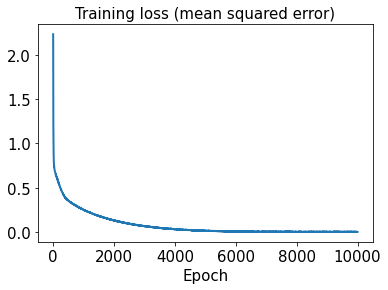

In [22]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

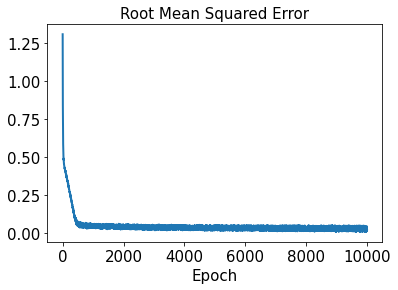

In [23]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [24]:
input_data = tf.keras.Input(shape=(n_sensors, 1))
reshape = tf.keras.layers.Reshape((n_sensors,))(input_data)

x_ = tf.keras.layers.Dense(units=128, activation='relu', name='firstHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(reshape)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='secondHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
x_ = tf.keras.layers.Dense(units=128, activation='relu', name='thirdHiddenLayer',
                         kernel_regularizer=tf.keras.regularizers.l2(0.001))(x_)
x_ = tf.keras.layers.BatchNormalization()(x_)
output_data = tf.keras.layers.Dense(units=101*101, activation=None, name='outputLayer')(x_)
output_img = tf.keras.layers.Reshape((101,101))(output_data)
# Shallow Decoder (SD)
sd1 = tf.keras.Model(input_data, output_img)
sd2 = tf.keras.Model(input_data, output_img)
sd3 = tf.keras.Model(input_data, output_img)

In [25]:
sd1.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 16, 1)]           0         
                                                                 
 reshape_2 (Reshape)         (None, 16)                0         
                                                                 
 firstHiddenLayer (Dense)    (None, 128)               2176      
                                                                 
 batch_normalization_5 (Batc  (None, 128)              512       
 hNormalization)                                                 
                                                                 
 secondHiddenLayer (Dense)   (None, 128)               16512     
                                                                 
 batch_normalization_6 (Batc  (None, 128)              512       
 hNormalization)                                           

In [26]:
sd1.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [27]:
start1 = datetime.datetime.now()
history1 = sd1.fit(x_train1, y_train1, epochs=10000, shuffle=True)
end1 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 14ms/step - loss: 0.5323 - rmse: 0.4952
Epoch 2/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.5269 - rmse: 0.4907
Epoch 3/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.5223 - rmse: 0.4870
Epoch 4/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5179 - rmse: 0.4835
Epoch 5/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5138 - rmse: 0.4803
Epoch 6/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5097 - rmse: 0.4770
Epoch 7/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5064 - rmse: 0.4747
Epoch 8/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5029 - rmse: 0.4720
Epoch 9/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4993 - rmse: 0.4693
Epoch 10/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.4964 - rmse: 0.4672
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 6ms/step - loss: 0.3979 - rmse: 0.4332
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3959 - rmse: 0.4319
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3946 - rmse: 0.4312
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3933 - rmse: 0.4306
Epoch 90/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3924 - rmse: 0.4305
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3914 - rmse: 0.4302
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3900 - rmse: 0.4295
Epoch 93/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3896 - rmse: 0.4298
Epoch 94/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3894 - rmse: 0.4304
Epoch 95/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.3871 - rmse: 0.4287
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 9ms/step - loss: 0.2811 - rmse: 0.3550
Epoch 171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2801 - rmse: 0.3544
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2781 - rmse: 0.3524
Epoch 173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2767 - rmse: 0.3511
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2743 - rmse: 0.3484
Epoch 175/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2723 - rmse: 0.3464
Epoch 176/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2706 - rmse: 0.3446
Epoch 177/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.2697 - rmse: 0.3441
Epoch 178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2675 - rmse: 0.3416
Epoch 179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.2667 - rmse: 0.3413
Epoch 180/10000
2/2 [======================

2/2 [==============================] - 0s 8ms/step - loss: 0.1542 - rmse: 0.1952
Epoch 255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1539 - rmse: 0.1953
Epoch 256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1536 - rmse: 0.1956
Epoch 257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1503 - rmse: 0.1881
Epoch 258/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1490 - rmse: 0.1854
Epoch 259/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1480 - rmse: 0.1838
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1471 - rmse: 0.1824
Epoch 261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1455 - rmse: 0.1791
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1451 - rmse: 0.1791
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1444 - rmse: 0.1781
Epoch 264/10000
2/2 [========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0943 - rmse: 0.0787
Epoch 339/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0938 - rmse: 0.0776
Epoch 340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0931 - rmse: 0.0746
Epoch 341/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0936 - rmse: 0.0798
Epoch 342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0924 - rmse: 0.0735
Epoch 343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0925 - rmse: 0.0764
Epoch 344/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0920 - rmse: 0.0746
Epoch 345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0912 - rmse: 0.0714
Epoch 346/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0915 - rmse: 0.0751
Epoch 347/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0912 - rmse: 0.0749
Epoch 348/10000
2/2 [=======================

2/2 [==============================] - 0s 7ms/step - loss: 0.0703 - rmse: 0.0492
Epoch 423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0705 - rmse: 0.0541
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0691 - rmse: 0.0405
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0681 - rmse: 0.0299
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0693 - rmse: 0.0484
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0690 - rmse: 0.0465
Epoch 428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0683 - rmse: 0.0414
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0676 - rmse: 0.0345
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0673 - rmse: 0.0332
Epoch 431/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0667 - rmse: 0.0274
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0534 - rmse: 0.0245
Epoch 507/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0536 - rmse: 0.0311
Epoch 508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0528 - rmse: 0.0162
Epoch 509/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0527 - rmse: 0.0167
Epoch 510/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0534 - rmse: 0.0342
Epoch 511/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0544 - rmse: 0.0477
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0535 - rmse: 0.0394
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0524 - rmse: 0.0252
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0528 - rmse: 0.0348
Epoch 515/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0518 - rmse: 0.0172
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0427 - rmse: 0.0302
Epoch 591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0420 - rmse: 0.0187
Epoch 592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0419 - rmse: 0.0166
Epoch 593/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0418 - rmse: 0.0178
Epoch 594/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0415 - rmse: 0.0108
Epoch 595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0423 - rmse: 0.0327
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0422 - rmse: 0.0318
Epoch 597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0416 - rmse: 0.0228
Epoch 598/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0411 - rmse: 0.0136
Epoch 599/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0409 - rmse: 0.0106
Epoch 600/10000
2/2 [=======================

2/2 [==============================] - 0s 7ms/step - loss: 0.0339 - rmse: 0.0154
Epoch 675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0339 - rmse: 0.0188
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0336 - rmse: 0.0099
Epoch 677/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0341 - rmse: 0.0264
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0337 - rmse: 0.0193
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0353 - rmse: 0.0460
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0336 - rmse: 0.0211
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0333 - rmse: 0.0145
Epoch 682/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0333 - rmse: 0.0181
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0336 - rmse: 0.0267
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0276 - rmse: 0.0097
Epoch 759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0284 - rmse: 0.0299
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0275 - rmse: 0.0116
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0288 - rmse: 0.0375
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.0294
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0282 - rmse: 0.0319
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0276 - rmse: 0.0210
Epoch 765/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0273 - rmse: 0.0123
Epoch 766/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0272 - rmse: 0.0127
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0277 - rmse: 0.0266
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 10ms/step - loss: 0.0233 - rmse: 0.0181
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0233 - rmse: 0.0194
Epoch 844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0235 - rmse: 0.0248
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0154
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0167
Epoch 847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0229 - rmse: 0.0144
Epoch 848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0232 - rmse: 0.0241
Epoch 849/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0230 - rmse: 0.0202
Epoch 850/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0231 - rmse: 0.0221
Epoch 851/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0227 - rmse: 0.0145
Epoch 852/10000
2/2 [========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0200 - rmse: 0.0223
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0204 - rmse: 0.0310
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0198 - rmse: 0.0206
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0198 - rmse: 0.0220
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0198 - rmse: 0.0221
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0201 - rmse: 0.0279
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0197 - rmse: 0.0211
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0200 - rmse: 0.0283
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0200 - rmse: 0.0278
Epoch 935/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0202 - rmse: 0.0324
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0169 - rmse: 0.0151
Epoch 1011/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0174 - rmse: 0.0271
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0178 - rmse: 0.0337
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0169 - rmse: 0.0175
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0175 - rmse: 0.0300
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0169 - rmse: 0.0196
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0176 - rmse: 0.0323
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0171 - rmse: 0.0253
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0172 - rmse: 0.0279
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0171 - rmse: 0.0249
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0155 - rmse: 0.0312
Epoch 1094/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0161 - rmse: 0.0401
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0153 - rmse: 0.0293
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0155 - rmse: 0.0331
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0156 - rmse: 0.0343
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0148 - rmse: 0.0213
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0149 - rmse: 0.0237
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0149 - rmse: 0.0247
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0145 - rmse: 0.0149
Epoch 1102/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0150 - rmse: 0.0262
Epoch 1103/10000
2/2 [==============

2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.0113
Epoch 1177/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0130 - rmse: 0.0179
Epoch 1178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0127 - rmse: 0.0082
Epoch 1179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0130 - rmse: 0.0189
Epoch 1180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0135 - rmse: 0.0297
Epoch 1181/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.0167
Epoch 1182/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0126 - rmse: 0.0082
Epoch 1183/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0128 - rmse: 0.0160
Epoch 1184/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0126 - rmse: 0.0079
Epoch 1185/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0131 - rmse: 0.0256
Epoch 1186/10000
2/2 [=====

Epoch 1259/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0118 - rmse: 0.0251
Epoch 1260/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0116 - rmse: 0.0228
Epoch 1261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0113 - rmse: 0.0148
Epoch 1262/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0112 - rmse: 0.0090
Epoch 1263/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0117 - rmse: 0.0256
Epoch 1264/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0118 - rmse: 0.0267
Epoch 1265/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0112 - rmse: 0.0127
Epoch 1266/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0115 - rmse: 0.0222
Epoch 1267/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0115 - rmse: 0.0217
Epoch 1268/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0111 - rmse: 0.0100
Epoch 1269

2/2 [==============================] - 0s 11ms/step - loss: 0.0118 - rmse: 0.0445
Epoch 1342/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0101 - rmse: 0.0156
Epoch 1343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0100 - rmse: 0.0142
Epoch 1344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0212
Epoch 1345/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0235
Epoch 1346/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0103 - rmse: 0.0239
Epoch 1347/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0099 - rmse: 0.0127
Epoch 1348/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0099 - rmse: 0.0138
Epoch 1349/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0103 - rmse: 0.0243
Epoch 1350/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0102 - rmse: 0.0226
Epoch 1351/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0092 - rmse: 0.0224
Epoch 1425/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0186
Epoch 1426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0090 - rmse: 0.0184
Epoch 1427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0096 - rmse: 0.0302
Epoch 1428/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0201
Epoch 1429/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0254
Epoch 1430/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0097
Epoch 1431/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0273
Epoch 1432/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0093 - rmse: 0.0270
Epoch 1433/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0186
Epoch 1434/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0296
Epoch 1508/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0079 - rmse: 0.0121
Epoch 1509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0375
Epoch 1510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0140
Epoch 1511/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0083 - rmse: 0.0245
Epoch 1512/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0078
Epoch 1513/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0068
Epoch 1514/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0122
Epoch 1515/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0428
Epoch 1516/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0109
Epoch 1517/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0086 - rmse: 0.0419
Epoch 1591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0079 - rmse: 0.0320
Epoch 1592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0324
Epoch 1593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0078 - rmse: 0.0318
Epoch 1594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0085 - rmse: 0.0407
Epoch 1595/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0204
Epoch 1596/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0172
Epoch 1597/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0320
Epoch 1598/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0435
Epoch 1599/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0079 - rmse: 0.0333
Epoch 1600/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0232
Epoch 1674/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0305
Epoch 1675/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0278
Epoch 1676/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0352
Epoch 1677/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0143
Epoch 1678/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0246
Epoch 1679/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0253
Epoch 1680/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0081 - rmse: 0.0453
Epoch 1681/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0079 - rmse: 0.0438
Epoch 1682/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0298
Epoch 1683/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0244
Epoch 1757/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0142
Epoch 1758/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0449
Epoch 1759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0062 - rmse: 0.0285
Epoch 1760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0158
Epoch 1761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0147
Epoch 1762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0076 - rmse: 0.0473
Epoch 1763/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0239
Epoch 1764/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0223
Epoch 1765/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0312
Epoch 1766/10000
2/2 [========

2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0231
Epoch 1840/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0119
Epoch 1841/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0114
Epoch 1842/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0132
Epoch 1843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0297
Epoch 1844/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0221
Epoch 1845/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0436
Epoch 1846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0049 - rmse: 0.0144
Epoch 1847/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0182
Epoch 1848/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0311
Epoch 1849/10000
2/2 [=====

Epoch 1922/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0173
Epoch 1923/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0155
Epoch 1924/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0052 - rmse: 0.0313
Epoch 1925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0088
Epoch 1926/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0113
Epoch 1927/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0053 - rmse: 0.0335
Epoch 1928/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0174
Epoch 1929/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0212
Epoch 1930/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0285
Epoch 1931/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0164
Epoch 1932

2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0296
Epoch 2005/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0268
Epoch 2006/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0285
Epoch 2007/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0271
Epoch 2008/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0105
Epoch 2009/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0212
Epoch 2010/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0086
Epoch 2011/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0257
Epoch 2012/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0275
Epoch 2013/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0184
Epoch 2014/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0114
Epoch 2088/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0221
Epoch 2089/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0337
Epoch 2090/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0041 - rmse: 0.0276
Epoch 2091/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0284
Epoch 2092/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0125
Epoch 2093/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0326
Epoch 2094/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0176
Epoch 2095/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0254
Epoch 2096/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0049 - rmse: 0.0401
Epoch 2097/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0196
Epoch 2171/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0139
Epoch 2172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0328
Epoch 2173/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0415
Epoch 2174/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0179
Epoch 2175/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0499
Epoch 2176/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0453
Epoch 2177/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0325
Epoch 2178/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0378
Epoch 2179/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0091
Epoch 2180/10000
2/2 [========

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0096
Epoch 2254/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0241
Epoch 2255/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0466
Epoch 2256/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0183
Epoch 2257/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0123
Epoch 2258/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0294
Epoch 2259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0460
Epoch 2260/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0219
Epoch 2261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0329
Epoch 2262/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0215
Epoch 2263/10000
2/2 [=========

2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0139
Epoch 2337/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0336
Epoch 2338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0151
Epoch 2339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0138
Epoch 2340/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0131
Epoch 2341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0334
Epoch 2342/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0375
Epoch 2343/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0231
Epoch 2344/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0305
Epoch 2345/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0236
Epoch 2346/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0259
Epoch 2420/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0217
Epoch 2421/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0272
Epoch 2422/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0330
Epoch 2423/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0322
Epoch 2424/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0132
Epoch 2425/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0305
Epoch 2426/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0294
Epoch 2427/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0110
Epoch 2428/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0251
Epoch 2429/10000
2/2 [======

2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0421
Epoch 2503/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0305
Epoch 2504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0217
Epoch 2505/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0207
Epoch 2506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0336
Epoch 2507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0219
Epoch 2508/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0245
Epoch 2509/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0215
Epoch 2510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0355
Epoch 2511/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0323
Epoch 2512/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0322
Epoch 2586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0320
Epoch 2587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0074
Epoch 2588/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0455
Epoch 2589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0260
Epoch 2590/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0204
Epoch 2591/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0230
Epoch 2592/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0094
Epoch 2593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0179
Epoch 2594/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0284
Epoch 2595/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0366
Epoch 2669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0196
Epoch 2670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0369
Epoch 2671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0055
Epoch 2672/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0097
Epoch 2673/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0312
Epoch 2674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0320
Epoch 2675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0255
Epoch 2676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0397
Epoch 2677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0318
Epoch 2678/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0412
Epoch 2752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0269
Epoch 2753/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0296
Epoch 2754/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0279
Epoch 2755/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0291
Epoch 2756/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0247
Epoch 2757/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0334
Epoch 2758/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0118
Epoch 2759/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0332
Epoch 2760/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0194
Epoch 2761/10000
2/2 [======

Epoch 2834/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0157
Epoch 2835/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0314
Epoch 2836/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0215
Epoch 2837/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0313
Epoch 2838/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0279
Epoch 2839/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0189
Epoch 2840/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0111
Epoch 2841/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0163
Epoch 2842/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0428
Epoch 2843/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0190
Epoch 2844/

2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0268
Epoch 2917/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0285
Epoch 2918/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0208
Epoch 2919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0310
Epoch 2920/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0185
Epoch 2921/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0302
Epoch 2922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0246
Epoch 2923/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0177
Epoch 2924/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0308
Epoch 2925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0182
Epoch 2926/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0336
Epoch 2999/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0227
Epoch 3000/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0207
Epoch 3001/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0387
Epoch 3002/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0325
Epoch 3003/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0189
Epoch 3004/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0141
Epoch 3005/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0290
Epoch 3006/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0132
Epoch 3007/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0458
Epoch 3008/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0187
Epoch 3081/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8616e-04 - rmse: 0.0078
Epoch 3082/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0146
Epoch 3083/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4645e-04 - rmse: 0.0111
Epoch 3084/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.9635e-04 - rmse: 0.0086
Epoch 3085/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8493e-04 - rmse: 0.0080
Epoch 3086/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6298e-04 - rmse: 0.0065
Epoch 3087/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0314
Epoch 3088/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5557e-04 - rmse: 0.0117
Epoch 3089/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1049e-04 - rmse: 0.0097

2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0202
Epoch 3162/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0270
Epoch 3163/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0427
Epoch 3164/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5076e-04 - rmse: 0.0103
Epoch 3165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0328
Epoch 3166/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0322
Epoch 3167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0169
Epoch 3168/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0180
Epoch 3169/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6726e-04 - rmse: 0.0113
Epoch 3170/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0230
Epoch 3171/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 8.4522e-04 - rmse: 0.0130
Epoch 3243/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0265
Epoch 3244/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9952e-04 - rmse: 0.0112
Epoch 3245/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0324
Epoch 3246/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0211
Epoch 3247/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0292
Epoch 3248/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1190e-04 - rmse: 0.0063
Epoch 3249/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7285e-04 - rmse: 0.0101
Epoch 3250/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0268
Epoch 3251/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8727e-04 - rmse: 0.0109
Epoch 3

2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0463
Epoch 3324/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0348
Epoch 3325/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3425e-04 - rmse: 0.0148
Epoch 3326/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0333
Epoch 3327/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9139e-04 - rmse: 0.0133
Epoch 3328/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8142e-04 - rmse: 0.0192
Epoch 3329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0214
Epoch 3330/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0270
Epoch 3331/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0217
Epoch 3332/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4623e-04 - rmse: 0.0183
Epoch 3333/

2/2 [==============================] - 0s 11ms/step - loss: 7.5636e-04 - rmse: 0.0140
Epoch 3405/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0341
Epoch 3406/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0026 - rmse: 0.0455
Epoch 3407/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6076e-04 - rmse: 0.0201
Epoch 3408/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.7448e-04 - rmse: 0.0178
Epoch 3409/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0316
Epoch 3410/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0286
Epoch 3411/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0954e-04 - rmse: 0.0188
Epoch 3412/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7600e-04 - rmse: 0.0205
Epoch 3413/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0300
Epoch 3

2/2 [==============================] - 0s 11ms/step - loss: 6.7933e-04 - rmse: 0.0130
Epoch 3486/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0338
Epoch 3487/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0235
Epoch 3488/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0326
Epoch 3489/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0300
Epoch 3490/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0260
Epoch 3491/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5417e-04 - rmse: 0.0186
Epoch 3492/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0313
Epoch 3493/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5470e-04 - rmse: 0.0187
Epoch 3494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0240
Epoch 3495/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0317
Epoch 3567/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8481e-04 - rmse: 0.0108
Epoch 3568/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2258e-04 - rmse: 0.0160
Epoch 3569/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0302
Epoch 3570/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3698e-04 - rmse: 0.0084
Epoch 3571/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0277
Epoch 3572/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0307
Epoch 3573/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.7382e-04 - rmse: 0.0225
Epoch 3574/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.1351e-04 - rmse: 0.0187
Epoch 3575/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0242
Epoch 3

2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0331
Epoch 3648/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0323
Epoch 3649/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4219e-04 - rmse: 0.0107
Epoch 3650/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1016e-04 - rmse: 0.0168
Epoch 3651/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0292e-04 - rmse: 0.0132
Epoch 3652/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0401
Epoch 3653/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4181e-04 - rmse: 0.0107
Epoch 3654/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1883e-04 - rmse: 0.0222
Epoch 3655/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5938e-04 - rmse: 0.0058
Epoch 3656/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5145e-04 - rmse: 0.0229

2/2 [==============================] - 0s 10ms/step - loss: 5.1072e-04 - rmse: 0.0108
Epoch 3729/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0315
Epoch 3730/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0305
Epoch 3731/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0291
Epoch 3732/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5702e-04 - rmse: 0.0191
Epoch 3733/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6792e-04 - rmse: 0.0087
Epoch 3734/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6560e-04 - rmse: 0.0086
Epoch 3735/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.9744e-04 - rmse: 0.0175
Epoch 3736/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0298
Epoch 3737/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5399e-04 - rmse: 0.0191
Epoc

2/2 [==============================] - 0s 10ms/step - loss: 4.9589e-04 - rmse: 0.0116
Epoch 3810/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.2807e-04 - rmse: 0.0191
Epoch 3811/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0313
Epoch 3812/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1020e-04 - rmse: 0.0234
Epoch 3813/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0430
Epoch 3814/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0281
Epoch 3815/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8901e-04 - rmse: 0.0207
Epoch 3816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0278
Epoch 3817/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8214e-04 - rmse: 0.0048
Epoch 3818/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1543e-04 - rmse: 0.0189
Epoc

2/2 [==============================] - 0s 10ms/step - loss: 4.7707e-04 - rmse: 0.0120
Epoch 3891/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0285
Epoch 3892/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6020e-04 - rmse: 0.0151
Epoch 3893/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0260
Epoch 3894/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4528e-04 - rmse: 0.0177
Epoch 3895/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8866e-04 - rmse: 0.0076
Epoch 3896/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0483
Epoch 3897/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9727e-04 - rmse: 0.0238
Epoch 3898/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0350
Epoch 3899/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0460
Epoch 3

2/2 [==============================] - 0s 10ms/step - loss: 3.7503e-04 - rmse: 0.0083
Epoch 3972/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.2421e-04 - rmse: 0.0179
Epoch 3973/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.0214e-04 - rmse: 0.0223
Epoch 3974/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8973e-04 - rmse: 0.0196
Epoch 3975/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0280
Epoch 3976/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3774e-04 - rmse: 0.0153
Epoch 3977/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0275
Epoch 3978/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0316
Epoch 3979/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4444e-04 - rmse: 0.0253
Epoch 3980/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0328
Epoc

2/2 [==============================] - 0s 10ms/step - loss: 7.3671e-04 - rmse: 0.0213
Epoch 4052/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0275
Epoch 4053/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2555e-04 - rmse: 0.0120
Epoch 4054/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0273
Epoch 4055/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4424e-04 - rmse: 0.0257
Epoch 4056/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.4314e-04 - rmse: 0.0078
Epoch 4057/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0365
Epoch 4058/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0275
Epoch 4059/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0292
Epoch 4060/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6058e-04 - rmse: 0.0089
Epoch 40

2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0294
Epoch 4132/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3986e-04 - rmse: 0.0195
Epoch 4133/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1688e-04 - rmse: 0.0125
Epoch 4134/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0023e-04 - rmse: 0.0210
Epoch 4135/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3734e-04 - rmse: 0.0133
Epoch 4136/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0412
Epoch 4137/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8867e-04 - rmse: 0.0251
Epoch 4138/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0328
Epoch 4139/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0432
Epoch 4140/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0455
Epoch 414

2/2 [==============================] - 0s 10ms/step - loss: 4.7310e-04 - rmse: 0.0153
Epoch 4212/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2389e-04 - rmse: 0.0242
Epoch 4213/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3289e-04 - rmse: 0.0096
Epoch 4214/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4213e-04 - rmse: 0.0174
Epoch 4215/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.5696e-04 - rmse: 0.0227
Epoch 4216/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0329
Epoch 4217/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0357e-04 - rmse: 0.0258
Epoch 4218/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0288
Epoch 4219/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0333
Epoch 4220/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3822e-04 - rmse: 0.0173


2/2 [==============================] - 0s 10ms/step - loss: 6.2621e-04 - rmse: 0.0201
Epoch 4292/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9869e-04 - rmse: 0.0133
Epoch 4293/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.6773e-04 - rmse: 0.0186
Epoch 4294/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8272e-04 - rmse: 0.0161
Epoch 4295/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0330
Epoch 4296/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4751e-04 - rmse: 0.0112
Epoch 4297/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2435e-04 - rmse: 0.0101
Epoch 4298/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0372e-04 - rmse: 0.0168
Epoch 4299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0365
Epoch 4300/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7413e-04 - rmse: 0.01

2/2 [==============================] - 0s 12ms/step - loss: 9.1528e-04 - rmse: 0.0266
Epoch 4372/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.9312e-04 - rmse: 0.0281
Epoch 4373/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5119e-04 - rmse: 0.0211
Epoch 4374/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4303e-04 - rmse: 0.0184
Epoch 4375/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0282
Epoch 4376/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8798e-04 - rmse: 0.0241
Epoch 4377/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0285
Epoch 4378/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0054e-04 - rmse: 0.0098
Epoch 4379/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0318
Epoch 4380/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0458e-04 - rmse: 0.0265
E

2/2 [==============================] - 0s 10ms/step - loss: 8.7274e-04 - rmse: 0.0261
Epoch 4453/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9876e-04 - rmse: 0.0144
Epoch 4454/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0314
Epoch 4455/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0301
Epoch 4456/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3396e-04 - rmse: 0.0156
Epoch 4457/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0343
Epoch 4458/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1913e-04 - rmse: 0.0270
Epoch 4459/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0290
Epoch 4460/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0291
Epoch 4461/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1852e-04 - rmse: 0.0152
Epoch 4

2/2 [==============================] - 0s 9ms/step - loss: 6.5937e-04 - rmse: 0.0220
Epoch 4533/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5419e-04 - rmse: 0.0134
Epoch 4534/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6715e-04 - rmse: 0.0281
Epoch 4535/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3096e-04 - rmse: 0.0125
Epoch 4536/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0371
Epoch 4537/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6588e-04 - rmse: 0.0171
Epoch 4538/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7851e-04 - rmse: 0.0102
Epoch 4539/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.4937e-04 - rmse: 0.0166
Epoch 4540/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4243e-04 - rmse: 0.0259
Epoch 4541/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8218e-04 - rmse: 0

2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0455
Epoch 4613/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0367
Epoch 4614/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0313
Epoch 4615/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 4616/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0181e-04 - rmse: 0.0184
Epoch 4617/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0343
Epoch 4618/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0449
Epoch 4619/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0351
Epoch 4620/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0300
Epoch 4621/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9739e-04 - rmse: 0.0183
Epoch 4622/10000
2/2

2/2 [==============================] - 0s 10ms/step - loss: 5.9341e-04 - rmse: 0.0210
Epoch 4694/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8453e-04 - rmse: 0.0208
Epoch 4695/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7045e-04 - rmse: 0.0148
Epoch 4696/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 4697/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2996e-04 - rmse: 0.0089
Epoch 4698/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9303e-04 - rmse: 0.0290
Epoch 4699/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1223e-04 - rmse: 0.0190
Epoch 4700/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2673e-04 - rmse: 0.0088
Epoch 4701/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.3336e-04 - rmse: 0.0196
Epoch 4702/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3712e-04 - rmse: 

2/2 [==============================] - 0s 10ms/step - loss: 6.4465e-04 - rmse: 0.0225
Epoch 4774/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9643e-04 - rmse: 0.0256
Epoch 4775/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0450
Epoch 4776/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4360e-04 - rmse: 0.0225
Epoch 4777/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6081e-04 - rmse: 0.0229
Epoch 4778/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0336
Epoch 4779/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0311
Epoch 4780/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0158e-04 - rmse: 0.0258
Epoch 4781/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 4782/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.8796e-04 - rmse: 0.0292
Epoch 

2/2 [==============================] - 0s 10ms/step - loss: 7.1326e-04 - rmse: 0.0242
Epoch 4854/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0394
Epoch 4855/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4530e-04 - rmse: 0.0286
Epoch 4856/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1805e-04 - rmse: 0.0138
Epoch 4857/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1996e-04 - rmse: 0.0096
Epoch 4858/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4116e-04 - rmse: 0.0106
Epoch 4859/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1758e-04 - rmse: 0.0243
Epoch 4860/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4926e-04 - rmse: 0.0149
Epoch 4861/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6719e-04 - rmse: 0.0118
Epoch 4862/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.03

2/2 [==============================] - 0s 10ms/step - loss: 4.0746e-04 - rmse: 0.0170
Epoch 4934/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8695e-04 - rmse: 0.0258
Epoch 4935/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0334
Epoch 4936/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3356e-04 - rmse: 0.0147
Epoch 4937/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9884e-04 - rmse: 0.0134
Epoch 4938/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1628e-04 - rmse: 0.0141
Epoch 4939/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0384
Epoch 4940/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7563e-04 - rmse: 0.0214
Epoch 4941/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2893e-04 - rmse: 0.0285
Epoch 4942/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6442e-04 - rmse: 0.0

2/2 [==============================] - 0s 12ms/step - loss: 2.9043e-04 - rmse: 0.0134
Epoch 5014/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1125e-04 - rmse: 0.0265
Epoch 5015/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8338e-04 - rmse: 0.0260
Epoch 5016/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3913e-04 - rmse: 0.0055
Epoch 5017/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9101e-04 - rmse: 0.0135
Epoch 5018/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0303
Epoch 5019/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2746e-04 - rmse: 0.0148
Epoch 5020/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 5021/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6132e-04 - rmse: 0.0213
Epoch 5022/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1948e-04 - rmse: 0.0

2/2 [==============================] - 0s 12ms/step - loss: 3.5907e-04 - rmse: 0.0161
Epoch 5094/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.9786e-04 - rmse: 0.0299
Epoch 5095/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0430
Epoch 5096/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9119e-04 - rmse: 0.0281
Epoch 5097/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 5098/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9160e-04 - rmse: 0.0095
Epoch 5099/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9148e-04 - rmse: 0.0198
Epoch 5100/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 5101/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.6280e-04 - rmse: 0.0237
Epoch 5102/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7908e-04 - rmse: 0.0089

2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0435
Epoch 5174/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.5575e-04 - rmse: 0.0215
Epoch 5175/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6091e-04 - rmse: 0.0164
Epoch 5176/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0331
Epoch 5177/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0409
Epoch 5178/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 5179/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2868e-04 - rmse: 0.0231
Epoch 5180/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0455
Epoch 5181/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5579e-04 - rmse: 0.0191
Epoch 5182/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0359
Epoch 5183/1

2/2 [==============================] - 0s 12ms/step - loss: 1.3431e-04 - rmse: 0.0069
Epoch 5254/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8934e-04 - rmse: 0.0283
Epoch 5255/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.7295e-04 - rmse: 0.0093
Epoch 5256/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2141e-04 - rmse: 0.0059
Epoch 5257/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 5258/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2974e-04 - rmse: 0.0156
Epoch 5259/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7907e-04 - rmse: 0.0282
Epoch 5260/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7988e-04 - rmse: 0.0282
Epoch 5261/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 5262/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5358e-04 - rmse: 0.02

2/2 [==============================] - 0s 10ms/step - loss: 9.6943e-04 - rmse: 0.0298
Epoch 5334/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6526e-04 - rmse: 0.0093
Epoch 5335/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8119e-04 - rmse: 0.0265
Epoch 5336/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0313
Epoch 5337/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5031e-04 - rmse: 0.0165
Epoch 5338/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0976e-04 - rmse: 0.0230
Epoch 5339/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 5340/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5459e-04 - rmse: 0.0087
Epoch 5341/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9698e-04 - rmse: 0.0204
Epoch 5342/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1863e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 7.1871e-04 - rmse: 0.0254
Epoch 5414/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 5415/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0024e-04 - rmse: 0.0230
Epoch 5416/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0160e-04 - rmse: 0.0113
Epoch 5417/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.8714e-04 - rmse: 0.0107
Epoch 5418/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7552e-04 - rmse: 0.0300
Epoch 5419/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1578e-04 - rmse: 0.0290
Epoch 5420/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0879e-04 - rmse: 0.0116
Epoch 5421/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6470e-04 - rmse: 0.0222
Epoch 5422/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 2.7847e-04 - rmse: 0.0145
Epoch 5494/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4172e-04 - rmse: 0.0165
Epoch 5495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 5496/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5295e-04 - rmse: 0.0092
Epoch 5497/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3341e-04 - rmse: 0.0294
Epoch 5498/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.4888e-04 - rmse: 0.0135
Epoch 5499/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3044e-05 - rmse: 0.0040
Epoch 5500/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0434
Epoch 5501/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2207e-04 - rmse: 0.0256
Epoch 5502/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0526e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 3.0085e-04 - rmse: 0.0154
Epoch 5574/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0371e-04 - rmse: 0.0155
Epoch 5575/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8873e-04 - rmse: 0.0112
Epoch 5576/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2258e-04 - rmse: 0.0237
Epoch 5577/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2877e-04 - rmse: 0.0163
Epoch 5578/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.0351e-04 - rmse: 0.0210
Epoch 5579/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7766e-05 - rmse: 0.0060
Epoch 5580/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5709e-04 - rmse: 0.0244
Epoch 5581/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.1728e-04 - rmse: 0.0075
Epoch 5582/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3569e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 1.8772e-04 - rmse: 0.0114
Epoch 5654/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.3386e-04 - rmse: 0.0279
Epoch 5655/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4898e-04 - rmse: 0.0299
Epoch 5656/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 5657/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5258e-04 - rmse: 0.0098
Epoch 5658/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 5659/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0425
Epoch 5660/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7297e-04 - rmse: 0.0204
Epoch 5661/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0459
Epoch 5662/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9844e-04 - rmse: 0.0210
Epoc

2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 5734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 5735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 5736/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0207e-04 - rmse: 0.0187
Epoch 5737/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6115e-04 - rmse: 0.0176
Epoch 5738/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9358e-04 - rmse: 0.0210
Epoch 5739/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2864e-04 - rmse: 0.0218
Epoch 5740/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5084e-04 - rmse: 0.0264
Epoch 5741/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6408e-04 - rmse: 0.0247
Epoch 5742/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0416e-04 - rmse: 0.0188
E

2/2 [==============================] - 0s 9ms/step - loss: 1.1187e-04 - rmse: 0.0080
Epoch 5814/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7037e-04 - rmse: 0.0180
Epoch 5815/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0828e-04 - rmse: 0.0078
Epoch 5816/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0362
Epoch 5817/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 5818/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9203e-05 - rmse: 0.0056
Epoch 5819/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 5820/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4336e-04 - rmse: 0.0172
Epoch 5821/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8376e-04 - rmse: 0.0154
Epoch 5822/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3748e-05 - rmse: 0.0060


2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 5894/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0320
Epoch 5895/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 5896/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 5897/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6477e-04 - rmse: 0.0110
Epoch 5898/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1182e-04 - rmse: 0.0238
Epoch 5899/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.7450e-04 - rmse: 0.0182
Epoch 5900/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 5901/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2924e-04 - rmse: 0.0136
Epoch 5902/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4300e-04 - rmse: 0.0223
Epoch 5903

2/2 [==============================] - 0s 10ms/step - loss: 8.4960e-04 - rmse: 0.0285
Epoch 5974/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0492
Epoch 5975/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4733e-04 - rmse: 0.0202
Epoch 5976/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8833e-04 - rmse: 0.0234
Epoch 5977/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4218e-04 - rmse: 0.0224
Epoch 5978/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0333
Epoch 5979/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7510e-04 - rmse: 0.0252
Epoch 5980/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9224e-04 - rmse: 0.0213
Epoch 5981/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1569e-04 - rmse: 0.0296
Epoch 5982/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4490e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 6.4050e-04 - rmse: 0.0246
Epoch 6054/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2831e-04 - rmse: 0.0281
Epoch 6055/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5493e-04 - rmse: 0.0148
Epoch 6056/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3621e-05 - rmse: 0.0076
Epoch 6057/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9286e-05 - rmse: 0.0066
Epoch 6058/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.4379e-04 - rmse: 0.0266
Epoch 6059/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0870e-05 - rmse: 0.0074
Epoch 6060/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 6061/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7749e-04 - rmse: 0.0253
Epoch 6062/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.0043e-05 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 9.5199e-04 - rmse: 0.0303
Epoch 6134/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9437e-04 - rmse: 0.0162
Epoch 6135/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2961e-04 - rmse: 0.0140
Epoch 6136/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6863e-04 - rmse: 0.0183
Epoch 6137/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 6138/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.4942e-04 - rmse: 0.0268
Epoch 6139/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2561e-04 - rmse: 0.0139
Epoch 6140/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8420e-04 - rmse: 0.0308
Epoch 6141/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4092e-04 - rmse: 0.0225
Epoch 6142/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3525e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 6214/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3449e-04 - rmse: 0.0102
Epoch 6215/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.0954e-05 - rmse: 0.0064
Epoch 6216/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6228e-04 - rmse: 0.0305
Epoch 6217/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.6363e-05 - rmse: 0.0082
Epoch 6218/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9010e-04 - rmse: 0.0237
Epoch 6219/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6844e-04 - rmse: 0.0154
Epoch 6220/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2776e-04 - rmse: 0.0099
Epoch 6221/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 6222/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0317
Ep

2/2 [==============================] - 0s 10ms/step - loss: 9.9561e-04 - rmse: 0.0311
Epoch 6294/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9517e-04 - rmse: 0.0216
Epoch 6295/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8847e-05 - rmse: 0.0064
Epoch 6296/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2922e-04 - rmse: 0.0174
Epoch 6297/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 6298/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 6299/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3604e-04 - rmse: 0.0104
Epoch 6300/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7449e-05 - rmse: 0.0071
Epoch 6301/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6785e-04 - rmse: 0.0307
Epoch 6302/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3641e-04 - rmse: 0.0

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 6374/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6375/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9040e-04 - rmse: 0.0277
Epoch 6376/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2611e-04 - rmse: 0.0174
Epoch 6377/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1792e-04 - rmse: 0.0171
Epoch 6378/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8964e-04 - rmse: 0.0238
Epoch 6379/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2359e-04 - rmse: 0.0141
Epoch 6380/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3412e-04 - rmse: 0.0202
Epoch 6381/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3762e-04 - rmse: 0.0177
Epoch 6382/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466

2/2 [==============================] - 0s 11ms/step - loss: 9.3279e-04 - rmse: 0.0302
Epoch 6454/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6569e-04 - rmse: 0.0254
Epoch 6455/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4655e-04 - rmse: 0.0206
Epoch 6456/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 6457/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8774e-04 - rmse: 0.0311
Epoch 6458/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8796e-04 - rmse: 0.0277
Epoch 6459/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 6460/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1458e-04 - rmse: 0.0243
Epoch 6461/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.6651e-04 - rmse: 0.0273
Epoch 6462/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.0787e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 8.0580e-04 - rmse: 0.0280
Epoch 6534/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7129e-04 - rmse: 0.0187
Epoch 6535/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3804e-04 - rmse: 0.0109
Epoch 6536/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 6537/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6451e-04 - rmse: 0.0120
Epoch 6538/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8204e-04 - rmse: 0.0310
Epoch 6539/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4045e-04 - rmse: 0.0228
Epoch 6540/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6190e-04 - rmse: 0.0307
Epoch 6541/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 6542/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0089e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 8.0912e-04 - rmse: 0.0281
Epoch 6614/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0585e-04 - rmse: 0.0298
Epoch 6615/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 6616/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1736e-04 - rmse: 0.0264
Epoch 6617/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7127e-04 - rmse: 0.0159
Epoch 6618/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.6248e-04 - rmse: 0.0273
Epoch 6619/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7417e-04 - rmse: 0.0160
Epoch 6620/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6038e-04 - rmse: 0.0156
Epoch 6621/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 6622/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.7245e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 6.6360e-04 - rmse: 0.0254
Epoch 6694/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1889e-04 - rmse: 0.0142
Epoch 6695/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0760e-04 - rmse: 0.0198
Epoch 6696/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2790e-04 - rmse: 0.0302
Epoch 6697/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6698/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2294e-04 - rmse: 0.0175
Epoch 6699/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8502e-04 - rmse: 0.0164
Epoch 6700/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3839e-04 - rmse: 0.0205
Epoch 6701/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0975e-04 - rmse: 0.0198
Epoch 6702/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.0113e-04 - rmse

2/2 [==============================] - 0s 9ms/step - loss: 3.6940e-04 - rmse: 0.0188
Epoch 6774/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6775/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6776/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0159e-04 - rmse: 0.0169
Epoch 6777/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7850e-04 - rmse: 0.0258
Epoch 6778/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 6779/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1740e-04 - rmse: 0.0174
Epoch 6780/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5896e-05 - rmse: 0.0064
Epoch 6781/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0631e-05 - rmse: 0.0023
Epoch 6782/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4572e-04 - rmse: 0.0152
E

2/2 [==============================] - 0s 9ms/step - loss: 6.4046e-04 - rmse: 0.0250
Epoch 6854/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.7222e-04 - rmse: 0.0236
Epoch 6855/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2271e-04 - rmse: 0.0202
Epoch 6856/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3186e-04 - rmse: 0.0178
Epoch 6857/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3278e-04 - rmse: 0.0179
Epoch 6858/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.1608e-05 - rmse: 0.0069
Epoch 6859/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 6860/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3492e-04 - rmse: 0.0269
Epoch 6861/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5113e-04 - rmse: 0.0252
Epoch 6862/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1312e-05 - rmse: 0.

2/2 [==============================] - 0s 7ms/step - loss: 5.0980e-04 - rmse: 0.0223
Epoch 6934/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4458e-04 - rmse: 0.0152
Epoch 6935/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8645e-04 - rmse: 0.0278
Epoch 6936/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4238e-04 - rmse: 0.0251
Epoch 6937/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8966e-04 - rmse: 0.0279
Epoch 6938/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.4811e-05 - rmse: 0.0085
Epoch 6939/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1104e-04 - rmse: 0.0223
Epoch 6940/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.1161e-04 - rmse: 0.0223
Epoch 6941/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7470e-05 - rmse: 0.0086
Epoch 6942/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7781e-05 - rmse: 0.00

2/2 [==============================] - 0s 10ms/step - loss: 7.2113e-04 - rmse: 0.0266
Epoch 7015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7016/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5941e-04 - rmse: 0.0157
Epoch 7017/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 7018/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4771e-04 - rmse: 0.0306
Epoch 7019/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4400e-04 - rmse: 0.0152
Epoch 7020/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8150e-04 - rmse: 0.0164
Epoch 7021/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5948e-04 - rmse: 0.0157
Epoch 7022/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.3214e-04 - rmse: 0.0110
Epoch 7023/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.3147e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7095/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6558e-04 - rmse: 0.0160
Epoch 7096/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.6758e-04 - rmse: 0.0309
Epoch 7097/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9285e-04 - rmse: 0.0280
Epoch 7098/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7499e-04 - rmse: 0.0294
Epoch 7099/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 7100/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.5086e-05 - rmse: 0.0092
Epoch 7101/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.4616e-05 - rmse: 0.0037
Epoch 7102/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3803e-05 - rmse: 0.0036
Epoch 7103/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1875e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 6.5650e-04 - rmse: 0.0254
Epoch 7175/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1317e-04 - rmse: 0.0265
Epoch 7176/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2561e-04 - rmse: 0.0147
Epoch 7177/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1684e-04 - rmse: 0.0202
Epoch 7178/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4647e-04 - rmse: 0.0154
Epoch 7179/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5655e-04 - rmse: 0.0291
Epoch 7180/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7181/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2525e-04 - rmse: 0.0178
Epoch 7182/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.1576e-04 - rmse: 0.0225
Epoch 7183/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4623e-05 - rmse

2/2 [==============================] - 0s 12ms/step - loss: 4.6962e-04 - rmse: 0.0215
Epoch 7255/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3757e-04 - rmse: 0.0151
Epoch 7256/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.6021e-04 - rmse: 0.0123
Epoch 7257/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7550e-04 - rmse: 0.0294
Epoch 7258/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1909e-04 - rmse: 0.0105
Epoch 7259/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.5996e-04 - rmse: 0.0123
Epoch 7260/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4834e-04 - rmse: 0.0290
Epoch 7261/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.6054e-04 - rmse: 0.0212
Epoch 7262/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6321e-04 - rmse: 0.0124
Epoch 7263/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4756e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 1.4643e-04 - rmse: 0.0117
Epoch 7335/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.1403e-04 - rmse: 0.0266
Epoch 7336/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8481e-04 - rmse: 0.0312
Epoch 7337/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4203e-04 - rmse: 0.0231
Epoch 7338/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2371e-04 - rmse: 0.0107
Epoch 7339/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 7340/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8933e-04 - rmse: 0.0297
Epoch 7341/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5999e-04 - rmse: 0.0158
Epoch 7342/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.2135e-05 - rmse: 0.0058
Epoch 7343/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0288e-04 - rmse

2/2 [==============================] - 0s 11ms/step - loss: 6.4990e-04 - rmse: 0.0253
Epoch 7415/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7898e-04 - rmse: 0.0278
Epoch 7416/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.9937e-04 - rmse: 0.0171
Epoch 7417/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.0455e-04 - rmse: 0.0098
Epoch 7418/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4297e-04 - rmse: 0.0231
Epoch 7419/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1552e-05 - rmse: 0.0058
Epoch 7420/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.2070e-04 - rmse: 0.0106
Epoch 7421/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.1819e-05 - rmse: 0.0086
Epoch 7422/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2590e-05 - rmse: 0.0038
Epoch 7423/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8935e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 2.4093e-04 - rmse: 0.0153
Epoch 7495/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 7496/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7985e-04 - rmse: 0.0165
Epoch 7497/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.5193e-04 - rmse: 0.0307
Epoch 7498/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.8277e-05 - rmse: 0.0084
Epoch 7499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7500/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1300e-04 - rmse: 0.0201
Epoch 7501/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8087e-04 - rmse: 0.0278
Epoch 7502/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2529e-04 - rmse: 0.0303
Epoch 7503/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.4622e-05 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 8.5700e-04 - rmse: 0.0291
Epoch 7575/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4074e-04 - rmse: 0.0252
Epoch 7576/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2643e-04 - rmse: 0.0179
Epoch 7577/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1676e-04 - rmse: 0.0266
Epoch 7578/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2388e-04 - rmse: 0.0204
Epoch 7579/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9435e-04 - rmse: 0.0281
Epoch 7580/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2645e-04 - rmse: 0.0179
Epoch 7581/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6117e-04 - rmse: 0.0292
Epoch 7582/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1706e-05 - rmse: 0.0049
Epoch 7583/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7872e-04 - 

2/2 [==============================] - 0s 11ms/step - loss: 4.7580e-05 - rmse: 0.0064
Epoch 7655/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3529e-04 - rmse: 0.0251
Epoch 7656/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 7657/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.5076e-04 - rmse: 0.0290
Epoch 7658/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6722e-04 - rmse: 0.0237
Epoch 7659/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.1865e-06 - rmse: 0.0014
Epoch 7660/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.2126e-04 - rmse: 0.0146
Epoch 7661/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0367e-04 - rmse: 0.0223
Epoch 7662/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4938e-04 - rmse: 0.0307
Epoch 7663/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4941e-04 - rmse

2/2 [==============================] - 0s 10ms/step - loss: 7.0987e-04 - rmse: 0.0265
Epoch 7735/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4247e-04 - rmse: 0.0209
Epoch 7736/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6866e-04 - rmse: 0.0162
Epoch 7737/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6287e-06 - rmse: 9.2626e-04
Epoch 7738/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2089e-04 - rmse: 0.0302
Epoch 7739/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7162e-04 - rmse: 0.0163
Epoch 7740/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 7741/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9296e-04 - rmse: 0.0169
Epoch 7742/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.6029e-04 - rmse: 0.0309
Epoch 7743/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0354e-04 - 

2/2 [==============================] - 0s 10ms/step - loss: 2.6982e-04 - rmse: 0.0162
Epoch 7815/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3172e-05 - rmse: 0.0082
Epoch 7816/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.9631e-05 - rmse: 0.0066
Epoch 7817/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6799e-05 - rmse: 0.0078
Epoch 7818/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2664e-05 - rmse: 0.0075
Epoch 7819/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9055e-05 - rmse: 0.0072
Epoch 7820/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4553e-05 - rmse: 0.0053
Epoch 7821/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2196e-04 - rmse: 0.0178
Epoch 7822/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1803e-04 - rmse: 0.0177
Epoch 7823/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6853e-05 - r

2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 7895/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3436e-04 - rmse: 0.0113
Epoch 7896/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 7897/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 7898/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1496e-04 - rmse: 0.0266
Epoch 7899/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.6489e-04 - rmse: 0.0126
Epoch 7900/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5509e-04 - rmse: 0.0122
Epoch 7901/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 7902/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 7903/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9302e-04 - rmse: 0.0242
Epoch 7

2/2 [==============================] - 0s 10ms/step - loss: 1.4811e-04 - rmse: 0.0119
Epoch 7975/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.8283e-04 - rmse: 0.0313
Epoch 7976/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.2054e-04 - rmse: 0.0285
Epoch 7977/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.5069e-04 - rmse: 0.0186
Epoch 7978/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6126e-04 - rmse: 0.0160
Epoch 7979/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5732e-04 - rmse: 0.0292
Epoch 7980/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2507e-04 - rmse: 0.0179
Epoch 7981/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2792e-04 - rmse: 0.0304
Epoch 7982/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4981e-05 - rmse: 0.0054
Epoch 7983/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8579e-04 - 

2/2 [==============================] - 0s 12ms/step - loss: 4.2320e-04 - rmse: 0.0204
Epoch 8055/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1355e-04 - rmse: 0.0104
Epoch 8056/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.1278e-05 - rmse: 0.0087
Epoch 8057/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2877e-04 - rmse: 0.0180
Epoch 8058/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3777e-05 - rmse: 0.0042
Epoch 8059/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8121e-04 - rmse: 0.0132
Epoch 8060/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.1642e-05 - rmse: 0.0051
Epoch 8061/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 8062/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8616e-04 - rmse: 0.0279
Epoch 8063/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8811e-05 - rmse: 

2/2 [==============================] - 0s 10ms/step - loss: 3.6435e-04 - rmse: 0.0189
Epoch 8135/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7603e-04 - rmse: 0.0312
Epoch 8136/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7116e-04 - rmse: 0.0277
Epoch 8137/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 8138/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 8139/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 8140/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0352
Epoch 8141/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3812e-04 - rmse: 0.0251
Epoch 8142/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.5059e-04 - rmse: 0.0233
Epoch 8143/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.8397e-04 - rmse: 0.0194
Epoch

2/2 [==============================] - 0s 10ms/step - loss: 2.6265e-04 - rmse: 0.0160
Epoch 8215/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5419e-04 - rmse: 0.0212
Epoch 8216/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7246e-05 - rmse: 0.0085
Epoch 8217/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3856e-05 - rmse: 0.0029
Epoch 8218/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7572e-04 - rmse: 0.0278
Epoch 8219/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1896e-04 - rmse: 0.0146
Epoch 8220/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6811e-04 - rmse: 0.0162
Epoch 8221/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9332e-05 - rmse: 0.0080
Epoch 8222/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.3886e-04 - rmse: 0.0252
Epoch 8223/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5985e-04 - rm

2/2 [==============================] - 0s 11ms/step - loss: 3.2316e-04 - rmse: 0.0178
Epoch 8295/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2998e-04 - rmse: 0.0304
Epoch 8296/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5474e-04 - rmse: 0.0308
Epoch 8297/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 8298/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9223e-04 - rmse: 0.0137
Epoch 8299/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6208e-04 - rmse: 0.0256
Epoch 8300/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4516e-04 - rmse: 0.0307
Epoch 8301/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3551e-04 - rmse: 0.0182
Epoch 8302/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9657e-05 - rmse: 0.0049
Epoch 8303/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6006e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 9.5440e-05 - rmse: 0.0095
Epoch 8375/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7875e-04 - rmse: 0.0132
Epoch 8376/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2876e-04 - rmse: 0.0180
Epoch 8377/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1530e-04 - rmse: 0.0226
Epoch 8378/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.5284e-04 - rmse: 0.0212
Epoch 8379/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2752e-05 - rmse: 0.0076
Epoch 8380/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 8381/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3297e-04 - rmse: 0.0113
Epoch 8382/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1137e-04 - rmse: 0.0175
Epoch 8383/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4355e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 9.6406e-04 - rmse: 0.0310
Epoch 8455/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 8456/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2361e-04 - rmse: 0.0109
Epoch 8457/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.3012e-04 - rmse: 0.0112
Epoch 8458/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1853e-04 - rmse: 0.0227
Epoch 8459/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1976e-04 - rmse: 0.0107
Epoch 8460/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.7099e-04 - rmse: 0.0258
Epoch 8461/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1956e-04 - rmse: 0.0177
Epoch 8462/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.4340e-04 - rmse: 0.0118
Epoch 8463/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 7.9302e-04 - rmse: 0.0281
Epoch 8535/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8268e-04 - rmse: 0.0167
Epoch 8536/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 8537/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 8538/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1314e-04 - rmse: 0.0202
Epoch 8539/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3856e-04 - rmse: 0.0252
Epoch 8540/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1433e-04 - rmse: 0.0176
Epoch 8541/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0259e-04 - rmse: 0.0099
Epoch 8542/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3881e-04 - rmse: 0.0153
Epoch 8543/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1637e-04 - rmse: 0.

2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 8615/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1444e-05 - rmse: 0.0061
Epoch 8616/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8766e-06 - rmse: 0.0018
Epoch 8617/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7805e-04 - rmse: 0.0278
Epoch 8618/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0669e-05 - rmse: 0.0024
Epoch 8619/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3647e-05 - rmse: 0.0062
Epoch 8620/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.5931e-05 - rmse: 0.0084
Epoch 8621/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.8160e-05 - rmse: 0.0097
Epoch 8622/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3548e-05 - rmse: 0.0043
Epoch 8623/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5705e-05 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 3.1672e-04 - rmse: 0.0177
Epoch 8695/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4070e-04 - rmse: 0.0252
Epoch 8696/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3926e-04 - rmse: 0.0306
Epoch 8697/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0255e-05 - rmse: 0.0060
Epoch 8698/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6078e-05 - rmse: 0.0064
Epoch 8699/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 8700/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 8701/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.5230e-05 - rmse: 0.0078
Epoch 8702/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.0451e-04 - rmse: 0.0200
Epoch 8703/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6860e-04 - rmse: 0.0

2/2 [==============================] - 0s 11ms/step - loss: 1.8891e-04 - rmse: 0.0136
Epoch 8775/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3218e-04 - rmse: 0.0151
Epoch 8776/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.8752e-04 - rmse: 0.0280
Epoch 8777/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.9732e-04 - rmse: 0.0139
Epoch 8778/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3122e-04 - rmse: 0.0113
Epoch 8779/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.3312e-04 - rmse: 0.0113
Epoch 8780/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.8359e-04 - rmse: 0.0296
Epoch 8781/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 8782/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6099e-04 - rmse: 0.0214
Epoch 8783/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7384e-04 - rmse

2/2 [==============================] - 0s 9ms/step - loss: 3.2335e-04 - rmse: 0.0179
Epoch 8855/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8534e-04 - rmse: 0.0219
Epoch 8856/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5048e-04 - rmse: 0.0308
Epoch 8857/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 8858/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.6742e-04 - rmse: 0.0237
Epoch 8859/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8559e-04 - rmse: 0.0279
Epoch 8860/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8762e-04 - rmse: 0.0297
Epoch 8861/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.4431e-04 - rmse: 0.0232
Epoch 8862/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3530e-04 - rmse: 0.0152
Epoch 8863/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.043

2/2 [==============================] - 0s 10ms/step - loss: 7.8552e-04 - rmse: 0.0280
Epoch 8935/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 8936/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5665e-04 - rmse: 0.0292
Epoch 8937/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4202e-04 - rmse: 0.0253
Epoch 8938/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2498e-04 - rmse: 0.0149
Epoch 8939/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6888e-05 - rmse: 0.0048
Epoch 8940/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.6446e-05 - rmse: 0.0065
Epoch 8941/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8006e-04 - rmse: 0.0279
Epoch 8942/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5068e-05 - rmse: 0.0064
Epoch 8943/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2674e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 4.1740e-04 - rmse: 0.0203
Epoch 9015/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.7524e-04 - rmse: 0.0131
Epoch 9016/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5333e-05 - rmse: 0.0064
Epoch 9017/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 9018/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 9019/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.6691e-04 - rmse: 0.0128
Epoch 9020/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5683e-05 - rmse: 0.0064
Epoch 9021/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1635e-04 - rmse: 0.0267
Epoch 9022/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7677e-04 - rmse: 0.0239
Epoch 9023/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.2509e-04 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 7.7854e-05 - rmse: 0.0086
Epoch 9095/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7101e-05 - rmse: 0.0036
Epoch 9096/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5871e-05 - rmse: 0.0090
Epoch 9097/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.2445e-04 - rmse: 0.0268
Epoch 9098/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.5715e-04 - rmse: 0.0159
Epoch 9099/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4673e-04 - rmse: 0.0185
Epoch 9100/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4621e-04 - rmse: 0.0185
Epoch 9101/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2955e-04 - rmse: 0.0206
Epoch 9102/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5495e-04 - rmse: 0.0158
Epoch 9103/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2630e-04 - r

2/2 [==============================] - 0s 10ms/step - loss: 5.5191e-05 - rmse: 0.0071
Epoch 9175/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6185e-04 - rmse: 0.0293
Epoch 9176/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.3233e-04 - rmse: 0.0305
Epoch 9177/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2870e-04 - rmse: 0.0304
Epoch 9178/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.9158e-05 - rmse: 0.0059
Epoch 9179/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6002e-05 - rmse: 0.0056
Epoch 9180/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7352e-04 - rmse: 0.0311
Epoch 9181/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5688e-04 - rmse: 0.0159
Epoch 9182/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9183/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1474e-04 - rmse:

2/2 [==============================] - 0s 10ms/step - loss: 3.0066e-04 - rmse: 0.0172
Epoch 9255/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6543e-04 - rmse: 0.0190
Epoch 9256/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9257/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.9104e-04 - rmse: 0.0242
Epoch 9258/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.8553e-04 - rmse: 0.0195
Epoch 9259/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2996e-04 - rmse: 0.0250
Epoch 9260/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3480e-04 - rmse: 0.0207
Epoch 9261/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 9262/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2063e-04 - rmse: 0.0204
Epoch 9263/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5430e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 7.5871e-04 - rmse: 0.0275
Epoch 9335/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9202e-04 - rmse: 0.0262
Epoch 9336/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3392e-04 - rmse: 0.0251
Epoch 9337/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.8589e-04 - rmse: 0.0280
Epoch 9338/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.9209e-04 - rmse: 0.0298
Epoch 9339/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.0165e-04 - rmse: 0.0141
Epoch 9340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9341/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 9342/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5614e-04 - rmse: 0.0255
Epoch 9343/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.5668e-04 - rmse: 0.

2/2 [==============================] - 0s 12ms/step - loss: 9.4193e-04 - rmse: 0.0306
Epoch 9415/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3803e-04 - rmse: 0.0252
Epoch 9416/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9417/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 9418/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2858e-04 - rmse: 0.0304
Epoch 9419/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.9149e-05 - rmse: 0.0081
Epoch 9420/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5360e-05 - rmse: 0.0034
Epoch 9421/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.3067e-04 - rmse: 0.0181
Epoch 9422/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4304e-04 - rmse: 0.0253
Epoch 9423/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.0658e-04 - rmse: 0.

2/2 [==============================] - 0s 10ms/step - loss: 2.5920e-04 - rmse: 0.0160
Epoch 9495/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.8826e-04 - rmse: 0.0242
Epoch 9496/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2759e-04 - rmse: 0.0180
Epoch 9497/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2358e-04 - rmse: 0.0179
Epoch 9498/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.5905e-04 - rmse: 0.0292
Epoch 9499/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.8280e-04 - rmse: 0.0279
Epoch 9500/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.0952e-04 - rmse: 0.0266
Epoch 9501/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7196e-05 - rmse: 0.0086
Epoch 9502/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.3641e-04 - rmse: 0.0251
Epoch 9503/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0925e-04 - r

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 9575/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.1102e-04 - rmse: 0.0175
Epoch 9576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 9577/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.2521e-04 - rmse: 0.0249
Epoch 9578/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.6760e-04 - rmse: 0.0294
Epoch 9579/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2837e-04 - rmse: 0.0206
Epoch 9580/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9581/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4196e-04 - rmse: 0.0290
Epoch 9582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 9583/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0316
Epoch 958

2/2 [==============================] - 0s 10ms/step - loss: 9.9527e-05 - rmse: 0.0098
Epoch 9655/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 9656/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9911e-04 - rmse: 0.0199
Epoch 9657/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8248e-04 - rmse: 0.0134
Epoch 9658/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1483e-04 - rmse: 0.0267
Epoch 9659/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.3313e-05 - rmse: 0.0083
Epoch 9660/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.1269e-04 - rmse: 0.0266
Epoch 9661/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7972e-04 - rmse: 0.0166
Epoch 9662/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 9663/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.3466e-05 - rmse: 0.0

2/2 [==============================] - 0s 10ms/step - loss: 9.3566e-04 - rmse: 0.0305
Epoch 9735/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8332e-04 - rmse: 0.0134
Epoch 9736/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4349e-04 - rmse: 0.0253
Epoch 9737/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3768e-05 - rmse: 0.0045
Epoch 9738/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5110e-05 - rmse: 0.0046
Epoch 9739/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.4050e-04 - rmse: 0.0252
Epoch 9740/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3847e-04 - rmse: 0.0252
Epoch 9741/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.2434e-04 - rmse: 0.0303
Epoch 9742/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.7042e-06 - rmse: 0.0020
Epoch 9743/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1933e-04 - rm

2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0366
Epoch 9815/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9755e-05 - rmse: 0.0068
Epoch 9816/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1647e-04 - rmse: 0.0106
Epoch 9817/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4550e-04 - rmse: 0.0253
Epoch 9818/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.9298e-05 - rmse: 0.0087
Epoch 9819/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0193e-04 - rmse: 0.0099
Epoch 9820/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5246e-04 - rmse: 0.0291
Epoch 9821/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.9984e-04 - rmse: 0.0223
Epoch 9822/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3673e-04 - rmse: 0.0208
Epoch 9823/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5843e-05 - rmse: 0.

2/2 [==============================] - 0s 9ms/step - loss: 2.3077e-04 - rmse: 0.0151
Epoch 9895/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.6261e-04 - rmse: 0.0161
Epoch 9896/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.6100e-04 - rmse: 0.0214
Epoch 9897/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.1558e-04 - rmse: 0.0226
Epoch 9898/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0820e-04 - rmse: 0.0201
Epoch 9899/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.6358e-04 - rmse: 0.0257
Epoch 9900/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7993e-04 - rmse: 0.0218
Epoch 9901/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1072e-04 - rmse: 0.0225
Epoch 9902/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 9903/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.1588e-04 - rmse: 0

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9975/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8669e-04 - rmse: 0.0261
Epoch 9976/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7792e-04 - rmse: 0.0312
Epoch 9977/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.1048e-04 - rmse: 0.0266
Epoch 9978/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7946e-04 - rmse: 0.0240
Epoch 9979/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.2669e-04 - rmse: 0.0111
Epoch 9980/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.3451e-04 - rmse: 0.0270
Epoch 9981/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1196e-04 - rmse: 0.0202
Epoch 9982/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.9784e-04 - rmse: 0.0282
Epoch 9983/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2609e-04 - rmse:

In [28]:
time1 = end1 - start1
print("Training time (Case 1):", time1)

Training time (Case 1): 0:03:41.570798


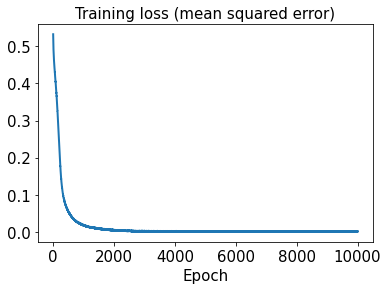

In [29]:
hist1 = history1.history
plt.plot(hist1['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

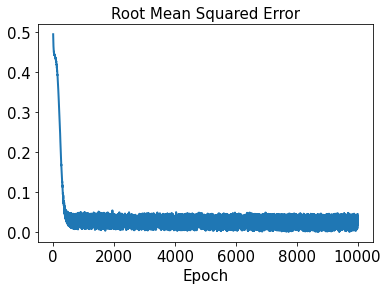

In [30]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [31]:
test_results1 = sd1.evaluate(x_test1)

1/1 [==============================] - 0s 90ms/step - loss: 3.7330e-06 - rmse: 0.0000e+00


In [32]:
decoded_sensor_train1 = sensor_pred1.predict(t_train)

In [33]:
decoded_sensor_test1 = sensor_pred1.predict(t_test)

In [34]:
decoded_train1 = sd1.predict(decoded_sensor_train1)

In [35]:
decoded_test1 = sd1.predict(decoded_sensor_test1)

In [36]:
error_train_abs1 = np.abs(decoded_train1 - y_train1)

In [37]:
error_test_abs1 = np.abs(decoded_test1 - y_test1)

In [38]:
l2_error_train1 = np.sqrt(np.sum((decoded_train1 - y_train1)**2) / np.sum(y_train1**2))
print(l2_error_train1)

0.19482511323907567


In [39]:
l2_error_test1 = np.sqrt(np.sum((decoded_test1 - y_test1)**2) / np.sum(y_test1**2))
print(l2_error_test1)

0.20222426493843207


In [40]:
l2_error_train_list1 = []
for i in range(0, len(x_train1)):
    l2_error_train_data1 = np.sqrt(np.sum((decoded_train1[i] - y_train1[i])**2) / np.sum(y_train1[i]**2))
    l2_error_train_list1.append(l2_error_train_data1)
print(l2_error_train_list1)

[0.03116404074277455, 0.2618545928464791, 0.03498649861071933, 0.2608733210369465, 0.030571757845836954, 0.3023299753358854, 0.20541228068583237, 0.02220552234889236, 0.09531969980579219, 0.1032099727892365, 0.08106289091437821, 0.15690332941875307, 0.018106921130060828, 0.24171710607017843, 0.31357044039264853, 0.17192812136106309, 0.02988053427369232, 0.0458393159052592, 0.1886434367926918, 0.007473959640063008, 0.08911858573915861, 0.2079185821291603, 0.09969269028927763, 0.11638772810526427, 0.051361022312280805, 0.32092386240932463, 0.0719876973877656, 0.00744628968797415, 0.03406242818394906, 0.2756981363925692, 0.23504627908326298, 0.02379091192045343, 0.07291793653941568]


In [41]:
l2_error_test_list1 = []
for i in range(0, len(x_test1)):
    l2_error_test_data1 = np.sqrt(np.sum((decoded_test1[i] - y_test1[i])**2) / np.sum(y_test1[i]**2))
    l2_error_test_list1.append(l2_error_test_data1)
print(l2_error_test_list1)

[0.12306923141816636, 0.2513659426462639, 0.28275412659836424, 0.020749964910686355, 0.22495843173690924, 0.03459420801710333, 0.021526368809522158, 0.05358159121373051]


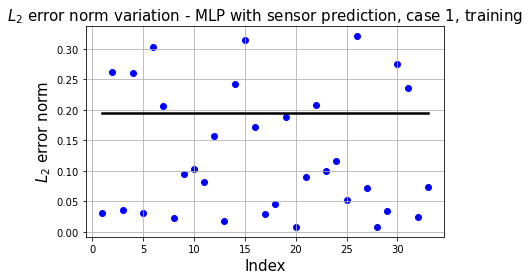

In [42]:
plt.plot(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train1*np.ones(x_train1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train1.shape[0], x_train1.shape[0]), l2_error_train_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

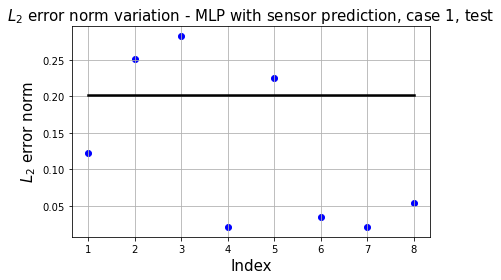

In [43]:
plt.plot(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test1*np.ones(x_test1.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test1.shape[0], x_test1.shape[0]), l2_error_test_list1, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 1, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

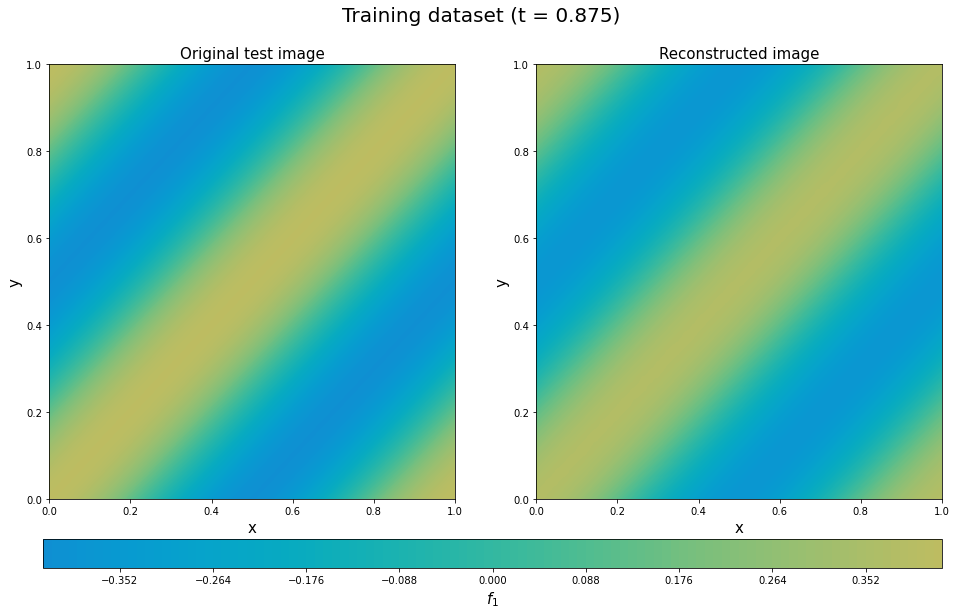

In [44]:
plt.figure(figsize=(16, 8))
y_train1_9_rotate = y_train1[9].T.reshape(101,101)
decoded_rotate1 = decoded_train1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_9_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[35]),fontsize=20)
plt.show()

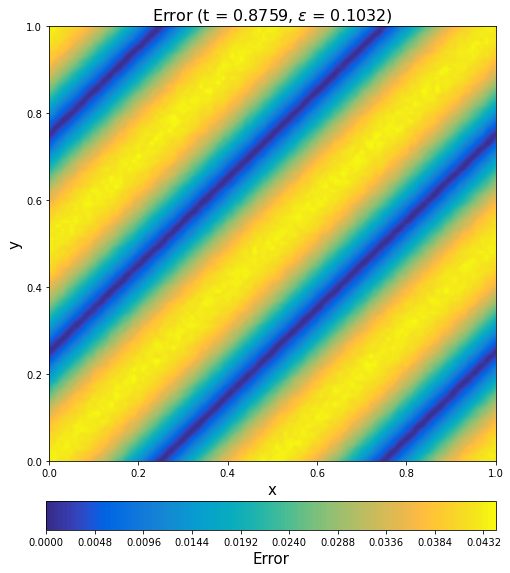

In [45]:
error_train_abs1_rotate9 = error_train_abs1[9].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate9, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.8759, $\epsilon$ = %.4f)' %(l2_error_train_list1[9]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

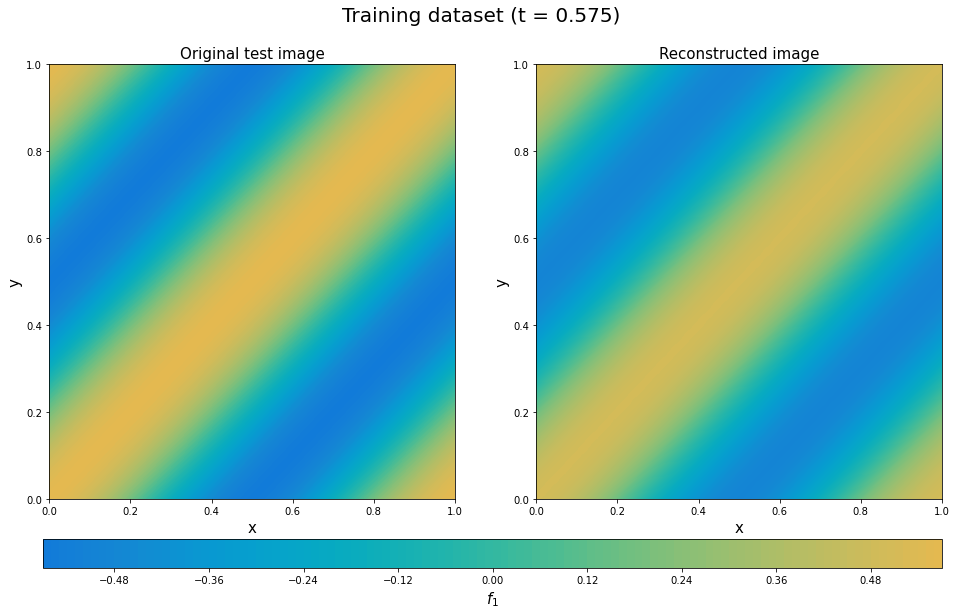

In [46]:
plt.figure(figsize=(16, 8))
y_train1_23_rotate = y_train1[23].T.reshape(101,101)
decoded_rotate1 = decoded_train1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train1_23_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[23]), fontsize=20)
plt.show()

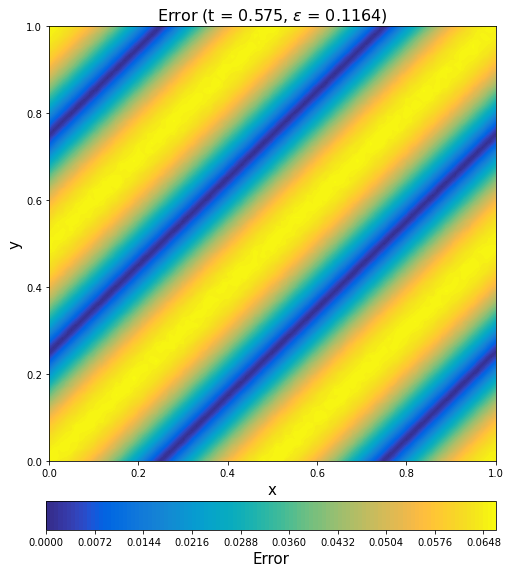

In [47]:
error_train_abs1_rotate23 = error_train_abs1[23].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs1_rotate23, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.575, $\epsilon$ = %.4f)' %(l2_error_train_list1[23]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

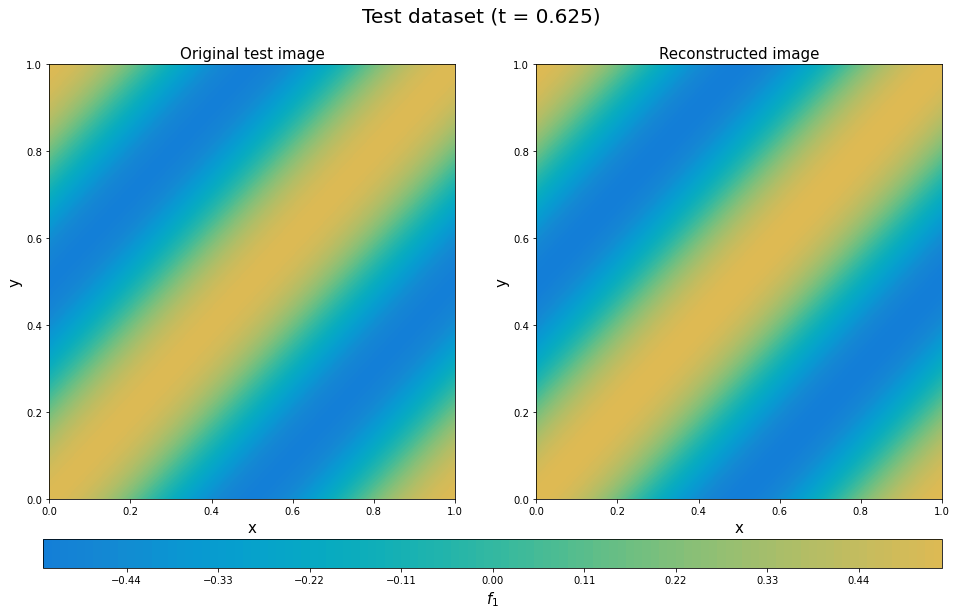

In [48]:
plt.figure(figsize=(16, 8))
y_test1_3_rotate = y_test1[3].T.reshape(101,101)
decoded_rotate1 = decoded_test1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_3_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[25]),fontsize=20)
plt.show()

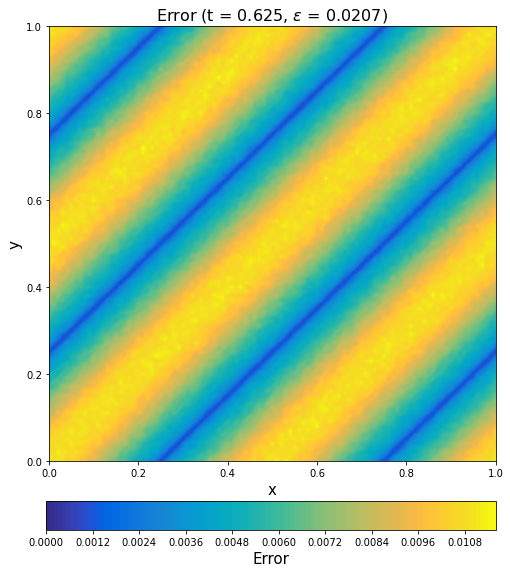

In [49]:
error_test_abs1_rotate3 = error_test_abs1[3].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate3, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.625, $\epsilon$ = %.4f)' %(l2_error_test_list1[3]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

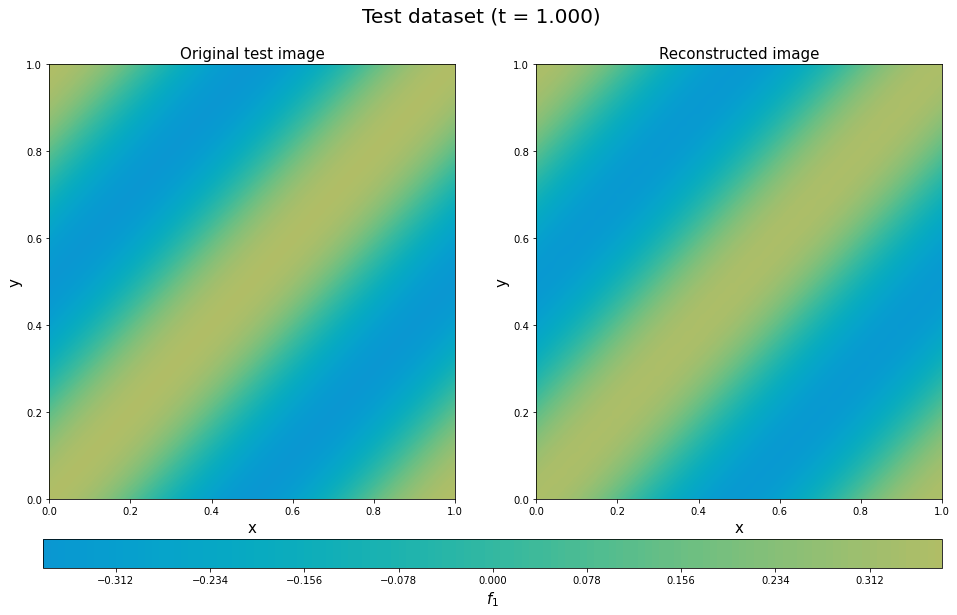

In [50]:
plt.figure(figsize=(16, 8))
y_test1_5_rotate = y_test1[5].T.reshape(101,101)
decoded_rotate1 = decoded_test1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test1_5_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate1, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-1.0,1.0)
a2.set_clim(-1.0,1.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_1$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)'  %(t[40]),fontsize=20)
plt.show()

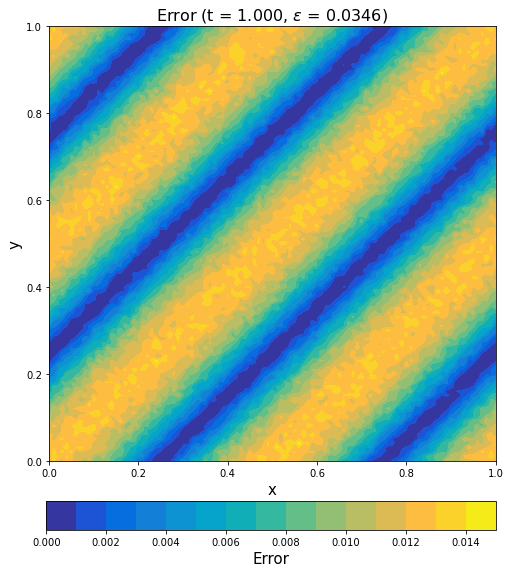

In [51]:
error_test_abs1_rotate5 = error_test_abs1[5].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs1_rotate5, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 1.000, $\epsilon$ = %.4f)' %(l2_error_test_list1[5]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 2: f2

In [52]:
out2 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out2[i, j, k] = x[j] + y[k] + t[i]

In [53]:
sensor2 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor2[i, j, k] = out2[i, 20*(j+1)+1, 20*(k+1)+1]

In [54]:
sensor2 = sensor2.reshape((41, 16, 1))

In [55]:
sensor2.shape

(41, 16, 1)

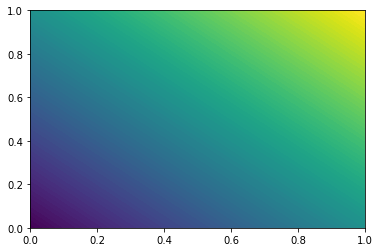

In [56]:
plt.contourf(xmesh, ymesh, out2[0,:,:], levels=128)

In [57]:
x_train2, x_test2, y_train2, y_test2, t_train, t_test = train_test_split(sensor2, out2, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [58]:
x_train2

array([[[1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945],
        [1.545],
        [1.745],
        [1.945],
        [2.145],
        [1.745],
        [1.945],
        [2.145],
        [2.345]],

       [[0.57 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [0.77 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [0.97 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.17 ],
        [1.37 ],
        [1.57 ],
        [1.77 ]],

       [[1.07 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.27 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [1.47 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [1.67 ],
        [1.87 ],
        [2.07 ],
        [2.27 ]],

       [[0.72 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [0.92 ],
        [1.12 ],
        [1.32 ],
        [1.52 ],
        [1.12 ],
        [1.32 ],
        

In [59]:
x_test2

array([[[1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [1.42 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [1.62 ],
        [1.82 ],
        [2.02 ],
        [2.22 ]],

       [[0.745],
        [0.945],
        [1.145],
        [1.345],
        [0.945],
        [1.145],
        [1.345],
        [1.545],
        [1.145],
        [1.345],
        [1.545],
        [1.745],
        [1.345],
        [1.545],
        [1.745],
        [1.945]],

       [[0.62 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [0.82 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.02 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.22 ],
        [1.42 ],
        [1.62 ],
        [1.82 ]],

       [[1.045],
        [1.245],
        [1.445],
        [1.645],
        [1.245],
        [1.445],
        [1.645],
        [1.845],
        [1.445],
        [1.645],
        

In [60]:
sensor_pred2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [61]:
start2 = datetime.datetime.now()
history2 = sensor_pred2.fit(t_train, x_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 21ms/step - loss: 2.5855 - rmse: 1.6079
Epoch 2/10000
2/2 [==============================] - 0s 18ms/step - loss: 2.5243 - rmse: 1.5887
Epoch 3/10000
2/2 [==============================] - 0s 36ms/step - loss: 2.4919 - rmse: 1.5785
Epoch 4/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4720 - rmse: 1.5721
Epoch 5/10000
2/2 [==============================] - 0s 28ms/step - loss: 2.4565 - rmse: 1.5672
Epoch 6/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.4501 - rmse: 1.5652
Epoch 7/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.4432 - rmse: 1.5630
Epoch 8/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4333 - rmse: 1.5598
Epoch 9/10000
2/2 [==============================] - 0s 19ms/step - loss: 2.4237 - rmse: 1.5567
Epoch 10/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.4148 - rmse: 1.5539
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 13ms/step - loss: 1.8690 - rmse: 1.3670
Epoch 86/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8650 - rmse: 1.3655
Epoch 87/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8576 - rmse: 1.3628
Epoch 88/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8493 - rmse: 1.3598
Epoch 89/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.8416 - rmse: 1.3569
Epoch 90/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8412 - rmse: 1.3568
Epoch 91/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8304 - rmse: 1.3528
Epoch 92/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8218 - rmse: 1.3496
Epoch 93/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8141 - rmse: 1.3468
Epoch 94/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8138 - rmse: 1.3466
Epoch 95/10000
2/2 [=========================

2/2 [==============================] - 0s 16ms/step - loss: 1.3467 - rmse: 1.1604
Epoch 169/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3428 - rmse: 1.1587
Epoch 170/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3339 - rmse: 1.1548
Epoch 171/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3278 - rmse: 1.1522
Epoch 172/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3286 - rmse: 1.1525
Epoch 173/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3159 - rmse: 1.1470
Epoch 174/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.3121 - rmse: 1.1453
Epoch 175/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3054 - rmse: 1.1424
Epoch 176/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.3030 - rmse: 1.1414
Epoch 177/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2983 - rmse: 1.1393
Epoch 178/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.8876 - rmse: 0.9420
Epoch 252/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8848 - rmse: 0.9405
Epoch 253/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.8818 - rmse: 0.9389
Epoch 254/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8727 - rmse: 0.9340
Epoch 255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8732 - rmse: 0.9343
Epoch 256/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8673 - rmse: 0.9311
Epoch 257/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.8613 - rmse: 0.9279
Epoch 258/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.8515 - rmse: 0.9226
Epoch 259/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.8488 - rmse: 0.9211
Epoch 260/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8461 - rmse: 0.9197
Epoch 261/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.5209 - rmse: 0.7215
Epoch 335/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5174 - rmse: 0.7191
Epoch 336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5137 - rmse: 0.7165
Epoch 337/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.5158 - rmse: 0.7180
Epoch 338/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5086 - rmse: 0.7129
Epoch 339/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5033 - rmse: 0.7092
Epoch 340/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5020 - rmse: 0.7083
Epoch 341/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4964 - rmse: 0.7043
Epoch 342/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4968 - rmse: 0.7046
Epoch 343/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.4953 - rmse: 0.7035
Epoch 344/10000
2/2 [===============

2/2 [==============================] - 0s 16ms/step - loss: 0.2803 - rmse: 0.5291
Epoch 418/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2785 - rmse: 0.5274
Epoch 419/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2744 - rmse: 0.5236
Epoch 420/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2709 - rmse: 0.5202
Epoch 421/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2745 - rmse: 0.5236
Epoch 422/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2680 - rmse: 0.5175
Epoch 423/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2718 - rmse: 0.5211
Epoch 424/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2643 - rmse: 0.5138
Epoch 425/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2622 - rmse: 0.5117
Epoch 426/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2616 - rmse: 0.5112
Epoch 427/10000
2/2 [===============

2/2 [==============================] - 0s 18ms/step - loss: 0.1408 - rmse: 0.3749
Epoch 501/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1399 - rmse: 0.3737
Epoch 502/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1416 - rmse: 0.3759
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1393 - rmse: 0.3729
Epoch 504/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.1354 - rmse: 0.3676
Epoch 505/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.1322 - rmse: 0.3632
Epoch 506/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1302 - rmse: 0.3605
Epoch 507/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1346 - rmse: 0.3664
Epoch 508/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1313 - rmse: 0.3619
Epoch 509/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.1278 - rmse: 0.3571
Epoch 510/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.0619 - rmse: 0.2482
Epoch 584/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0649 - rmse: 0.2543
Epoch 585/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0660 - rmse: 0.2563
Epoch 586/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0600 - rmse: 0.2444
Epoch 587/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0594 - rmse: 0.2432
Epoch 588/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0654 - rmse: 0.2552
Epoch 589/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0641 - rmse: 0.2527
Epoch 590/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0576 - rmse: 0.2395
Epoch 591/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0572 - rmse: 0.2386
Epoch 592/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0627 - rmse: 0.2498
Epoch 593/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.0280 - rmse: 0.1666
Epoch 667/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0250 - rmse: 0.1574
Epoch 668/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0239 - rmse: 0.1536
Epoch 669/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0231 - rmse: 0.1512
Epoch 670/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0240 - rmse: 0.1541
Epoch 671/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0226 - rmse: 0.1495
Epoch 672/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0238 - rmse: 0.1533
Epoch 673/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0255 - rmse: 0.1587
Epoch 674/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0223 - rmse: 0.1486
Epoch 675/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0220 - rmse: 0.1475
Epoch 676/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.0100 - rmse: 0.0985
Epoch 750/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0149 - rmse: 0.1209
Epoch 751/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0124 - rmse: 0.1103
Epoch 752/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0108 - rmse: 0.1025
Epoch 753/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0094 - rmse: 0.0955
Epoch 754/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0923
Epoch 755/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0083 - rmse: 0.0899
Epoch 756/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0095 - rmse: 0.0961
Epoch 757/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0082 - rmse: 0.0891
Epoch 758/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0924
Epoch 759/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0638
Epoch 833/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0752
Epoch 834/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0549
Epoch 835/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0079 - rmse: 0.0874
Epoch 836/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0053 - rmse: 0.0709
Epoch 837/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0754
Epoch 838/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0657
Epoch 839/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0571
Epoch 840/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0579
Epoch 841/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0812
Epoch 842/10000
2/2 [===============

2/2 [==============================] - 0s 18ms/step - loss: 0.0053 - rmse: 0.0714
Epoch 916/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0066 - rmse: 0.0796
Epoch 917/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0022 - rmse: 0.0446
Epoch 918/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0015 - rmse: 0.0359
Epoch 919/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0318
Epoch 920/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0014 - rmse: 0.0339
Epoch 921/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0088 - rmse: 0.0922
Epoch 922/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0036 - rmse: 0.0576
Epoch 923/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0023 - rmse: 0.0455
Epoch 924/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0063 - rmse: 0.0779
Epoch 925/10000
2/2 [===============

2/2 [==============================] - 0s 17ms/step - loss: 0.0012 - rmse: 0.0313
Epoch 999/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0014 - rmse: 0.0341
Epoch 1000/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0060 - rmse: 0.0758
Epoch 1001/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0019 - rmse: 0.0406
Epoch 1002/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0026 - rmse: 0.0484
Epoch 1003/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0026 - rmse: 0.0484
Epoch 1004/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0020 - rmse: 0.0421
Epoch 1005/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0037 - rmse: 0.0590
Epoch 1006/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0066 - rmse: 0.0796
Epoch 1007/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0030 - rmse: 0.0527
Epoch 1008/10000
2/2 [======

2/2 [==============================] - 0s 18ms/step - loss: 0.0025 - rmse: 0.0477
Epoch 1081/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0467
Epoch 1082/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0067 - rmse: 0.0802
Epoch 1083/10000
2/2 [==============================] - 0s 18ms/step - loss: 9.2783e-04 - rmse: 0.0262
Epoch 1084/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0016 - rmse: 0.0363
Epoch 1085/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0041 - rmse: 0.0623
Epoch 1086/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0312
Epoch 1087/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0024 - rmse: 0.0462
Epoch 1088/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0025 - rmse: 0.0478
Epoch 1089/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0082 - rmse: 0.0895
Epoch 1090/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0497
Epoch 1163/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0027 - rmse: 0.0493
Epoch 1164/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.2463e-04 - rmse: 0.0197
Epoch 1165/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0019 - rmse: 0.0404
Epoch 1166/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0062 - rmse: 0.0775
Epoch 1167/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0021 - rmse: 0.0427
Epoch 1168/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0082 - rmse: 0.0890
Epoch 1169/10000
2/2 [==============================] - 0s 16ms/step - loss: 5.5173e-04 - rmse: 0.0177
Epoch 1170/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0019 - rmse: 0.0402
Epoch 1171/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0043 - rmse: 0.0637
Epoch 1172/10000
2/

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0497
Epoch 1245/10000
2/2 [==============================] - 0s 18ms/step - loss: 5.1846e-04 - rmse: 0.0169
Epoch 1246/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0030 - rmse: 0.0530
Epoch 1247/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0081 - rmse: 0.0884
Epoch 1248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0429
Epoch 1249/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0473
Epoch 1250/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0080 - rmse: 0.0879
Epoch 1251/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0026 - rmse: 0.0492
Epoch 1252/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0025 - rmse: 0.0481
Epoch 1253/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0021 - rmse: 0.0437
Epoch 1254/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 0.0045 - rmse: 0.0655
Epoch 1327/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0012 - rmse: 0.0314
Epoch 1328/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0721
Epoch 1329/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0451
Epoch 1330/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0015 - rmse: 0.0353
Epoch 1331/10000
2/2 [==============================] - 0s 16ms/step - loss: 7.8588e-04 - rmse: 0.0236
Epoch 1332/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0018 - rmse: 0.0400
Epoch 1333/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0065 - rmse: 0.0789
Epoch 1334/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0072 - rmse: 0.0835
Epoch 1335/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0285
Epoch 1336/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0479
Epoch 1409/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0039 - rmse: 0.0604
Epoch 1410/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0827
Epoch 1411/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0046 - rmse: 0.0663
Epoch 1412/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.8139e-04 - rmse: 0.0189
Epoch 1413/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0060 - rmse: 0.0760
Epoch 1414/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0057 - rmse: 0.0741
Epoch 1415/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0027 - rmse: 0.0496
Epoch 1416/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0710
Epoch 1417/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0790
Epoch 1418/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 6.0118e-04 - rmse: 0.0196
Epoch 1491/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0795
Epoch 1492/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0622
Epoch 1493/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0666
Epoch 1494/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0744
Epoch 1495/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0399
Epoch 1496/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0755
Epoch 1497/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0873
Epoch 1498/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0881
Epoch 1499/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0654
Epoch 1500/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0441
Epoch 1573/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0293
Epoch 1574/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0018 - rmse: 0.0396
Epoch 1575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0488
Epoch 1576/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0608
Epoch 1577/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0358
Epoch 1578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0062 - rmse: 0.0773
Epoch 1579/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0381
Epoch 1580/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0783
Epoch 1581/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5659e-04 - rmse: 0.0156
Epoch 1582/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0815
Epoch 1655/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0012 - rmse: 0.0307
Epoch 1656/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0041 - rmse: 0.0620
Epoch 1657/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0044 - rmse: 0.0651
Epoch 1658/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0508
Epoch 1659/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0044 - rmse: 0.0644
Epoch 1660/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0475
Epoch 1661/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0029 - rmse: 0.0519
Epoch 1662/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8248e-04 - rmse: 0.0278
Epoch 1663/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0524
Epoch 1664/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 9.2780e-04 - rmse: 0.0269
Epoch 1737/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0063 - rmse: 0.0783
Epoch 1738/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0040 - rmse: 0.0613
Epoch 1739/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0037 - rmse: 0.0593
Epoch 1740/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0556
Epoch 1741/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0678
Epoch 1742/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0677
Epoch 1743/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0496
Epoch 1744/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0022 - rmse: 0.0450
Epoch 1745/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0012 - rmse: 0.0311
Epoch 1746/10000
2/2 [=

2/2 [==============================] - 0s 17ms/step - loss: 0.0015 - rmse: 0.0361
Epoch 1819/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0063 - rmse: 0.0783
Epoch 1820/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0565
Epoch 1821/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0014 - rmse: 0.0345
Epoch 1822/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0575
Epoch 1823/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0340
Epoch 1824/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0029 - rmse: 0.0520
Epoch 1825/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0070 - rmse: 0.0823
Epoch 1826/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0010 - rmse: 0.0288
Epoch 1827/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0022 - rmse: 0.0444
Epoch 1828/10000
2/2 [=====

2/2 [==============================] - 0s 16ms/step - loss: 0.0035 - rmse: 0.0574
Epoch 1901/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0019 - rmse: 0.0412
Epoch 1902/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0046 - rmse: 0.0664
Epoch 1903/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0046 - rmse: 0.0660
Epoch 1904/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0340
Epoch 1905/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0042 - rmse: 0.0633
Epoch 1906/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0050 - rmse: 0.0696
Epoch 1907/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0470
Epoch 1908/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0080 - rmse: 0.0881
Epoch 1909/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.0760e-04 - rmse: 0.0203
Epoch 1910/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0480
Epoch 1983/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0024 - rmse: 0.0468
Epoch 1984/10000
2/2 [==============================] - 0s 18ms/step - loss: 8.8487e-04 - rmse: 0.0263
Epoch 1985/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0030 - rmse: 0.0531
Epoch 1986/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0015 - rmse: 0.0365
Epoch 1987/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0471
Epoch 1988/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0050 - rmse: 0.0695
Epoch 1989/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 1990/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0687
Epoch 1991/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.4751e-04 - rmse: 0.0236
Epoch 1992/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 5.1671e-04 - rmse: 0.0182
Epoch 2064/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0840
Epoch 2065/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8502e-04 - rmse: 0.0141
Epoch 2066/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0349
Epoch 2067/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0564
Epoch 2068/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0033 - rmse: 0.0560
Epoch 2069/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 2070/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0079 - rmse: 0.0876
Epoch 2071/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0776
Epoch 2072/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0486
Epoch 2073/10000
2/

2/2 [==============================] - 0s 17ms/step - loss: 0.0016 - rmse: 0.0371
Epoch 2146/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 2147/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0018 - rmse: 0.0405
Epoch 2148/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0011 - rmse: 0.0304
Epoch 2149/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0050 - rmse: 0.0696
Epoch 2150/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0054 - rmse: 0.0721
Epoch 2151/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0484
Epoch 2152/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0805
Epoch 2153/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0384
Epoch 2154/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0432
Epoch 2155/10000
2/2 [=====

2/2 [==============================] - 0s 18ms/step - loss: 7.8981e-04 - rmse: 0.0247
Epoch 2228/10000
2/2 [==============================] - 0s 17ms/step - loss: 7.2440e-04 - rmse: 0.0233
Epoch 2229/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0377
Epoch 2230/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0331
Epoch 2231/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0508
Epoch 2232/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0358
Epoch 2233/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0382
Epoch 2234/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0019 - rmse: 0.0411
Epoch 2235/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0016 - rmse: 0.0376
Epoch 2236/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0015 - rmse: 0.0363
Epoch 2237/10000
2/

2/2 [==============================] - 0s 17ms/step - loss: 0.0030 - rmse: 0.0533
Epoch 2309/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0573
Epoch 2310/10000
2/2 [==============================] - 0s 17ms/step - loss: 7.7664e-04 - rmse: 0.0245
Epoch 2311/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0060 - rmse: 0.0765
Epoch 2312/10000
2/2 [==============================] - 0s 17ms/step - loss: 6.6392e-04 - rmse: 0.0221
Epoch 2313/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0440
Epoch 2314/10000
2/2 [==============================] - 0s 17ms/step - loss: 7.0417e-04 - rmse: 0.0230
Epoch 2315/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0333
Epoch 2316/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0505
Epoch 2317/10000
2/2 [==============================] - 0s 17ms/step - loss: 7.1906e-04 - rmse: 0.0233
Epoch 2318/

2/2 [==============================] - 0s 17ms/step - loss: 0.0064 - rmse: 0.0786
Epoch 2391/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0059 - rmse: 0.0757
Epoch 2392/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0072 - rmse: 0.0841
Epoch 2393/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0042 - rmse: 0.0633
Epoch 2394/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0037 - rmse: 0.0596
Epoch 2395/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0036 - rmse: 0.0586
Epoch 2396/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.6887e-04 - rmse: 0.0282
Epoch 2397/10000
2/2 [==============================] - 0s 17ms/step - loss: 5.0093e-04 - rmse: 0.0181
Epoch 2398/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0405
Epoch 2399/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0472
Epoch 2400/10000
2/

2/2 [==============================] - 0s 18ms/step - loss: 5.7665e-04 - rmse: 0.0202
Epoch 2473/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0021 - rmse: 0.0445
Epoch 2474/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0044 - rmse: 0.0647
Epoch 2475/10000
2/2 [==============================] - 0s 17ms/step - loss: 4.6078e-04 - rmse: 0.0171
Epoch 2476/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0065 - rmse: 0.0795
Epoch 2477/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0446
Epoch 2478/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0011 - rmse: 0.0308
Epoch 2479/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0072 - rmse: 0.0836
Epoch 2480/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0405
Epoch 2481/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0034 - rmse: 0.0571
Epoch 2482/10000
2/

2/2 [==============================] - 0s 16ms/step - loss: 0.0022 - rmse: 0.0448
Epoch 2555/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0062 - rmse: 0.0778
Epoch 2556/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0023 - rmse: 0.0467
Epoch 2557/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0032 - rmse: 0.0553
Epoch 2558/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0063 - rmse: 0.0786
Epoch 2559/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0015 - rmse: 0.0367
Epoch 2560/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0037 - rmse: 0.0595
Epoch 2561/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0566
Epoch 2562/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0057 - rmse: 0.0743
Epoch 2563/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0026 - rmse: 0.0496
Epoch 2564/10000
2/2 [=====

2/2 [==============================] - 0s 17ms/step - loss: 0.0020 - rmse: 0.0429
Epoch 2637/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0069 - rmse: 0.0820
Epoch 2638/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0017 - rmse: 0.0392
Epoch 2639/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0030 - rmse: 0.0537
Epoch 2640/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0013 - rmse: 0.0336
Epoch 2641/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0059 - rmse: 0.0755
Epoch 2642/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0053 - rmse: 0.0718
Epoch 2643/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0034 - rmse: 0.0570
Epoch 2644/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0018 - rmse: 0.0404
Epoch 2645/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0045 - rmse: 0.0659
Epoch 2646/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0806
Epoch 2719/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 2720/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0029 - rmse: 0.0519
Epoch 2721/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0013 - rmse: 0.0330
Epoch 2722/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0029 - rmse: 0.0525
Epoch 2723/10000
2/2 [==============================] - 0s 16ms/step - loss: 5.4048e-04 - rmse: 0.0195
Epoch 2724/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0780
Epoch 2725/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0500
Epoch 2726/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0404
Epoch 2727/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0485
Epoch 2728/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0079 - rmse: 0.0881
Epoch 2801/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0035 - rmse: 0.0574
Epoch 2802/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0574
Epoch 2803/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0025 - rmse: 0.0480
Epoch 2804/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 2805/10000
2/2 [==============================] - 0s 17ms/step - loss: 6.4320e-04 - rmse: 0.0220
Epoch 2806/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0013 - rmse: 0.0333
Epoch 2807/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0653
Epoch 2808/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.0248e-04 - rmse: 0.0234
Epoch 2809/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0364
Epoch 2810/10000
2/

2/2 [==============================] - 0s 16ms/step - loss: 0.0044 - rmse: 0.0651
Epoch 2883/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0023 - rmse: 0.0458
Epoch 2884/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0512
Epoch 2885/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0028 - rmse: 0.0512
Epoch 2886/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.9892e-04 - rmse: 0.0291
Epoch 2887/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0320
Epoch 2888/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0328
Epoch 2889/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0306
Epoch 2890/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0715
Epoch 2891/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0810
Epoch 2892/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0684
Epoch 2965/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0810
Epoch 2966/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0572
Epoch 2967/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0096 - rmse: 0.0972
Epoch 2968/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0622
Epoch 2969/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 2970/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0058 - rmse: 0.0753
Epoch 2971/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0088 - rmse: 0.0931
Epoch 2972/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0077 - rmse: 0.0869
Epoch 2973/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 2974/10000
2/2 [=====

2/2 [==============================] - 0s 17ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 3047/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 3048/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.0468e-04 - rmse: 0.0256
Epoch 3049/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.5971e-04 - rmse: 0.0176
Epoch 3050/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0032 - rmse: 0.0551
Epoch 3051/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0609
Epoch 3052/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0023 - rmse: 0.0460
Epoch 3053/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0024 - rmse: 0.0474
Epoch 3054/10000
2/2 [==============================] - 0s 17ms/step - loss: 2.9742e-04 - rmse: 0.0121
Epoch 3055/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0010 - rmse: 0.0293
Epoch 3056/1000

2/2 [==============================] - 0s 15ms/step - loss: 7.9497e-04 - rmse: 0.0255
Epoch 3129/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 3130/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0073 - rmse: 0.0847
Epoch 3131/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 3132/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0442
Epoch 3133/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0767
Epoch 3134/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0483
Epoch 3135/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0451
Epoch 3136/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0837
Epoch 3137/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0304
Epoch 3138/10000
2/2 [=

2/2 [==============================] - 0s 17ms/step - loss: 5.6271e-04 - rmse: 0.0205
Epoch 3211/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0021 - rmse: 0.0440
Epoch 3212/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0621
Epoch 3213/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0616
Epoch 3214/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0064 - rmse: 0.0792
Epoch 3215/10000
2/2 [==============================] - 0s 16ms/step - loss: 4.6108e-04 - rmse: 0.0178
Epoch 3216/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 3217/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 3218/10000
2/2 [==============================] - 0s 18ms/step - loss: 5.8418e-04 - rmse: 0.0210
Epoch 3219/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0013 - rmse: 0.0337
Epoch 3220/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 3293/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0070 - rmse: 0.0829
Epoch 3294/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0033 - rmse: 0.0559
Epoch 3295/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0017 - rmse: 0.0394
Epoch 3296/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0044 - rmse: 0.0652
Epoch 3297/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0025 - rmse: 0.0483
Epoch 3298/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0484
Epoch 3299/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0657
Epoch 3300/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.5983e-04 - rmse: 0.0148
Epoch 3301/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0731
Epoch 3302/10000
2/2 [=

2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 3375/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0810
Epoch 3376/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0583
Epoch 3377/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 3378/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0891
Epoch 3379/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0703
Epoch 3380/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0877
Epoch 3381/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0657
Epoch 3382/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.0285e-04 - rmse: 0.0128
Epoch 3383/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8018e-04 - rmse: 0.0155
Epoch 3384/10000
2/

2/2 [==============================] - 0s 18ms/step - loss: 0.0058 - rmse: 0.0751
Epoch 3457/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0031 - rmse: 0.0548
Epoch 3458/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0732
Epoch 3459/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0876
Epoch 3460/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0020 - rmse: 0.0437
Epoch 3461/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0063 - rmse: 0.0784
Epoch 3462/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0045 - rmse: 0.0662
Epoch 3463/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0023 - rmse: 0.0467
Epoch 3464/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0784
Epoch 3465/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0804
Epoch 3466/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 3539/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0037 - rmse: 0.0597
Epoch 3540/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0055 - rmse: 0.0732
Epoch 3541/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0520
Epoch 3542/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0021 - rmse: 0.0445
Epoch 3543/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 3544/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0679
Epoch 3545/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.9534e-04 - rmse: 0.0276
Epoch 3546/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0072 - rmse: 0.0838
Epoch 3547/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0603
Epoch 3548/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0077 - rmse: 0.0872
Epoch 3621/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0550
Epoch 3622/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7159e-04 - rmse: 0.0289
Epoch 3623/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0417
Epoch 3624/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0868
Epoch 3625/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0834
Epoch 3626/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0011 - rmse: 0.0307
Epoch 3627/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3400e-04 - rmse: 0.0173
Epoch 3628/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0844
Epoch 3629/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.1994e-04 - rmse: 0.0196
Epoch 3630/10000

Epoch 3702/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0506
Epoch 3703/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0804
Epoch 3704/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0447
Epoch 3705/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 3706/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0074 - rmse: 0.0852
Epoch 3707/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0431
Epoch 3708/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.5918e-04 - rmse: 0.0181
Epoch 3709/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.4797e-04 - rmse: 0.0147
Epoch 3710/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.8494e-04 - rmse: 0.0159
Epoch 3711/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0357

2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0595
Epoch 3785/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1283e-04 - rmse: 0.0168
Epoch 3786/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.6487e-04 - rmse: 0.0116
Epoch 3787/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4782e-04 - rmse: 0.0108
Epoch 3788/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0594
Epoch 3789/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2682e-04 - rmse: 0.0172
Epoch 3790/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0442
Epoch 3791/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.3082e-04 - rmse: 0.0173
Epoch 3792/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5882e-04 - rmse: 0.0113
Epoch 3793/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0500
Epoch 3

Epoch 3866/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0312
Epoch 3867/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0476
Epoch 3868/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 3869/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0031 - rmse: 0.0541
Epoch 3870/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0588
Epoch 3871/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0485
Epoch 3872/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0497
Epoch 3873/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0844
Epoch 3874/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0086 - rmse: 0.0922
Epoch 3875/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 3876

2/2 [==============================] - 0s 13ms/step - loss: 0.0063 - rmse: 0.0785
Epoch 3949/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0028 - rmse: 0.0515
Epoch 3950/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 3951/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0071 - rmse: 0.0834
Epoch 3952/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3952e-04 - rmse: 0.0177
Epoch 3953/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.6624e-04 - rmse: 0.0210
Epoch 3954/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0072 - rmse: 0.0841
Epoch 3955/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0480
Epoch 3956/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0654
Epoch 3957/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0055 - rmse: 0.0730
Epoch 3958/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 5.9227e-04 - rmse: 0.0216
Epoch 4031/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0051 - rmse: 0.0705
Epoch 4032/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0071 - rmse: 0.0833
Epoch 4033/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0580
Epoch 4034/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0511
Epoch 4035/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 4036/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0557
Epoch 4037/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0817
Epoch 4038/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2640e-04 - rmse: 0.0224
Epoch 4039/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 4040/10000
2/2 

2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0590
Epoch 4113/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0464
Epoch 4114/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.7546e-04 - rmse: 0.0188
Epoch 4115/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0050 - rmse: 0.0700
Epoch 4116/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0618
Epoch 4117/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0572
Epoch 4118/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0902
Epoch 4119/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0637
Epoch 4120/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0599
Epoch 4121/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0835
Epoch 4122/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0486
Epoch 4195/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0072 - rmse: 0.0839
Epoch 4196/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.2948e-04 - rmse: 0.0144
Epoch 4197/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0344
Epoch 4198/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0478
Epoch 4199/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0828
Epoch 4200/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0693
Epoch 4201/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0366
Epoch 4202/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0919e-04 - rmse: 0.0170
Epoch 4203/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0406
Epoch 4204/10000
2/

2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 4277/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4772e-04 - rmse: 0.0151
Epoch 4278/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1075e-04 - rmse: 0.0138
Epoch 4279/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0470
Epoch 4280/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0078 - rmse: 0.0874
Epoch 4281/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0644
Epoch 4282/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.5863e-04 - rmse: 0.0209
Epoch 4283/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 4284/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0485
Epoch 4285/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.5114e-04 - rmse: 0.0231
Epoch 4286/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0312
Epoch 4359/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0875
Epoch 4360/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0871
Epoch 4361/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1515e-04 - rmse: 0.0264
Epoch 4362/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.7750e-04 - rmse: 0.0214
Epoch 4363/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 4364/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8255e-04 - rmse: 0.0162
Epoch 4365/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0829
Epoch 4366/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 4367/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0454
Epoch 4368/1000

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0343
Epoch 4441/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0353
Epoch 4442/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 4443/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0824
Epoch 4444/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0480
Epoch 4445/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0466
Epoch 4446/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0046 - rmse: 0.0667
Epoch 4447/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0411
Epoch 4448/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.6854e-04 - rmse: 0.0235
Epoch 4449/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.8702e-04 - rmse: 0.0277
Epoch 4450/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0819
Epoch 4523/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0507
Epoch 4524/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0694
Epoch 4525/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0797
Epoch 4526/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0354
Epoch 4527/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0301
Epoch 4528/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0579
Epoch 4529/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0615
Epoch 4530/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0532
Epoch 4531/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 4532/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 4.7386e-04 - rmse: 0.0190
Epoch 4605/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.3872e-04 - rmse: 0.0250
Epoch 4606/10000
2/2 [==============================] - 0s 16ms/step - loss: 5.4194e-04 - rmse: 0.0207
Epoch 4607/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0422
Epoch 4608/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0050 - rmse: 0.0696
Epoch 4609/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0423
Epoch 4610/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0771
Epoch 4611/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0569
Epoch 4612/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5924e-04 - rmse: 0.0120
Epoch 4613/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0754
Epoch 4614/

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0353
Epoch 4686/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0467
Epoch 4687/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.7296e-04 - rmse: 0.0190
Epoch 4688/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 4689/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0740
Epoch 4690/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9096e-04 - rmse: 0.0219
Epoch 4691/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0629
Epoch 4692/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 4693/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0659
Epoch 4694/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0652
Epoch 4695/10000
2/2 [

2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 4768/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0583
Epoch 4769/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.5366e-04 - rmse: 0.0185
Epoch 4770/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0496e-04 - rmse: 0.0171
Epoch 4771/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 4772/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 4773/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0065 - rmse: 0.0797
Epoch 4774/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0575
Epoch 4775/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0566
Epoch 4776/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 4777/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0059 - rmse: 0.0758
Epoch 4850/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 4851/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0709
Epoch 4852/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3693e-04 - rmse: 0.0230
Epoch 4853/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0869
Epoch 4854/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0411
Epoch 4855/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0677
Epoch 4856/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.4332e-04 - rmse: 0.0271
Epoch 4857/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0707
Epoch 4858/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0524
Epoch 4859/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0689
Epoch 4931/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 4932/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0555
Epoch 4933/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 4934/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0441
Epoch 4935/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0347
Epoch 4936/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0319
Epoch 4937/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.6965e-04 - rmse: 0.0190
Epoch 4938/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0078 - rmse: 0.0878
Epoch 4939/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0458
Epoch 4940/10000
2/2 [=

2/2 [==============================] - 0s 16ms/step - loss: 3.2527e-04 - rmse: 0.0147
Epoch 5013/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0059 - rmse: 0.0760
Epoch 5014/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0817
Epoch 5015/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.9202e-04 - rmse: 0.0280
Epoch 5016/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.7353e-04 - rmse: 0.0294
Epoch 5017/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0501
Epoch 5018/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0522
Epoch 5019/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3423e-04 - rmse: 0.0250
Epoch 5020/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 5021/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0395
Epoch 5022/

2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 5094/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7121e-04 - rmse: 0.0191
Epoch 5095/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0820
Epoch 5096/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6870e-04 - rmse: 0.0127
Epoch 5097/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0607
Epoch 5098/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 5099/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0742
Epoch 5100/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.8507e-04 - rmse: 0.0279
Epoch 5101/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0746
Epoch 5102/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0640
Epoch 5103/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0361
Epoch 5176/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0787
Epoch 5177/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.1207e-04 - rmse: 0.0225
Epoch 5178/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9096e-04 - rmse: 0.0136
Epoch 5179/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.9217e-04 - rmse: 0.0093
Epoch 5180/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0045 - rmse: 0.0660
Epoch 5181/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 5182/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 5183/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0481
Epoch 5184/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.4950e-04 - rmse: 0.0120
Epoch 5185/

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0509
Epoch 5258/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7832e-04 - rmse: 0.0193
Epoch 5259/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 5260/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7592e-04 - rmse: 0.0084
Epoch 5261/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 5262/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.9527e-04 - rmse: 0.0171
Epoch 5263/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 5264/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7529e-04 - rmse: 0.0084
Epoch 5265/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7114e-04 - rmse: 0.0129
Epoch 5266/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0884
Epoch 5

2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 5340/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0055 - rmse: 0.0735
Epoch 5341/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0048 - rmse: 0.0682
Epoch 5342/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0830
Epoch 5343/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 5344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0069 - rmse: 0.0824
Epoch 5345/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.8664e-04 - rmse: 0.0195
Epoch 5346/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0363
Epoch 5347/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0487
Epoch 5348/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0750
Epoch 5349/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0746
Epoch 5422/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0685
Epoch 5423/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.7705e-04 - rmse: 0.0260
Epoch 5424/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.8532e-04 - rmse: 0.0195
Epoch 5425/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0744
Epoch 5426/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0739
Epoch 5427/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0496
Epoch 5428/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0324
Epoch 5429/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.4820e-04 - rmse: 0.0156
Epoch 5430/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7200e-04 - rmse: 0.0164
Epoch 5431/

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 5503/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0646
Epoch 5504/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0816
Epoch 5505/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0345
Epoch 5506/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 5507/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 5508/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 5509/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 5510/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0398
Epoch 5511/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 5512/10000
2/2 [=====

2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0772
Epoch 5585/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.2087e-04 - rmse: 0.0228
Epoch 5586/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7600e-04 - rmse: 0.0278
Epoch 5587/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 5588/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 5589/10000
2/2 [==============================] - 0s 10ms/step - loss: 7.0731e-04 - rmse: 0.0246
Epoch 5590/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0068 - rmse: 0.0820
Epoch 5591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0049 - rmse: 0.0690
Epoch 5592/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0304
Epoch 5593/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 5594/1000

Epoch 5666/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0642
Epoch 5667/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8738e-04 - rmse: 0.0298
Epoch 5668/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0055 - rmse: 0.0736
Epoch 5669/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0057 - rmse: 0.0746
Epoch 5670/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 5671/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.2430e-04 - rmse: 0.0250
Epoch 5672/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0044 - rmse: 0.0655
Epoch 5673/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0607
Epoch 5674/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0668
Epoch 5675/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0418
Ep

2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0343
Epoch 5749/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0091 - rmse: 0.0948
Epoch 5750/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0801
Epoch 5751/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 5752/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0066 - rmse: 0.0806
Epoch 5753/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 5754/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0906
Epoch 5755/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 5756/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0666
Epoch 5757/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0045 - rmse: 0.0661
Epoch 5758/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 5831/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0562
Epoch 5832/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0309
Epoch 5833/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0920
Epoch 5834/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0424
Epoch 5835/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0068 - rmse: 0.0820
Epoch 5836/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 5837/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0401
Epoch 5838/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.4561e-04 - rmse: 0.0212
Epoch 5839/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6423e-04 - rmse: 0.0163
Epoch 5840/10000
2/

Epoch 5912/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0388
Epoch 5913/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.6811e-04 - rmse: 0.0239
Epoch 5914/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 5915/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0332
Epoch 5916/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0739
Epoch 5917/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0426
Epoch 5918/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 5919/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0563
Epoch 5920/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.2423e-04 - rmse: 0.0151
Epoch 5921/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.7010e-04 - rmse: 0.027

2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0574
Epoch 5994/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0045 - rmse: 0.0660
Epoch 5995/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 5996/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0711
Epoch 5997/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 5998/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 5999/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 6000/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0639
Epoch 6001/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0432
Epoch 6002/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.8708e-04 - rmse: 0.0263
Epoch 6003/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 6076/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 6077/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.5866e-04 - rmse: 0.0294
Epoch 6078/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0475
Epoch 6079/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.4494e-04 - rmse: 0.0158
Epoch 6080/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 6081/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 6082/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.2146e-04 - rmse: 0.0151
Epoch 6083/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0647
Epoch 6084/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 6085/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0052 - rmse: 0.0712
Epoch 6158/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 6159/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 6160/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6161/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0083 - rmse: 0.0903
Epoch 6162/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0536
Epoch 6163/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 6164/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 6165/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 6166/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 6167/10000
2/2 [=====

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 6240/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 6241/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0327
Epoch 6242/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0520
Epoch 6243/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0303
Epoch 6244/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 6245/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 6246/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.1358e-04 - rmse: 0.0228
Epoch 6247/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0073 - rmse: 0.0847
Epoch 6248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0600
Epoch 6249/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0559
Epoch 6322/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0068 - rmse: 0.0818
Epoch 6323/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0412
Epoch 6324/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 6325/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0023 - rmse: 0.0468
Epoch 6326/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 6327/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.4921e-04 - rmse: 0.0275
Epoch 6328/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0706
Epoch 6329/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4803e-04 - rmse: 0.0293
Epoch 6330/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0511
Epoch 6331/10000
2/2 [

2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0775
Epoch 6404/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 6405/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.5788e-04 - rmse: 0.0192
Epoch 6406/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 6407/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0817
Epoch 6408/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.7428e-04 - rmse: 0.0297
Epoch 6409/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0518
Epoch 6410/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.9776e-04 - rmse: 0.0246
Epoch 6411/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 6412/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.7637e-04 - rmse: 0.0242
Epoch 6413/

Epoch 6485/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 6486/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 6487/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0592
Epoch 6488/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.5976e-04 - rmse: 0.0164
Epoch 6489/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0488
Epoch 6490/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.1181e-04 - rmse: 0.0180
Epoch 6491/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1092e-04 - rmse: 0.0205
Epoch 6492/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 6493/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.6046e-04 - rmse: 0.0278
Epoch 6494/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0

2/2 [==============================] - 0s 14ms/step - loss: 2.1888e-04 - rmse: 0.0114
Epoch 6568/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0386
Epoch 6569/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 6570/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.6746e-04 - rmse: 0.0195
Epoch 6571/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 6572/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0054 - rmse: 0.0726
Epoch 6573/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 6574/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.8882e-04 - rmse: 0.0283
Epoch 6575/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0563
Epoch 6576/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 6577/1000

2/2 [==============================] - 0s 14ms/step - loss: 8.5551e-04 - rmse: 0.0277
Epoch 6649/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 6650/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0468
Epoch 6651/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0308
Epoch 6652/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0455
Epoch 6653/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0399
Epoch 6654/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0064 - rmse: 0.0793
Epoch 6655/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4549e-04 - rmse: 0.0293
Epoch 6656/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6657/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1317e-04 - rmse: 0.0269
Epoch 6658/1000

Epoch 6730/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0477
Epoch 6731/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.8873e-04 - rmse: 0.0265
Epoch 6732/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0888
Epoch 6733/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6651e-04 - rmse: 0.0167
Epoch 6734/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0591
Epoch 6735/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0558
Epoch 6736/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0793
Epoch 6737/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0062 - rmse: 0.0779
Epoch 6738/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 6739/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0452
Ep

Epoch 6812/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0070 - rmse: 0.0829
Epoch 6813/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 6814/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.8337e-04 - rmse: 0.0099
Epoch 6815/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0053 - rmse: 0.0721
Epoch 6816/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1695e-04 - rmse: 0.0270
Epoch 6817/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0520
Epoch 6818/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 6819/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 6820/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 6821/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0566
Ep

2/2 [==============================] - 0s 14ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 6895/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6233e-04 - rmse: 0.0166
Epoch 6896/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.1955e-04 - rmse: 0.0208
Epoch 6897/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3760e-04 - rmse: 0.0188
Epoch 6898/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0599
Epoch 6899/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0581
Epoch 6900/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 6901/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 6902/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 6903/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0708
Epoch 6904/1000

2/2 [==============================] - 0s 12ms/step - loss: 3.4131e-04 - rmse: 0.0160
Epoch 6977/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 6978/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 6979/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.8148e-04 - rmse: 0.0244
Epoch 6980/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0835
Epoch 6981/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0063 - rmse: 0.0789
Epoch 6982/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0740
Epoch 6983/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0835
Epoch 6984/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0528
Epoch 6985/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6386e-04 - rmse: 0.0219
Epoch 6986/10000
2

2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 7059/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0734
Epoch 7060/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0819
Epoch 7061/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 7062/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0400
Epoch 7063/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0490
Epoch 7064/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 7065/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0085 - rmse: 0.0918
Epoch 7066/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0089 - rmse: 0.0937
Epoch 7067/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0581
Epoch 7068/10000
2/2 [========

2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0510
Epoch 7141/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7142/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0038 - rmse: 0.0608
Epoch 7143/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5625e-04 - rmse: 0.0132
Epoch 7144/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0555
Epoch 7145/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.9906e-04 - rmse: 0.0147
Epoch 7146/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0683
Epoch 7147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0385
Epoch 7148/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0640
Epoch 7149/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0329
Epoch 7150/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 7223/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0556
Epoch 7224/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 7225/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 7226/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 7227/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 7228/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0830
Epoch 7229/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.9036e-04 - rmse: 0.0284
Epoch 7230/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0830
Epoch 7231/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0509
Epoch 7232/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 7305/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0687
Epoch 7306/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.9890e-04 - rmse: 0.0148
Epoch 7307/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 7308/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0068 - rmse: 0.0820
Epoch 7309/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.1201e-04 - rmse: 0.0208
Epoch 7310/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 7311/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7312/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 7313/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 7314/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0310
Epoch 7387/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0358
Epoch 7388/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 7389/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 7390/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0598
Epoch 7391/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 7392/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 7393/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 7394/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0075 - rmse: 0.0859
Epoch 7395/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 7396/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0045 - rmse: 0.0664
Epoch 7469/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 7470/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0303e-04 - rmse: 0.0149
Epoch 7471/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7472/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 7473/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0436
Epoch 7474/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0054 - rmse: 0.0730
Epoch 7475/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 7476/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 7477/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 7478/10000
2/2 [====

2/2 [==============================] - 0s 15ms/step - loss: 3.6126e-04 - rmse: 0.0168
Epoch 7551/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 7552/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 7553/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0051 - rmse: 0.0710
Epoch 7554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0589
Epoch 7555/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 7556/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9593e-04 - rmse: 0.0227
Epoch 7557/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0884
Epoch 7558/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0023 - rmse: 0.0470
Epoch 7559/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 7560/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 3.9230e-04 - rmse: 0.0177
Epoch 7633/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.1257e-04 - rmse: 0.0153
Epoch 7634/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.7145e-04 - rmse: 0.0139
Epoch 7635/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7636/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0433
Epoch 7637/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.3422e-04 - rmse: 0.0188
Epoch 7638/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.4323e-04 - rmse: 0.0276
Epoch 7639/10000
2/2 [==============================] - ETA: 0s - loss: 8.3125e-04 - rmse: 0.02 - 0s 12ms/step - loss: 0.0059 - rmse: 0.0762
Epoch 7640/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7841e-04 - rmse: 0.0200
Epoch 7641/10000
2/2 [==============================] - 0s 12ms/

2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0306
Epoch 7715/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 7716/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0376
Epoch 7717/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5174e-04 - rmse: 0.0193
Epoch 7718/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7719/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7720/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0617
Epoch 7721/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 7722/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0565
Epoch 7723/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 7724/10000
2/2 [===

2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 7797/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7798/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 7799/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0424
Epoch 7800/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.6443e-04 - rmse: 0.0262
Epoch 7801/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 7802/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 7803/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0610
Epoch 7804/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.3823e-04 - rmse: 0.0162
Epoch 7805/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 7806/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 7879/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0468
Epoch 7880/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0508
Epoch 7881/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.7123e-04 - rmse: 0.0223
Epoch 7882/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0373
Epoch 7883/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3373e-04 - rmse: 0.0189
Epoch 7884/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7885/10000
2/2 [==============================] - 0s 16ms/step - loss: 1.4460e-04 - rmse: 0.0083
Epoch 7886/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.2676e-04 - rmse: 0.0187
Epoch 7887/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0063 - rmse: 0.0787
Epoch 7888/

2/2 [==============================] - 0s 14ms/step - loss: 6.1383e-04 - rmse: 0.0232
Epoch 7961/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7962/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0048 - rmse: 0.0684
Epoch 7963/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0793
Epoch 7964/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 7965/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 7966/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.6188e-04 - rmse: 0.0280
Epoch 7967/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0074 - rmse: 0.0853
Epoch 7968/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 7969/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0626
Epoch 7970/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0365
Epoch 8043/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0397
Epoch 8044/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4288e-04 - rmse: 0.0192
Epoch 8045/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0050 - rmse: 0.0699
Epoch 8046/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0776
Epoch 8047/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.6311e-04 - rmse: 0.0281
Epoch 8048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0556
Epoch 8049/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.8399e-04 - rmse: 0.0202
Epoch 8050/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 8051/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 8052/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 8124/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 8125/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 8126/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8127/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.2443e-04 - rmse: 0.0255
Epoch 8128/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0051 - rmse: 0.0709
Epoch 8129/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0677
Epoch 8130/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.4162e-04 - rmse: 0.0238
Epoch 8131/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0793
Epoch 8132/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8133/10000
2/

Epoch 8205/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0309
Epoch 8206/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8378e-04 - rmse: 0.0176
Epoch 8207/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 8208/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.9483e-04 - rmse: 0.0303
Epoch 8209/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0461
Epoch 8210/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0615
Epoch 8211/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.4523e-04 - rmse: 0.0239
Epoch 8212/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0346
Epoch 8213/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.2973e-04 - rmse: 0.0160
Epoch 8214/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0

2/2 [==============================] - 0s 15ms/step - loss: 4.6563e-04 - rmse: 0.0198
Epoch 8287/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.2181e-04 - rmse: 0.0187
Epoch 8288/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.2957e-04 - rmse: 0.0160
Epoch 8289/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.7623e-04 - rmse: 0.0245
Epoch 8290/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 8291/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 8292/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0373
Epoch 8293/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.1436e-04 - rmse: 0.0233
Epoch 8294/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.1026e-04 - rmse: 0.0271
Epoch 8295/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0425
Epo

2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0890
Epoch 8369/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0774
Epoch 8370/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0448
Epoch 8371/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0656
Epoch 8372/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8373/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0064 - rmse: 0.0793
Epoch 8374/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0607
Epoch 8375/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 8376/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0359
Epoch 8377/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 8378/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0434
Epoch 8451/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 8452/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 8453/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 8454/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8455/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 8456/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 8457/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 8458/10000
2/2 [==============================] - 0s 16ms/step - loss: 7.3268e-04 - rmse: 0.0257
Epoch 8459/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.1527e-04 - rmse: 0.0290
Epoch 8460/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8532/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0013 - rmse: 0.0347
Epoch 8533/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2810e-04 - rmse: 0.0076
Epoch 8534/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 8535/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0641
Epoch 8536/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 8537/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0435
Epoch 8538/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3630e-04 - rmse: 0.0081
Epoch 8539/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.7647e-04 - rmse: 0.0143
Epoch 8540/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 8541/1000

2/2 [==============================] - 0s 15ms/step - loss: 2.0666e-04 - rmse: 0.0117
Epoch 8613/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.7583e-04 - rmse: 0.0143
Epoch 8614/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.6334e-04 - rmse: 0.0096
Epoch 8615/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0934e-04 - rmse: 0.0184
Epoch 8616/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0471
Epoch 8617/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0742
Epoch 8618/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 8619/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 8620/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0469
Epoch 8621/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 8622/

2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 8694/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8695/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0609
Epoch 8696/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 8697/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 8698/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0049 - rmse: 0.0694
Epoch 8699/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.1301e-04 - rmse: 0.0156
Epoch 8700/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2699e-04 - rmse: 0.0126
Epoch 8701/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.3695e-04 - rmse: 0.0129
Epoch 8702/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0348
Epoch 8703/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 8776/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 8777/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.2394e-04 - rmse: 0.0188
Epoch 8778/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1344e-04 - rmse: 0.0233
Epoch 8779/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 8780/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 8781/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8782/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 8783/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 8784/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0372
Epoch 8785/10000
2/2 

Epoch 8857/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 8858/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0741
Epoch 8859/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6852e-04 - rmse: 0.0141
Epoch 8860/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.5746e-04 - rmse: 0.0094
Epoch 8861/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 8862/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 8863/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 8864/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.2263e-04 - rmse: 0.0213
Epoch 8865/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 8866/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.7227e-04 - rmse: 0.0

2/2 [==============================] - 0s 9ms/step - loss: 4.8605e-04 - rmse: 0.0204
Epoch 8939/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 8940/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0565
Epoch 8941/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8942/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0823
Epoch 8943/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 8944/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.8182e-04 - rmse: 0.0177
Epoch 8945/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0615
Epoch 8946/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 8947/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0031e-04 - rmse: 0.0182
Epoch 8948/10000


2/2 [==============================] - 0s 12ms/step - loss: 8.0601e-04 - rmse: 0.0272
Epoch 9021/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.4098e-04 - rmse: 0.0240
Epoch 9022/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 9023/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.2288e-04 - rmse: 0.0236
Epoch 9024/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0058 - rmse: 0.0759
Epoch 9025/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 9026/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.5541e-04 - rmse: 0.0221
Epoch 9027/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9028/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9029/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0065 - rmse: 0.0801
Epoch 9030/100

2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 9103/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0488
Epoch 9104/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0072 - rmse: 0.0844
Epoch 9105/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0665
Epoch 9106/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0457
Epoch 9107/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0317
Epoch 9108/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0806
Epoch 9109/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0435
Epoch 9110/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9111/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0403
Epoch 9112/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0591
Epoch 9185/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 9186/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 9187/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0064 - rmse: 0.0795
Epoch 9188/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0078 - rmse: 0.0878
Epoch 9189/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 9190/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0775
Epoch 9191/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0775
Epoch 9192/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3108e-04 - rmse: 0.0163
Epoch 9193/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 9194/10000
2/2 [==

2/2 [==============================] - 0s 14ms/step - loss: 0.0044 - rmse: 0.0657
Epoch 9267/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 9268/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0565
Epoch 9269/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 9270/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 9271/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 9272/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0059 - rmse: 0.0763
Epoch 9273/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6399e-04 - rmse: 0.0283
Epoch 9274/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 9275/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 9276/10000
2/2 [=

2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 9349/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 9350/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0080 - rmse: 0.0892
Epoch 9351/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0335
Epoch 9352/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 9353/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0755
Epoch 9354/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 9355/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0749
Epoch 9356/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 9357/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0070 - rmse: 0.0831
Epoch 9358/10000
2/2 [======

2/2 [==============================] - 0s 16ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 9431/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0812
Epoch 9432/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 9433/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 9434/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.8451e-04 - rmse: 0.0228
Epoch 9435/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.9952e-04 - rmse: 0.0209
Epoch 9436/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.2190e-04 - rmse: 0.0189
Epoch 9437/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 9438/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9439/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 9440/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 9513/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0790
Epoch 9514/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9515/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 9516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0436
Epoch 9517/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 9518/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0067 - rmse: 0.0813
Epoch 9519/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9520/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.4405e-04 - rmse: 0.0297
Epoch 9521/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 9522/10000
2/2 [==

2/2 [==============================] - 0s 17ms/step - loss: 0.0022 - rmse: 0.0459
Epoch 9595/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 9596/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 9597/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 9598/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 9599/10000
2/2 [==============================] - 0s 16ms/step - loss: 2.2996e-04 - rmse: 0.0129
Epoch 9600/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2059e-04 - rmse: 0.0126
Epoch 9601/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0010 - rmse: 0.0306
Epoch 9602/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 9603/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3374e-04 - rmse: 0.0193
Epoch 9604/1000

Epoch 9676/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.0198e-04 - rmse: 0.0272
Epoch 9677/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 9678/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 9679/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.2152e-04 - rmse: 0.0214
Epoch 9680/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0574
Epoch 9681/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8499e-04 - rmse: 0.0180
Epoch 9682/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 9683/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0627
Epoch 9684/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 9685/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.3893e-04 - rmse: 0

2/2 [==============================] - 0s 9ms/step - loss: 2.5063e-04 - rmse: 0.0137
Epoch 9758/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.8560e-04 - rmse: 0.0149
Epoch 9759/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7477e-04 - rmse: 0.0146
Epoch 9760/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5476e-04 - rmse: 0.0139
Epoch 9761/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 9762/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 9763/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 9764/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6750e-04 - rmse: 0.0103
Epoch 9765/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 9766/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3424e-04 - rmse: 0.0085
Epoch 

2/2 [==============================] - 0s 15ms/step - loss: 3.8788e-04 - rmse: 0.0181
Epoch 9840/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 9841/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 9842/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.4948e-04 - rmse: 0.0281
Epoch 9843/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 9844/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9923e-04 - rmse: 0.0154
Epoch 9845/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0064 - rmse: 0.0794
Epoch 9846/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0063 - rmse: 0.0788
Epoch 9847/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.5046e-04 - rmse: 0.0221
Epoch 9848/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6064e-04 - rmse: 0.0173
Epoch 9

2/2 [==============================] - 0s 13ms/step - loss: 0.0053 - rmse: 0.0723
Epoch 9922/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 9923/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 9924/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 9925/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 9926/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.7898e-04 - rmse: 0.0268
Epoch 9927/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 9928/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 9929/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 9930/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 9931/10000
2/2 [===

In [62]:
time2_sensor = end2 - start2
print("Training time (Case 2, sensor prediction):", time2_sensor)

Training time (Case 2, sensor prediction): 0:05:06.314302


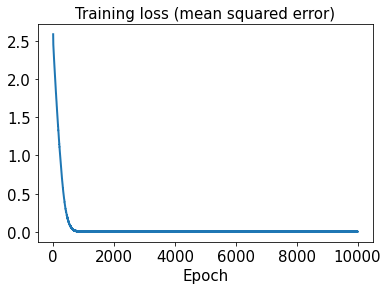

In [63]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

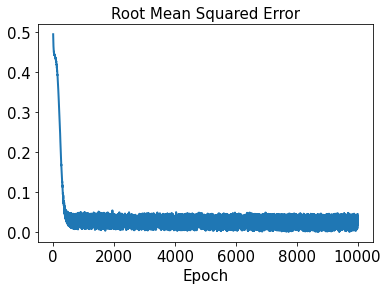

In [64]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [65]:
sd2.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [66]:
start2 = datetime.datetime.now()
history2 = sd2.fit(x_train2, y_train2, epochs=10000, shuffle=True)
end2 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 11ms/step - loss: 2.6774 - rmse: 1.6363
Epoch 2/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6685 - rmse: 1.6335
Epoch 3/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6602 - rmse: 1.6310
Epoch 4/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6519 - rmse: 1.6285
Epoch 5/10000
2/2 [==============================] - 0s 23ms/step - loss: 2.6437 - rmse: 1.6259
Epoch 6/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6355 - rmse: 1.6234
Epoch 7/10000
2/2 [==============================] - 0s 27ms/step - loss: 2.6274 - rmse: 1.6209
Epoch 8/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.6194 - rmse: 1.6184
Epoch 9/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6113 - rmse: 1.6160
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6032 - rmse: 1.6134
Epoch 11/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 2.0025 - rmse: 1.4150
Epoch 87/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9992 - rmse: 1.4139
Epoch 88/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9884 - rmse: 1.4101
Epoch 89/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9795 - rmse: 1.4069
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9724 - rmse: 1.4044
Epoch 91/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9690 - rmse: 1.4032
Epoch 92/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9578 - rmse: 1.3992
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9507 - rmse: 1.3966
Epoch 94/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9449 - rmse: 1.3945
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9385 - rmse: 1.3923
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 7ms/step - loss: 1.3974 - rmse: 1.1820
Epoch 171/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3968 - rmse: 1.1818
Epoch 172/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3890 - rmse: 1.1785
Epoch 173/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3757 - rmse: 1.1728
Epoch 174/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3692 - rmse: 1.1701
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3642 - rmse: 1.1680
Epoch 176/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3538 - rmse: 1.1635
Epoch 177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3479 - rmse: 1.1609
Epoch 178/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3422 - rmse: 1.1585
Epoch 179/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3319 - rmse: 1.1540
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8250 - rmse: 0.9082
Epoch 255/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8132 - rmse: 0.9017
Epoch 256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8113 - rmse: 0.9007
Epoch 257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8057 - rmse: 0.8975
Epoch 258/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7984 - rmse: 0.8935
Epoch 259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7910 - rmse: 0.8893
Epoch 260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7909 - rmse: 0.8892
Epoch 261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7815 - rmse: 0.8840
Epoch 262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7745 - rmse: 0.8800
Epoch 263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.7764 - rmse: 0.8811
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 6ms/step - loss: 0.4114 - rmse: 0.6414
Epoch 339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.4116 - rmse: 0.6415
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4035 - rmse: 0.6352
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.4063 - rmse: 0.6373
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3978 - rmse: 0.6306
Epoch 343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3976 - rmse: 0.6305
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3965 - rmse: 0.6296
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3873 - rmse: 0.6222
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3821 - rmse: 0.6181
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3788 - rmse: 0.6154
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.1856 - rmse: 0.4307
Epoch 423/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.1798 - rmse: 0.4239
Epoch 424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1756 - rmse: 0.4190
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1777 - rmse: 0.4215
Epoch 426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1716 - rmse: 0.4141
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1709 - rmse: 0.4133
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1670 - rmse: 0.4086
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1712 - rmse: 0.4137
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1639 - rmse: 0.4048
Epoch 431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1619 - rmse: 0.4022
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0700 - rmse: 0.2645
Epoch 507/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0691 - rmse: 0.2628
Epoch 508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0702 - rmse: 0.2648
Epoch 509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0682 - rmse: 0.2611
Epoch 510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0706 - rmse: 0.2656
Epoch 511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0673 - rmse: 0.2593
Epoch 512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0645 - rmse: 0.2539
Epoch 513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0693 - rmse: 0.2631
Epoch 514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0629 - rmse: 0.2507
Epoch 515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0624 - rmse: 0.2497
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.0272 - rmse: 0.1647
Epoch 591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0268 - rmse: 0.1634
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0251 - rmse: 0.1583
Epoch 593/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0227 - rmse: 0.1506
Epoch 594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0286 - rmse: 0.1689
Epoch 595/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0231 - rmse: 0.1519
Epoch 596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0229 - rmse: 0.1511
Epoch 597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0230 - rmse: 0.1516
Epoch 598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0231 - rmse: 0.1519
Epoch 599/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0235 - rmse: 0.1532
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 675/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 676/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0086 - rmse: 0.0925
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0108 - rmse: 0.1037
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0106 - rmse: 0.1029
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 681/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 682/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0119 - rmse: 0.1090
Epoch 683/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 759/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0091 - rmse: 0.0950
Epoch 760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0910
Epoch 761/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0838
Epoch 765/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 767/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0826
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 847/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7514e-04 - rmse: 0.0270
Epoch 848/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0686
Epoch 849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 852/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0916
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0391
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0813
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6781e-04 - rmse: 0.0269
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0680
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4376e-04 - rmse: 0.0282
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0333
Epoch 935/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 936/10000
2/2 [=================

2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 1010/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 1012/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.6835e-04 - rmse: 0.0229
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0502
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 1015/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1514e-04 - rmse: 0.0278
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 1019/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 1093/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 1094/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0492
Epoch 1097/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0714
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 1100/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0491
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 1102/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 6.1068e-04 - rmse: 0.0239
Epoch 1176/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1098e-04 - rmse: 0.0193
Epoch 1177/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 1178/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.0853e-04 - rmse: 0.0192
Epoch 1179/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 1180/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 1181/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8247e-04 - rmse: 0.0290
Epoch 1182/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 1183/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.5419e-04 - rmse: 0.0147
Epoch 1184/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9639e-04 - rmse: 0.0160
Epoch 1185/10

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 1259/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 1260/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 1261/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0916
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0542
Epoch 1266/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 1267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0610
Epoch 1268/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 1342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0879
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 1345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 1346/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7339e-04 - rmse: 0.0154
Epoch 1348/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 1349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0832
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1853e-04 - rmse: 0.0241
Epoch 1351/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 1424/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 1425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 1427/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2583e-05 - rmse: 0.0042
Epoch 1430/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4656e-04 - rmse: 0.0177
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0661e-04 - rmse: 0.0085
Epoch 1432/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4220e-04 - rmse: 0.0175
Epoch 1433/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 5.8756e-04 - rmse: 0.0235
Epoch 1506/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 1507/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.8975e-04 - rmse: 0.0293
Epoch 1508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 1509/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.8337e-04 - rmse: 0.0274
Epoch 1510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 1511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0672
Epoch 1512/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3662e-04 - rmse: 0.0224
Epoch 1513/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 1514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0567
Epoch 1515/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 1588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0958
Epoch 1589/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 1590/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 1591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 1592/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0856
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0074 - rmse: 0.0859
Epoch 1594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0743
Epoch 1595/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 1596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 1597/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 1670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 1671/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 1672/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3629e-04 - rmse: 0.0175
Epoch 1673/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.9366e-04 - rmse: 0.0276
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6073e-04 - rmse: 0.0182
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 1676/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 1677/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 1678/10000
2/2 [==============================] - 0s 20ms/step - loss: 1.5788e-04 - rmse: 0.0113
Epoch 1679/10000
2/

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 1752/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9283e-04 - rmse: 0.0191
Epoch 1753/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 1754/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 1755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 1756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 1758/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7021e-04 - rmse: 0.0155
Epoch 1759/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 1760/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.8625e-04 - rmse: 0.0214
Epoch 1761/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 8.6074e-04 - rmse: 0.0288
Epoch 1834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 1835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 1836/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 1837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 1838/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 1839/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.0354e-04 - rmse: 0.0194
Epoch 1840/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6432e-04 - rmse: 0.0183
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 1842/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 1843/10000
2/2 [===

Epoch 1916/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 1917/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0737
Epoch 1918/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6515e-04 - rmse: 0.0289
Epoch 1919/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 1920/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 1921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 1922/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 1923/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 1924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 1926/10000

2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 1999/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 2000/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 2001/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3702e-04 - rmse: 0.0145
Epoch 2002/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 2003/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8676e-04 - rmse: 0.0126
Epoch 2004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0817
Epoch 2005/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.6890e-04 - rmse: 0.0210
Epoch 2006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 2007/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 2008/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 2082/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.4797e-04 - rmse: 0.0205
Epoch 2083/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 2084/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 2085/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 2086/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 2087/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 2088/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 2089/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 2090/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 2091/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 2164/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2166/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 2167/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2168/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 2169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 2170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 2171/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 2172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 2173/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 2247/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 2248/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0094e-04 - rmse: 0.0260
Epoch 2249/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 2250/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9317e-04 - rmse: 0.0164
Epoch 2251/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 2252/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4400e-04 - rmse: 0.0109
Epoch 2253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 2254/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 2255/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6061e-04 - rmse: 0.0231
Epoch 2256/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 2329/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.5025e-04 - rmse: 0.0229
Epoch 2330/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0796
Epoch 2331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 2332/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 2333/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2334/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 2335/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2304e-04 - rmse: 0.0173
Epoch 2336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 2337/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 2338/10000
2/2 [=====

2/2 [==============================] - 0s 7ms/step - loss: 6.6265e-04 - rmse: 0.0253
Epoch 2411/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6301e-04 - rmse: 0.0155
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 2413/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 2414/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0493
Epoch 2415/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.5099e-04 - rmse: 0.0270
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 2418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0797
Epoch 2419/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 2420/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 2493/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 2495/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 2496/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9655e-04 - rmse: 0.0193
Epoch 2498/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 2499/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 2500/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.8327e-04 - rmse: 0.0310
Epoch 2501/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 2502/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 2575/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 2577/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4045e-04 - rmse: 0.0228
Epoch 2578/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.3675e-04 - rmse: 0.0267
Epoch 2579/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6028e-04 - rmse: 0.0253
Epoch 2580/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0766
Epoch 2581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 2582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 2583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 2584/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 3.8712e-04 - rmse: 0.0191
Epoch 2657/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5805e-04 - rmse: 0.0183
Epoch 2658/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 2659/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0082e-04 - rmse: 0.0241
Epoch 2660/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1936e-04 - rmse: 0.0172
Epoch 2661/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 2662/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 2663/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.9572e-04 - rmse: 0.0260
Epoch 2664/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5655e-04 - rmse: 0.0116
Epoch 2665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 2666/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 2741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2742/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 2743/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0404
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 2745/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 2746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2747/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4438e-04 - rmse: 0.0269
Epoch 2748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 2749/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 2822/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 2823/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 2824/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 2825/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2826/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.4909e-04 - rmse: 0.0151
Epoch 2827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0066 - rmse: 0.0812
Epoch 2828/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 2829/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3237e-04 - rmse: 0.0106
Epoch 2830/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5567e-04 - rmse: 0.0208
Epoch 2831/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 2904/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 2905/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0052 - rmse: 0.0723
Epoch 2906/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2907/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 2908/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5815e-04 - rmse: 0.0117
Epoch 2909/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 2910/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2911/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 2912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 2913/10000
2/2 [==========

2/2 [==============================] - 0s 6ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 2987/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 2988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 2989/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0986e-04 - rmse: 0.0095
Epoch 2992/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7437e-04 - rmse: 0.0256
Epoch 2993/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 2995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0736
Epoch 2996/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.8969e-04 - rmse: 0.0217
Epoch 3069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 3070/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1372e-04 - rmse: 0.0139
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 3073/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 3074/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.0621e-04 - rmse: 0.0093
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9072e-04 - rmse: 0.0217
Epoch 3077/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 3078/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 8.4450e-04 - rmse: 0.0287
Epoch 3151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 3152/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.7763e-04 - rmse: 0.0293
Epoch 3153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 3154/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3155/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 3156/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 3157/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 3158/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.2993e-04 - rmse: 0.0267
Epoch 3159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 3160/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 3233/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 3234/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 3235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0757
Epoch 3236/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 3237/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 3238/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0052 - rmse: 0.0719
Epoch 3239/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 3240/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0725
Epoch 3241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 3242/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 2.1570e-04 - rmse: 0.0140
Epoch 3316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 3317/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3318/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 3319/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2463e-04 - rmse: 0.0103
Epoch 3320/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1506e-04 - rmse: 0.0140
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 3322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 3323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 3324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 3325/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0802
Epoch 3398/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 3399/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 3400/10000
2/2 [==============================] - 0s 6ms/step - loss: 8.1789e-04 - rmse: 0.0283
Epoch 3401/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5589e-04 - rmse: 0.0252
Epoch 3402/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5639e-04 - rmse: 0.0209
Epoch 3403/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0229e-04 - rmse: 0.0280
Epoch 3404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3405/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 3406/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 3407/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 3480/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1154e-04 - rmse: 0.0244
Epoch 3481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 3482/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0643
Epoch 3483/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 3484/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0779
Epoch 3485/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 3486/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 3487/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 3488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 3489/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 3563/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8600e-04 - rmse: 0.0130
Epoch 3565/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 3566/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1632e-04 - rmse: 0.0200
Epoch 3567/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 3568/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 3569/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1609e-04 - rmse: 0.0141
Epoch 3570/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8123e-04 - rmse: 0.0128
Epoch 3571/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5052e-04 - rmse: 0.0289
Epoch 3572/10000


2/2 [==============================] - 0s 7ms/step - loss: 2.7113e-04 - rmse: 0.0159
Epoch 3645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 3646/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1834e-04 - rmse: 0.0142
Epoch 3647/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8529e-04 - rmse: 0.0129
Epoch 3648/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 3649/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6172e-04 - rmse: 0.0156
Epoch 3650/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 3651/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.3870e-04 - rmse: 0.0249
Epoch 3652/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.7432e-04 - rmse: 0.0309
Epoch 3653/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 3654/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 3728/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 3729/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 3730/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0428
Epoch 3731/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 3732/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 3733/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 3734/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 3735/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 3736/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 3737/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 2.7280e-04 - rmse: 0.0160
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 3813/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 3815/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5427e-04 - rmse: 0.0209
Epoch 3816/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8251e-04 - rmse: 0.0163
Epoch 3817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 3818/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1918e-04 - rmse: 0.0101
Epoch 3819/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 3820/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3893/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3895/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4871e-04 - rmse: 0.0115
Epoch 3896/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4637e-04 - rmse: 0.0305
Epoch 3898/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0514e-04 - rmse: 0.0137
Epoch 3899/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 3900/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.3439e-04 - rmse: 0.0268
Epoch 3901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 3902/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 3976/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 3977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 3978/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 3979/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 3980/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.4891e-04 - rmse: 0.0271
Epoch 3981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 3982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 3983/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 3984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 3985/10000
2/2 [==========

2/2 [==============================] - 0s 7ms/step - loss: 5.0157e-04 - rmse: 0.0220
Epoch 4058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0349
Epoch 4059/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 4060/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.4412e-04 - rmse: 0.0288
Epoch 4063/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 4064/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.3016e-04 - rmse: 0.0248
Epoch 4065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 4066/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 4067/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 6.1496e-05 - rmse: 0.0067
Epoch 4140/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 4141/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 4142/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0688
Epoch 4143/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 4144/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 4145/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0483
Epoch 4146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 4147/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5050e-04 - rmse: 0.0153
Epoch 4148/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 4149/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 4223/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 4226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 4227/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 4228/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 4229/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 4230/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 4231/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 4.0178e-04 - rmse: 0.0196
Epoch 4305/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 4306/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1545e-04 - rmse: 0.0264
Epoch 4307/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.3662e-04 - rmse: 0.0228
Epoch 4308/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 4309/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 4310/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 4311/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2729e-04 - rmse: 0.0203
Epoch 4312/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1104e-04 - rmse: 0.0199
Epoch 4313/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 4314/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4387/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 4388/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 4389/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 4390/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.1049e-05 - rmse: 0.0039
Epoch 4391/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6433e-05 - rmse: 0.0084
Epoch 4392/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 4393/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.7793e-05 - rmse: 0.0079
Epoch 4394/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5802e-04 - rmse: 0.0119
Epoch 4395/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8111e-05 - rmse: 0.0035
Epoch 4396/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739
Epoch 4469/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 4470/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4854e-04 - rmse: 0.0182
Epoch 4471/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 4472/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 4473/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6704e-04 - rmse: 0.0187
Epoch 4474/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 4475/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.0267e-04 - rmse: 0.0242
Epoch 4476/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.3491e-04 - rmse: 0.0303
Epoch 4477/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.9702e-04 - rmse: 0.0195
Epoch 4478/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 4551/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4552/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 4553/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 4554/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 4555/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0860
Epoch 4556/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 4557/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 4558/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 4559/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 4560/10000
2/2 [==============

2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 4634/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 4635/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 4636/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 4637/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0858
Epoch 4638/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0057 - rmse: 0.0752
Epoch 4639/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1469e-04 - rmse: 0.0300
Epoch 4640/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2150e-04 - rmse: 0.0225
Epoch 4641/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 4642/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 4643/10000
2/2 [=======

Epoch 4716/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0854
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 4718/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 4719/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 4720/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0072 - rmse: 0.0846
Epoch 4721/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 4722/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 4723/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 4724/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 4725/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 4726/10000
2/2

2/2 [==============================] - 0s 8ms/step - loss: 9.6306e-04 - rmse: 0.0308
Epoch 4800/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0789
Epoch 4801/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 4802/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0612
Epoch 4803/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3538e-04 - rmse: 0.0268
Epoch 4804/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.3985e-04 - rmse: 0.0269
Epoch 4805/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9582e-04 - rmse: 0.0313
Epoch 4806/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 4807/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 4808/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2135e-04 - rmse: 0.0202
Epoch 4809/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 4882/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 4883/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.3125e-04 - rmse: 0.0178
Epoch 4884/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4885/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 4886/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 4887/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0781
Epoch 4888/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 4890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0685
Epoch 4891/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 4965/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4966/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 4967/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 4968/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 4969/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4938e-04 - rmse: 0.0116
Epoch 4970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4971/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 4972/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0214e-04 - rmse: 0.0242
Epoch 4973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 4974/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 5048/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0699
Epoch 5049/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 5050/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 5051/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 5052/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 5053/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0786
Epoch 5054/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.7908e-04 - rmse: 0.0276
Epoch 5055/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 5056/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 5057/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 5130/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 5131/10000
2/2 [==============================] - 0s 6ms/step - loss: 2.9275e-04 - rmse: 0.0167
Epoch 5132/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 5133/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2312e-04 - rmse: 0.0225
Epoch 5134/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 5135/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 5136/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.4155e-04 - rmse: 0.0207
Epoch 5137/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0741
Epoch 5138/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9600e-04 - rmse: 0.0313
Epoch 5139/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 8.8096e-04 - rmse: 0.0294
Epoch 5212/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0051 - rmse: 0.0711
Epoch 5213/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 5214/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 5215/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 5216/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 5217/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 5218/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 5219/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 5220/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0709
Epoch 5221/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 5294/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 5295/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5296/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 5297/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1650e-04 - rmse: 0.0142
Epoch 5298/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7646e-04 - rmse: 0.0127
Epoch 5299/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5300/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 5301/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 5302/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8266e-04 - rmse: 0.0130
Epoch 5303/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 8.9336e-04 - rmse: 0.0296
Epoch 5376/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6354e-05 - rmse: 0.0079
Epoch 5377/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 5378/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5379/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2957e-04 - rmse: 0.0178
Epoch 5380/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9544e-04 - rmse: 0.0135
Epoch 5381/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 5382/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 5383/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9719e-05 - rmse: 0.0087
Epoch 5384/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0641
Epoch 5385/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 5458/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 5459/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 5460/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 5461/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 5462/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0728
Epoch 5463/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0075 - rmse: 0.0868
Epoch 5464/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 5465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 5466/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 5467/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 8.4729e-04 - rmse: 0.0289
Epoch 5541/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 5542/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0828
Epoch 5543/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 5544/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 5545/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 5546/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5547/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 5548/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.8613e-04 - rmse: 0.0278
Epoch 5549/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 5550/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 3.7427e-04 - rmse: 0.0190
Epoch 5623/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.3216e-04 - rmse: 0.0204
Epoch 5624/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5625/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0754
Epoch 5626/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7875e-04 - rmse: 0.0191
Epoch 5627/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5628/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 5629/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 5630/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 5631/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 5632/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 5705/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 5706/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 5707/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0891
Epoch 5708/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.5554e-04 - rmse: 0.0210
Epoch 5709/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 5710/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0175e-04 - rmse: 0.0262
Epoch 5711/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 5712/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 5713/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 5714/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 5.0893e-04 - rmse: 0.0222
Epoch 5788/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 5789/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 5790/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 5791/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 5792/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 5793/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 5794/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0160e-04 - rmse: 0.0094
Epoch 5795/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 5796/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.8000e-04 - rmse: 0.0216
Epoch 5797/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 7.2467e-04 - rmse: 0.0267
Epoch 5870/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 5871/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6005e-04 - rmse: 0.0254
Epoch 5872/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0074 - rmse: 0.0862
Epoch 5873/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 5874/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9311e-04 - rmse: 0.0279
Epoch 5875/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 5876/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 5877/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0704
Epoch 5878/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 5879/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 5953/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 5954/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 5955/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 5956/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 5957/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 5958/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 5959/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 5960/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 5961/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0734
Epoch 5962/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 6036/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 6037/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 6038/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 6039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 6040/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 6041/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 6042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 6043/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0713
Epoch 6044/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 6045/10000
2/2 [===============

2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 6119/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 6120/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 6121/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 6122/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 6123/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6124/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6125/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 6126/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 6127/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0566
Epoch 6128/10000
2/2 [=============

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 6201/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 6202/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8877e-04 - rmse: 0.0240
Epoch 6203/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 6204/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0619
Epoch 6205/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0701
Epoch 6206/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 6207/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 6208/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 6209/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.2836e-04 - rmse: 0.0227
Epoch 6210/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 6283/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 6284/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 6285/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 6286/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 6287/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2683e-04 - rmse: 0.0106
Epoch 6288/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 6289/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6290/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3425e-04 - rmse: 0.0110
Epoch 6291/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 6292/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 6366/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 6367/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 6368/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 6369/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6370/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 6371/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 6372/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 6373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0391
Epoch 6374/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 6375/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 6449/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0762
Epoch 6450/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 6451/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 6452/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6453/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8416e-04 - rmse: 0.0193
Epoch 6454/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 6455/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0756
Epoch 6456/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 6457/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 6458/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 6532/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 6533/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2990e-04 - rmse: 0.0227
Epoch 6534/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 6535/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 6536/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0687
Epoch 6537/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 6538/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.9329e-04 - rmse: 0.0313
Epoch 6539/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3454e-04 - rmse: 0.0287
Epoch 6540/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.1020e-04 - rmse: 0.0264
Epoch 6541/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0795
Epoch 6615/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 6616/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 6617/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 6618/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5815e-04 - rmse: 0.0307
Epoch 6619/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 6620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 6621/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4324e-04 - rmse: 0.0114
Epoch 6622/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6623/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 6624/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 6698/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4567e-04 - rmse: 0.0152
Epoch 6699/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 6700/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 6701/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 6702/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 6703/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 6704/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 6705/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 6706/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5462e-04 - rmse: 0.0119
Epoch 6707/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 6780/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 6781/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 6782/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 6783/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0603
Epoch 6784/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 6785/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 6786/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 6787/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6432e-04 - rmse: 0.0123
Epoch 6788/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8026e-04 - rmse: 0.0163
Epoch 6789/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 6.2240e-04 - rmse: 0.0247
Epoch 6862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 6863/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7655e-04 - rmse: 0.0294
Epoch 6864/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9199e-04 - rmse: 0.0167
Epoch 6865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 6866/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1867e-04 - rmse: 0.0175
Epoch 6867/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1477e-04 - rmse: 0.0173
Epoch 6868/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5648e-04 - rmse: 0.0210
Epoch 6869/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 6870/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 6871/10

2/2 [==============================] - 0s 8ms/step - loss: 5.6909e-04 - rmse: 0.0236
Epoch 6944/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0844
Epoch 6945/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.3911e-04 - rmse: 0.0250
Epoch 6946/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0050 - rmse: 0.0710
Epoch 6947/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4330e-04 - rmse: 0.0207
Epoch 6948/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 6949/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5404e-04 - rmse: 0.0184
Epoch 6950/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 6951/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 6952/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5853e-04 - rmse: 0.0120
Epoch 6953/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 7026/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7027/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 7028/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 7029/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 7030/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.8415e-05 - rmse: 0.0087
Epoch 7031/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7032/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 7033/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 7034/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 7035/10000
2/2 [========

2/2 [==============================] - 0s 8ms/step - loss: 3.4541e-04 - rmse: 0.0182
Epoch 7109/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 7111/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7112/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.3754e-04 - rmse: 0.0269
Epoch 7113/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 7114/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 7115/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 7116/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 7117/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 7118/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 7191/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 7192/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.2410e-04 - rmse: 0.0176
Epoch 7193/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3463e-04 - rmse: 0.0179
Epoch 7194/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 7195/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7196/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7197/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7198/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 7199/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7200/10000
2/2 [======

2/2 [==============================] - 0s 7ms/step - loss: 1.4437e-04 - rmse: 0.0114
Epoch 7273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7274/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 7275/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 7276/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 7277/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 7278/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 7279/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 7280/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 7281/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7282/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 7355/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 7356/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 7357/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7048e-04 - rmse: 0.0214
Epoch 7358/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 7359/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 7360/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.1331e-04 - rmse: 0.0100
Epoch 7361/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7850e-04 - rmse: 0.0163
Epoch 7362/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7363/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 7364/10000
2/2 [===

2/2 [==============================] - 0s 20ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 7437/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.9473e-04 - rmse: 0.0297
Epoch 7438/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7439/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.0792e-05 - rmse: 0.0052
Epoch 7440/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.8727e-04 - rmse: 0.0165
Epoch 7441/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7442/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 7443/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.8236e-05 - rmse: 0.0067
Epoch 7444/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 7445/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4514e-05 - rmse: 0.0090
Epoch 7446/

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 7519/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 7520/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 7521/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 7522/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0073 - rmse: 0.0852
Epoch 7523/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 7524/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 7525/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 7526/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 7527/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7895e-04 - rmse: 0.0311
Epoch 7528/10000
2/2 [===========

Epoch 7601/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6694e-04 - rmse: 0.0124
Epoch 7602/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 7603/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 7604/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6297e-04 - rmse: 0.0308
Epoch 7605/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2199e-04 - rmse: 0.0284
Epoch 7606/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 7607/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 7608/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 7609/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4087e-04 - rmse: 0.0230
Epoch 7610/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0330
Epoc

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 7684/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7685/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7686/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 7687/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 7688/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 7689/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 7690/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 7691/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 7692/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 7693/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 7767/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.4017e-04 - rmse: 0.0181
Epoch 7768/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 7769/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7893e-04 - rmse: 0.0258
Epoch 7770/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 7771/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9538e-04 - rmse: 0.0241
Epoch 7772/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0053 - rmse: 0.0727
Epoch 7773/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 7774/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0062 - rmse: 0.0788
Epoch 7775/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 7776/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 7849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 7850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 7851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0065 - rmse: 0.0806
Epoch 7852/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0674
Epoch 7853/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7668e-04 - rmse: 0.0215
Epoch 7854/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 7855/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 7856/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 7857/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 7858/10000
2/2 [===========

2/2 [==============================] - 0s 6ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 7932/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 7933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 7934/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.6853e-04 - rmse: 0.0256
Epoch 7935/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 7936/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 7937/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0770
Epoch 7938/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 7939/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0418
Epoch 7940/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.9112e-04 - rmse: 0.0167
Epoch 7941/10000
2/2 [======

2/2 [==============================] - 0s 9ms/step - loss: 1.0058e-04 - rmse: 0.0094
Epoch 8015/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.7084e-04 - rmse: 0.0161
Epoch 8016/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 8017/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.6477e-04 - rmse: 0.0255
Epoch 8018/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0654e-04 - rmse: 0.0139
Epoch 8019/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8020/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0403
Epoch 8021/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0831
Epoch 8022/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 8023/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8024/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 8097/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 8098/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.0130e-04 - rmse: 0.0298
Epoch 8099/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4066e-04 - rmse: 0.0305
Epoch 8100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8101/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 8102/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0328
Epoch 8103/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 8104/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0358
Epoch 8105/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 8106/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8179/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 8180/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 8181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 8182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 8183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 8184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 8185/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9691e-04 - rmse: 0.0220
Epoch 8186/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 8187/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.3458e-04 - rmse: 0.0205
Epoch 8188/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8261/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 8262/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 8263/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 8264/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 8265/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 8266/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 8267/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4148e-04 - rmse: 0.0151
Epoch 8268/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 8269/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9165e-05 - rmse: 0.0040
Epoch 8270/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8343/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 8344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8345/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 8346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 8348/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1470e-04 - rmse: 0.0283
Epoch 8349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 8350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 8351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8352/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 8425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 8426/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 8427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0078 - rmse: 0.0880
Epoch 8428/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0057 - rmse: 0.0756
Epoch 8429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 8430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 8431/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.6186e-04 - rmse: 0.0274
Epoch 8432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 8434/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 9.0147e-05 - rmse: 0.0088
Epoch 8508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0792
Epoch 8509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 8510/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7369e-04 - rmse: 0.0190
Epoch 8511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 8512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 8514/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 8515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 8516/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 8517/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 5.4586e-04 - rmse: 0.0231
Epoch 8590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0841
Epoch 8591/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7209e-04 - rmse: 0.0214
Epoch 8592/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.2987e-04 - rmse: 0.0248
Epoch 8593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 8594/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0729
Epoch 8595/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0815
Epoch 8596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 8597/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0735
Epoch 8598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8599/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 8673/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 8675/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.2981e-04 - rmse: 0.0268
Epoch 8676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 8677/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0153e-04 - rmse: 0.0243
Epoch 8678/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 8679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 8680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 8681/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0057 - rmse: 0.0757
Epoch 8682/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.7837e-04 - rmse: 0.0163
Epoch 8755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 8756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 8757/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 8758/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0738
Epoch 8759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 8760/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1761e-04 - rmse: 0.0103
Epoch 8761/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 8763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 8764/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0054 - rmse: 0.0732
Epoch 8838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 8839/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 8840/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8841/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 8842/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0668
Epoch 8843/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 8844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 8845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 8846/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0879
Epoch 8847/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0918
Epoch 8921/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8922/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 8923/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0798
Epoch 8924/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 8925/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 8926/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 8927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 8928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 8929/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 8930/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 9003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 9004/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 9005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9006/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0052 - rmse: 0.0722
Epoch 9007/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 9008/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0479
Epoch 9009/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 9010/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.3641e-04 - rmse: 0.0180
Epoch 9011/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 9012/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 9086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 9087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 9088/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 9089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 9090/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 9091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 9092/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 9093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 9094/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0062 - rmse: 0.0787
Epoch 9095/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 5.7995e-04 - rmse: 0.0238
Epoch 9169/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0847
Epoch 9170/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 9171/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.7329e-04 - rmse: 0.0257
Epoch 9172/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 9173/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 9174/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 9175/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 9176/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 9177/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4261e-04 - rmse: 0.0114
Epoch 9178/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 1.3980e-04 - rmse: 0.0113
Epoch 9251/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 9252/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 9253/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2955e-04 - rmse: 0.0286
Epoch 9254/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7114e-04 - rmse: 0.0257
Epoch 9255/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 9256/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 9257/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 9258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 9259/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9260/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 9333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 9334/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.8224e-04 - rmse: 0.0311
Epoch 9335/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.4628e-04 - rmse: 0.0306
Epoch 9336/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 9337/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 9338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 9339/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0070 - rmse: 0.0838
Epoch 9340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 9341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0731
Epoch 9342/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 9415/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 9416/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 9417/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 9418/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9419/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.2321e-04 - rmse: 0.0203
Epoch 9420/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 9421/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 9422/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.6887e-04 - rmse: 0.0309
Epoch 9423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 9424/10000
2/2 [====

2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 9497/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4284e-04 - rmse: 0.0152
Epoch 9498/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 9499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 9500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0733
Epoch 9501/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8276e-04 - rmse: 0.0165
Epoch 9502/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5112e-04 - rmse: 0.0184
Epoch 9503/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 9504/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8233e-04 - rmse: 0.0217
Epoch 9505/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 9506/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 2.3340e-04 - rmse: 0.0149
Epoch 9580/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 9581/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8531e-04 - rmse: 0.0165
Epoch 9582/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 9583/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6302e-04 - rmse: 0.0292
Epoch 9584/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.3162e-05 - rmse: 0.0064
Epoch 9585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 9586/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 9587/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0068 - rmse: 0.0824
Epoch 9588/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9589/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 4.0012e-04 - rmse: 0.0197
Epoch 9662/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0635
Epoch 9663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 9664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 9665/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 9666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 9667/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0783
Epoch 9668/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 9669/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0809
Epoch 9670/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 9671/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0638
Epoch 9744/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 9745/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.5291e-04 - rmse: 0.0253
Epoch 9746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0054 - rmse: 0.0737
Epoch 9747/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0730
Epoch 9748/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 9749/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6974e-05 - rmse: 0.0087
Epoch 9750/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 9751/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 9752/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 9753/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 9826/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0206e-04 - rmse: 0.0281
Epoch 9827/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0074 - rmse: 0.0862
Epoch 9828/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0792e-04 - rmse: 0.0282
Epoch 9829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0850
Epoch 9830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 9831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 9832/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0056 - rmse: 0.0747
Epoch 9833/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 9834/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 9835/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 9909/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 9910/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0050 - rmse: 0.0706
Epoch 9911/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9912/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.2889e-04 - rmse: 0.0227
Epoch 9913/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9914/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.2881e-04 - rmse: 0.0303
Epoch 9915/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 9916/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 9917/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0355
Epoch 9918/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 6.8785e-04 - rmse: 0.0260
Epoch 9992/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0565
Epoch 9993/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 9994/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 9995/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 9996/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9997/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 9998/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8283e-04 - rmse: 0.0165
Epoch 9999/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0817e-05 - rmse: 0.0030
Epoch 10000/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0055 - rmse: 0.0739


In [67]:
time2 = end2 - start2
print("Training time (Case 2):", time2)

Training time (Case 2): 0:02:53.666064


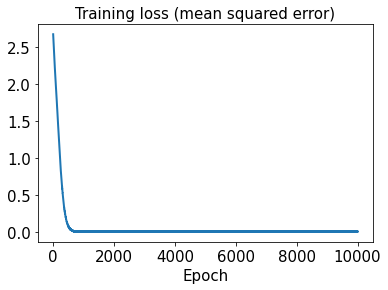

In [68]:
hist2 = history2.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

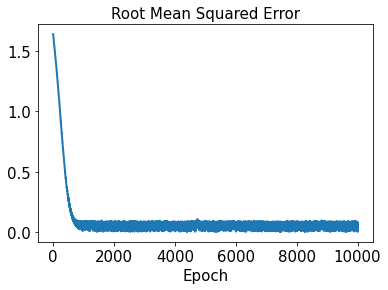

In [69]:
plt.plot(hist2['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [70]:
test_results2 = sd2.evaluate(x_test2)

1/1 [==============================] - 0s 83ms/step - loss: 1.1669e-05 - rmse: 0.0000e+00


In [71]:
decoded_sensor_train2 = sensor_pred2.predict(t_train)

In [72]:
decoded_sensor_test2 = sensor_pred2.predict(t_test)

In [73]:
decoded_train2 = sd2.predict(decoded_sensor_train2)

In [74]:
decoded_test2 = sd2.predict(decoded_sensor_test2)

In [75]:
error_train_abs2 = np.abs(decoded_train2 - y_train2)

In [76]:
error_test_abs2 = np.abs(decoded_test2 - y_test2)

In [77]:
l2_error_train2 = np.sqrt(np.sum((decoded_train2 - y_train2)**2) / np.sum(y_train2**2))
print(l2_error_train2)

0.1436060634857484


In [78]:
l2_error_test2 = np.sqrt(np.sum((decoded_test2 - y_test2)**2) / np.sum(y_test2**2))
print(l2_error_test2)

0.11854563658347604


In [79]:
l2_error_train_list2 = []
for i in range(0, len(x_train2)):
    l2_error_train_data2 = np.sqrt(np.sum((decoded_train2[i] - y_train2[i])**2) / np.sum(y_train2[i]**2))
    l2_error_train_list2.append(l2_error_train_data2)
print(l2_error_train_list2)

[0.12264913070342785, 0.2637285737150983, 0.06631284569988188, 0.1765016135860989, 0.10254836154230912, 0.22807589503429615, 0.12903084520514052, 0.1337143943102692, 0.1158848779759186, 0.10536977824985204, 0.11512301185231605, 0.2985285740945633, 0.08661824737936226, 0.2711443696676391, 0.19114459769698539, 0.29327113101836266, 0.13374486531181537, 0.012783703604617664, 0.28823479380152195, 0.13594709743941705, 0.08587615736633286, 0.2822354233032438, 0.09563674147643446, 0.015298922378165679, 0.12456254680726525, 0.2103342531434791, 0.002411770429036793, 0.07183262040160025, 0.03226553631197919, 0.2533417156641403, 0.1423588771188274, 0.10886683745464013, 0.07634604322047109]


In [80]:
l2_error_test_list2 = []
for i in range(0, len(x_test2)):
    l2_error_test_data2 = np.sqrt(np.sum((decoded_test2[i] - y_test2[i])**2) / np.sum(y_test2[i]**2))
    l2_error_test_list2.append(l2_error_test_data2)
print(l2_error_test_list2)

[0.03238079110960471, 0.15748770281177618, 0.24125015667075847, 0.049696906831081224, 0.27670389854740257, 0.05795637319154992, 0.05257296996633025, 0.06703700300359947]


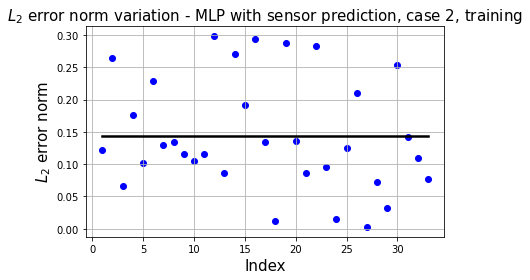

In [81]:
plt.plot(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train2*np.ones(x_train2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train2.shape[0], x_train2.shape[0]), l2_error_train_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

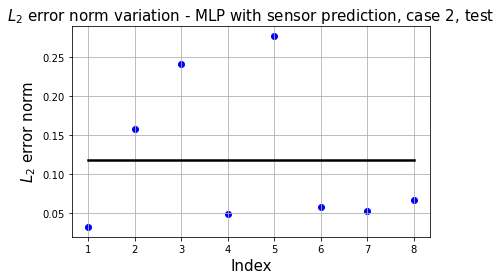

In [82]:
plt.plot(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test2*np.ones(x_test2.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test2.shape[0], x_test2.shape[0]), l2_error_test_list2, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 2, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

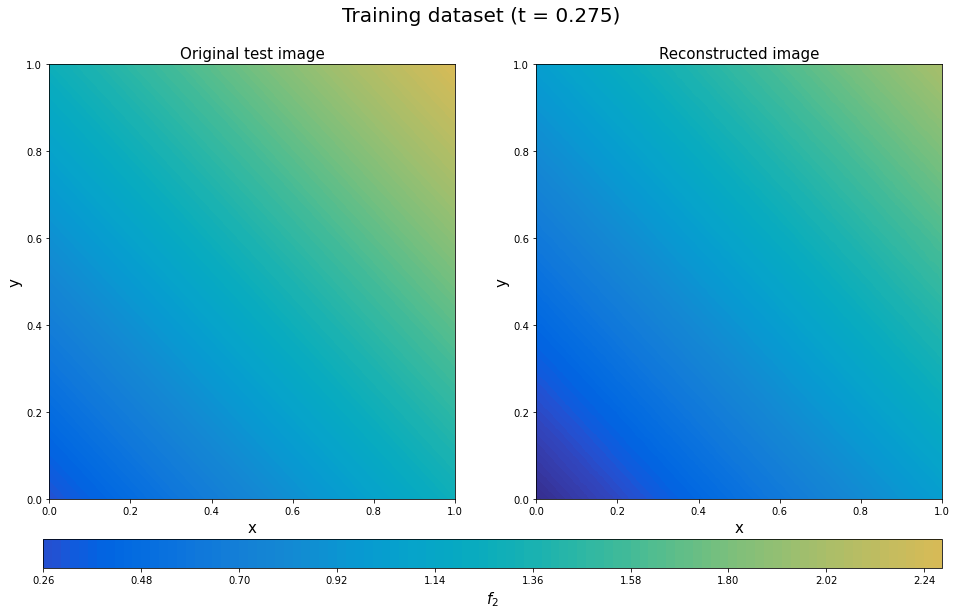

In [83]:
plt.figure(figsize=(16, 8))
y_train2_14_rotate = y_train2[14].T.reshape(101,101)
decoded_rotate2 = decoded_train2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_14_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[11]),fontsize=20)
plt.show()

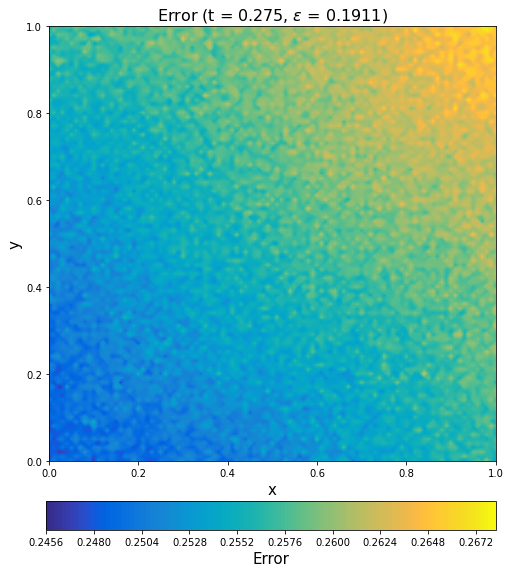

In [84]:
error_train_abs2_rotate14 = error_train_abs2[14].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate14, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.275, $\epsilon$ = %.4f)' %(l2_error_train_list2[14]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

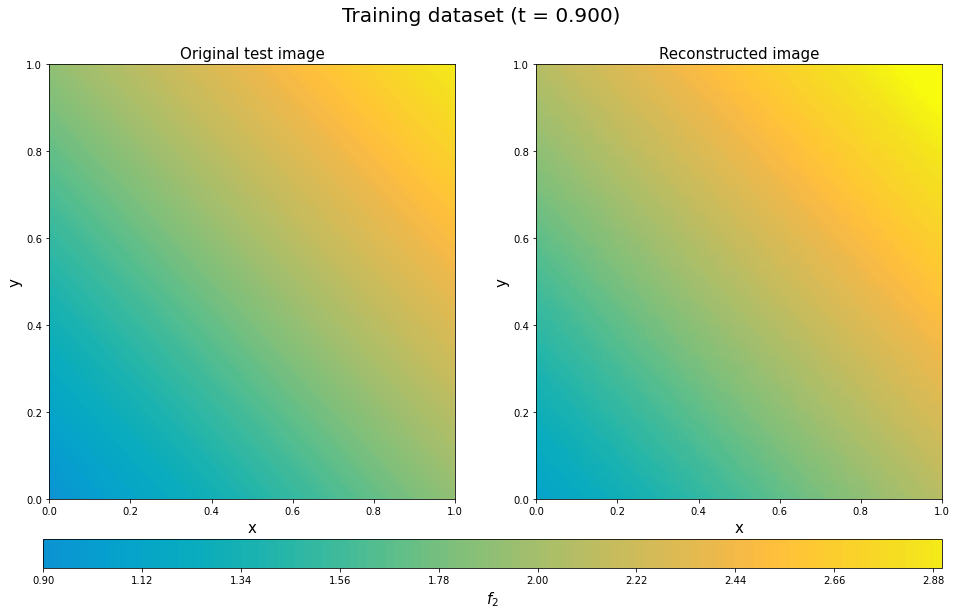

In [85]:
plt.figure(figsize=(16, 8))
y_train2_22_rotate = y_train2[22].T.reshape(101,101)
decoded_rotate2 = decoded_train2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train2_22_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[36]), fontsize=20)
plt.show()

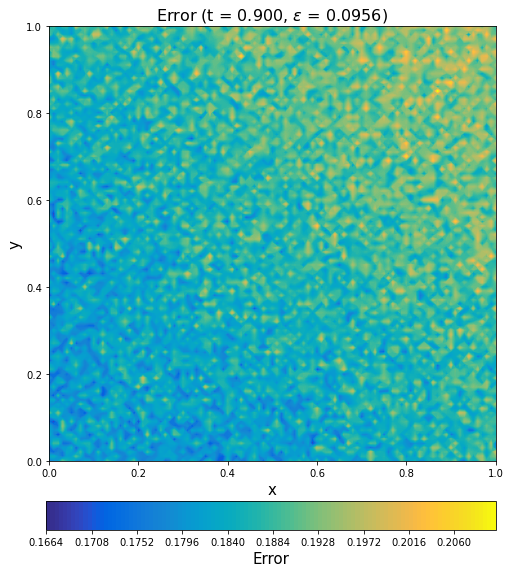

In [86]:
error_train_abs2_rotate22 = error_train_abs2[22].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate22, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.900, $\epsilon$ = %.4f)' %(l2_error_train_list2[22]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

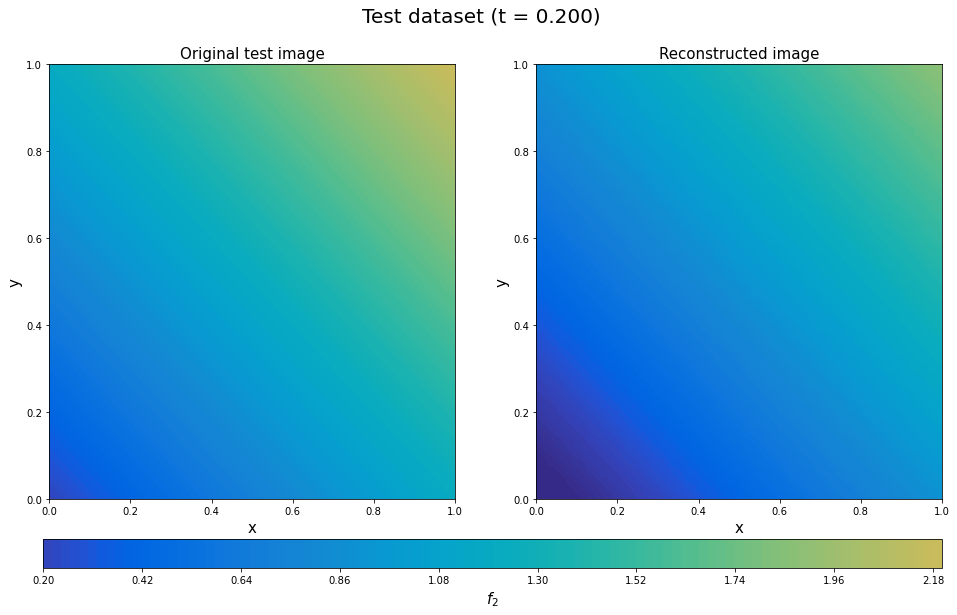

In [87]:
plt.figure(figsize=(16, 8))
y_test2_2_rotate = y_test2[2].T.reshape(101,101)
decoded_rotate2 = decoded_test2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

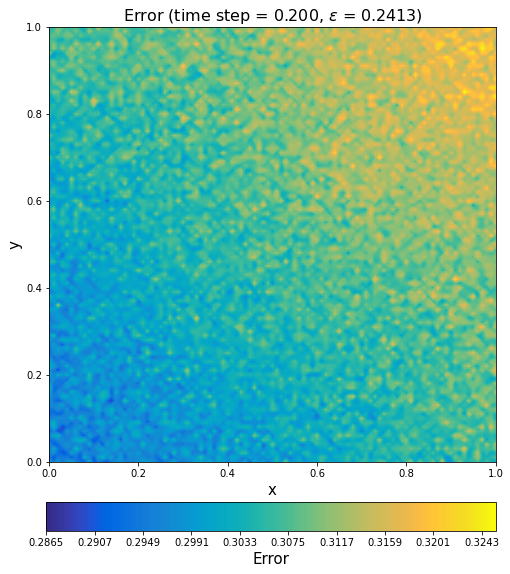

In [88]:
error_test_abs2_rotate2 = error_test_abs2[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (time step = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list2[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

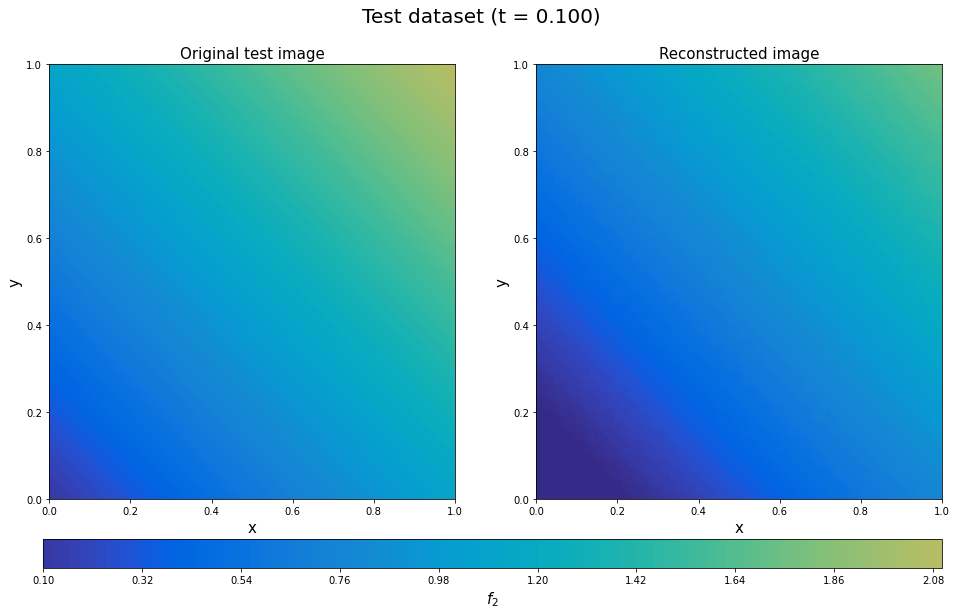

In [89]:
plt.figure(figsize=(16, 8))
y_test2_4_rotate = y_test2[4].T.reshape(101,101)
decoded_rotate2 = decoded_test2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test2_4_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate2, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(0.0,3.0)
a2.set_clim(0.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_2$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[4]),fontsize=20)
plt.show()

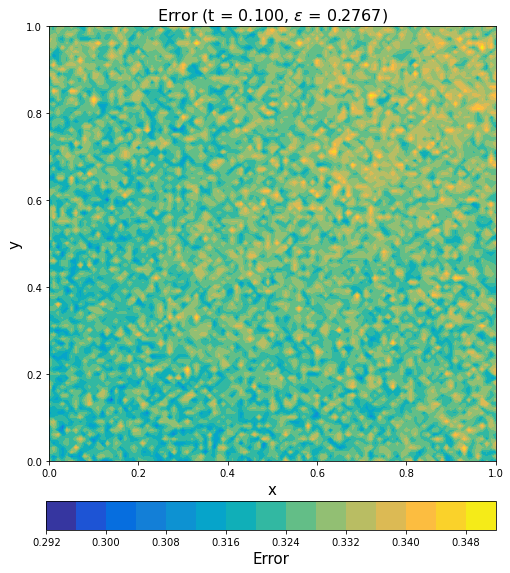

In [90]:
error_test_abs2_rotate4 = error_test_abs2[4].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate4, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.100, $\epsilon$ = %.4f)' %(l2_error_test_list2[4]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

Case 3: f3

In [91]:
out3 = np.zeros((41, 101, 101))
for i in range(0, 41):
    for j in range(0, 101):
        for k in range(0, 101):
            out3[i, j, k] = np.exp(-t[i])*(2*np.sin(2*np.pi*x[j]) + np.sin(2*np.pi*x[j])*np.cos(2*np.pi*y[k]))

In [92]:
sensor3 = np.zeros((41, 4, 4))
for i in range(0, len(t)):
    for j in range(0, 4):
        for k in range(0, 4):
            sensor3[i, j, k] = out3[i, 20*(j+1)+1, 20*(k+1)+1]

In [93]:
sensor3 = sensor3.reshape((41, 16, 1))

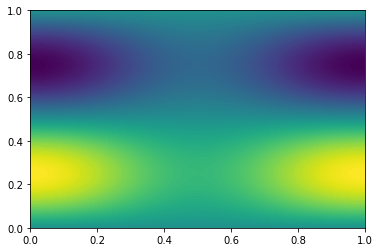

In [94]:
plt.contourf(xmesh, ymesh, out3[0,:,:], levels=128)

In [95]:
x_train3, x_test3, y_train3, y_test3, t_train, t_test = train_test_split(sensor3, out3, t.reshape((41, 1)), test_size=0.18, random_state=42)

In [96]:
x_test3

array([[[ 1.19533543],
        [ 0.61432027],
        [ 0.65355792],
        [ 1.25882328],
        [ 0.66126769],
        [ 0.33984615],
        [ 0.36155269],
        [ 0.6963896 ],
        [-0.78664952],
        [-0.4042838 ],
        [-0.43010607],
        [-0.82843084],
        [-1.14744383],
        [-0.58970728],
        [-0.62737286],
        [-1.20838802]],

       [[ 1.57369576],
        [ 0.80877148],
        [ 0.86042905],
        [ 1.65727946],
        [ 0.8705792 ],
        [ 0.44741788],
        [ 0.4759952 ],
        [ 0.91681827],
        [-1.03564822],
        [-0.53225202],
        [-0.56624783],
        [-1.09065461],
        [-1.510645  ],
        [-0.77636772],
        [-0.82595561],
        [-1.59087989]],

       [[ 1.78323092],
        [ 0.91645815],
        [ 0.97499384],
        [ 1.87794366],
        [ 0.98649548],
        [ 0.50699088],
        [ 0.53937323],
        [ 1.03889121],
        [-1.17354318],
        [-0.60312055],
        [-0.64164286],
       

In [97]:
sensor_pred3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
                     loss = tf.keras.losses.MeanSquaredError(),
                     metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [98]:
start3 = datetime.datetime.now()
history3 = sensor_pred3.fit(t_train, x_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 14ms/step - loss: 3.9216 - rmse: 1.9803
Epoch 2/10000
2/2 [==============================] - 0s 29ms/step - loss: 3.8719 - rmse: 1.9677
Epoch 3/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.8293 - rmse: 1.9568
Epoch 4/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.7954 - rmse: 1.9482
Epoch 5/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.7664 - rmse: 1.9407
Epoch 6/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.7399 - rmse: 1.9339
Epoch 7/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.7156 - rmse: 1.9276
Epoch 8/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6921 - rmse: 1.9215
Epoch 9/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6678 - rmse: 1.9151
Epoch 10/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.6418 - rmse: 1.9083
Epoch 11/10000
2/2 [=====================

2/2 [==============================] - 0s 11ms/step - loss: 2.5888 - rmse: 1.6090
Epoch 86/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5762 - rmse: 1.6050
Epoch 87/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5671 - rmse: 1.6022
Epoch 88/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.5528 - rmse: 1.5977
Epoch 89/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5421 - rmse: 1.5944
Epoch 90/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5314 - rmse: 1.5910
Epoch 91/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.5248 - rmse: 1.5889
Epoch 92/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5100 - rmse: 1.5843
Epoch 93/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5049 - rmse: 1.5827
Epoch 94/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4899 - rmse: 1.5779
Epoch 95/10000
2/2 [=========================

2/2 [==============================] - 0s 13ms/step - loss: 1.8168 - rmse: 1.3479
Epoch 169/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8112 - rmse: 1.3458
Epoch 170/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8018 - rmse: 1.3423
Epoch 171/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7939 - rmse: 1.3393
Epoch 172/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7824 - rmse: 1.3350
Epoch 173/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7744 - rmse: 1.3320
Epoch 174/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7687 - rmse: 1.3299
Epoch 175/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.7628 - rmse: 1.3277
Epoch 176/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7567 - rmse: 1.3254
Epoch 177/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.7449 - rmse: 1.3209
Epoch 178/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 1.2486 - rmse: 1.1174
Epoch 252/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2424 - rmse: 1.1146
Epoch 253/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2348 - rmse: 1.1112
Epoch 254/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2295 - rmse: 1.1088
Epoch 255/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2282 - rmse: 1.1082
Epoch 256/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2173 - rmse: 1.1033
Epoch 257/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2103 - rmse: 1.1001
Epoch 258/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2085 - rmse: 1.0993
Epoch 259/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2046 - rmse: 1.0975
Epoch 260/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.1945 - rmse: 1.0929
Epoch 261/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.8332 - rmse: 0.9128
Epoch 335/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8314 - rmse: 0.9118
Epoch 336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8262 - rmse: 0.9089
Epoch 337/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8201 - rmse: 0.9055
Epoch 338/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.8146 - rmse: 0.9025
Epoch 339/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.8074 - rmse: 0.8985
Epoch 340/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8036 - rmse: 0.8964
Epoch 341/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.8008 - rmse: 0.8948
Epoch 342/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.7982 - rmse: 0.8934
Epoch 343/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.7909 - rmse: 0.8893
Epoch 344/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.5157 - rmse: 0.7181
Epoch 418/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5114 - rmse: 0.7151
Epoch 419/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5140 - rmse: 0.7169
Epoch 420/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.5118 - rmse: 0.7154
Epoch 421/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.5061 - rmse: 0.7114
Epoch 422/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.5010 - rmse: 0.7078
Epoch 423/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4977 - rmse: 0.7054
Epoch 424/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.4943 - rmse: 0.7030
Epoch 425/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.4989 - rmse: 0.7063
Epoch 426/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.4879 - rmse: 0.6985
Epoch 427/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.2989 - rmse: 0.5467
Epoch 501/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.2969 - rmse: 0.5449
Epoch 502/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.2957 - rmse: 0.5437
Epoch 503/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.2938 - rmse: 0.5420
Epoch 504/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2921 - rmse: 0.5404
Epoch 505/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2912 - rmse: 0.5396
Epoch 506/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2877 - rmse: 0.5363
Epoch 507/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2848 - rmse: 0.5336
Epoch 508/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2855 - rmse: 0.5342
Epoch 509/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.2823 - rmse: 0.5313
Epoch 510/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.1638 - rmse: 0.4046
Epoch 584/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1654 - rmse: 0.4066
Epoch 585/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.1624 - rmse: 0.4030
Epoch 586/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.1623 - rmse: 0.4028
Epoch 587/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1607 - rmse: 0.4008
Epoch 588/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1577 - rmse: 0.3971
Epoch 589/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1595 - rmse: 0.3993
Epoch 590/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1565 - rmse: 0.3955
Epoch 591/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.1564 - rmse: 0.3954
Epoch 592/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.1542 - rmse: 0.3927
Epoch 593/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.0843 - rmse: 0.2903
Epoch 667/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0819 - rmse: 0.2861
Epoch 668/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0814 - rmse: 0.2852
Epoch 669/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0818 - rmse: 0.2860
Epoch 670/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0799 - rmse: 0.2826
Epoch 671/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0807 - rmse: 0.2841
Epoch 672/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0789 - rmse: 0.2807
Epoch 673/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0843 - rmse: 0.2903
Epoch 674/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0773 - rmse: 0.2780
Epoch 675/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0765 - rmse: 0.2766
Epoch 676/10000
2/2 [===============

2/2 [==============================] - 0s 14ms/step - loss: 0.0402 - rmse: 0.2004
Epoch 750/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0412 - rmse: 0.2029
Epoch 751/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0456 - rmse: 0.2134
Epoch 752/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0373 - rmse: 0.1930
Epoch 753/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0366 - rmse: 0.1912
Epoch 754/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0393 - rmse: 0.1982
Epoch 755/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0364 - rmse: 0.1907
Epoch 756/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0389 - rmse: 0.1970
Epoch 757/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0404 - rmse: 0.2010
Epoch 758/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0355 - rmse: 0.1883
Epoch 759/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0192 - rmse: 0.1385
Epoch 833/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0168 - rmse: 0.1296
Epoch 834/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0241 - rmse: 0.1552
Epoch 835/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0171 - rmse: 0.1305
Epoch 836/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0205 - rmse: 0.1430
Epoch 837/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0196 - rmse: 0.1400
Epoch 838/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0161 - rmse: 0.1267
Epoch 839/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0160 - rmse: 0.1261
Epoch 840/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0191 - rmse: 0.1382
Epoch 841/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0183 - rmse: 0.1350
Epoch 842/10000
2/2 [===============

2/2 [==============================] - 0s 15ms/step - loss: 0.0093 - rmse: 0.0960
Epoch 916/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 917/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0113 - rmse: 0.1061
Epoch 918/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 919/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0129 - rmse: 0.1136
Epoch 920/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 921/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0093 - rmse: 0.0965
Epoch 922/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0101 - rmse: 0.1001
Epoch 923/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 924/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 925/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 999/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0091 - rmse: 0.0950
Epoch 1000/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 1001/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 1002/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 1003/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0025 - rmse: 0.0497
Epoch 1004/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 1005/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0650
Epoch 1006/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0052 - rmse: 0.0718
Epoch 1007/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 1008/10000
2/2 [======

2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 1081/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 1082/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 1083/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3794e-04 - rmse: 0.0299
Epoch 1084/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 1085/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0074 - rmse: 0.0857
Epoch 1086/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 1087/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 1088/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 1089/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0097 - rmse: 0.0985
Epoch 1090/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 1163/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 1164/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.2407e-04 - rmse: 0.0242
Epoch 1165/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.1298e-04 - rmse: 0.0239
Epoch 1166/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 1167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 1168/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0091 - rmse: 0.0950
Epoch 1169/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0079 - rmse: 0.0885
Epoch 1170/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 1171/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 1172/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 4.2710e-04 - rmse: 0.0197
Epoch 1244/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0327
Epoch 1245/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 1246/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 1247/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0658
Epoch 1248/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0352
Epoch 1249/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 1250/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 1251/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.0407e-04 - rmse: 0.0216
Epoch 1252/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.1534e-04 - rmse: 0.0133
Epoch 1253/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 1326/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 1327/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 1328/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2832e-04 - rmse: 0.0222
Epoch 1329/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 1330/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6863e-04 - rmse: 0.0182
Epoch 1331/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6710e-04 - rmse: 0.0182
Epoch 1332/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 1333/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0394
Epoch 1334/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.8339e-04 - rmse: 0.0186
Epoch 1335/

2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 1407/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.6673e-04 - rmse: 0.0114
Epoch 1408/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 1409/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2671e-04 - rmse: 0.0138
Epoch 1410/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 1411/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 1412/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 1413/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 1414/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 1415/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 1416/10000
2/

Epoch 1488/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 1489/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 1490/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.4698e-04 - rmse: 0.0302
Epoch 1491/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0427
Epoch 1492/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0059 - rmse: 0.0763
Epoch 1493/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 1494/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.4270e-04 - rmse: 0.0202
Epoch 1495/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0079 - rmse: 0.0889
Epoch 1496/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 1497/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.4877e-04 - rmse: 0.024

2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 1570/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 1571/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 1572/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 1573/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.0149e-04 - rmse: 0.0164
Epoch 1574/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0619
Epoch 1575/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.4112e-04 - rmse: 0.0202
Epoch 1576/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 1577/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 1578/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 1579/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 1651/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.0272e-04 - rmse: 0.0084
Epoch 1652/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3133e-04 - rmse: 0.0099
Epoch 1653/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 1654/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 1655/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 1656/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 1657/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 1658/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 1659/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.8436e-04 - rmse: 0.0213
Epoch 1660/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 1732/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.0620e-04 - rmse: 0.0086
Epoch 1733/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8009e-04 - rmse: 0.0122
Epoch 1734/10000
2/2 [==============================] - 0s 16ms/step - loss: 4.1192e-04 - rmse: 0.0195
Epoch 1735/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.2909e-04 - rmse: 0.0300
Epoch 1736/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 1737/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 1738/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 1739/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 1740/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0089 - rmse: 0.0941
Epoch 1741/

2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 1813/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 1814/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 1815/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 1816/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 1817/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 1818/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 1819/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0021 - rmse: 0.0450
Epoch 1820/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.7544e-04 - rmse: 0.0120
Epoch 1821/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3542e-04 - rmse: 0.0201
Epoch 1822/10000
2/

2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 1894/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.4756e-04 - rmse: 0.0178
Epoch 1895/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.9507e-04 - rmse: 0.0163
Epoch 1896/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 1897/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2094e-04 - rmse: 0.0198
Epoch 1898/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.3245e-04 - rmse: 0.0224
Epoch 1899/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.8706e-04 - rmse: 0.0236
Epoch 1900/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 1901/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 1902/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.6059e-04 - rmse: 0.0182
Epo

2/2 [==============================] - 0s 15ms/step - loss: 6.0122e-04 - rmse: 0.0239
Epoch 1975/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0893
Epoch 1976/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0501
Epoch 1977/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0492
Epoch 1978/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 1979/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0063 - rmse: 0.0794
Epoch 1980/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 1981/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 1982/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 1983/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.8932e-04 - rmse: 0.0257
Epoch 1984/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 2.1675e-04 - rmse: 0.0137
Epoch 2056/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 2057/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 2058/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 2059/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.8249e-05 - rmse: 0.0055
Epoch 2060/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 2061/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 2062/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.5478e-04 - rmse: 0.0151
Epoch 2063/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.3267e-04 - rmse: 0.0301
Epoch 2064/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 2065/

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 2137/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 2138/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2732e-04 - rmse: 0.0200
Epoch 2139/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 2140/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5534e-04 - rmse: 0.0151
Epoch 2141/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.7227e-04 - rmse: 0.0156
Epoch 2142/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 2143/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 2144/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 2145/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.3941e-04 - rmse: 0.0177
Epoch 2146/

2/2 [==============================] - 0s 12ms/step - loss: 2.6885e-04 - rmse: 0.0156
Epoch 2219/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0058 - rmse: 0.0760
Epoch 2220/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.1930e-04 - rmse: 0.0171
Epoch 2221/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3261e-04 - rmse: 0.0202
Epoch 2222/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 2223/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.3752e-04 - rmse: 0.0226
Epoch 2224/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.4481e-04 - rmse: 0.0228
Epoch 2225/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 2226/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 2227/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.7933e-04 - rmse: 0.0124
Epo

2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0482
Epoch 2300/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0342
Epoch 2301/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 2302/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.9155e-04 - rmse: 0.0191
Epoch 2303/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2304/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0065 - rmse: 0.0805
Epoch 2305/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.9273e-04 - rmse: 0.0129
Epoch 2306/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.0976e-04 - rmse: 0.0168
Epoch 2307/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3699e-04 - rmse: 0.0203
Epoch 2308/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.3278e-04 - rmse: 0.0266
Epoch 2

2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0810
Epoch 2381/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 2382/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 2383/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 2384/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2385/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 2386/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 2387/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2388/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 2389/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 2390/10000
2/2 [=====

2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 2463/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.5521e-05 - rmse: 0.0084
Epoch 2464/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.2229e-04 - rmse: 0.0099
Epoch 2465/10000
2/2 [==============================] - 0s 17ms/step - loss: 5.2057e-05 - rmse: 0.0052
Epoch 2466/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0066 - rmse: 0.0813
Epoch 2467/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0086 - rmse: 0.0928
Epoch 2468/10000
2/2 [==============================] - 0s 17ms/step - loss: 6.2822e-04 - rmse: 0.0246
Epoch 2469/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 2470/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2171e-04 - rmse: 0.0140
Epoch 2471/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0076 - rmse: 0.0873
Epoch 2

Epoch 2544/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0048 - rmse: 0.0693
Epoch 2545/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8902e-04 - rmse: 0.0258
Epoch 2546/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 2547/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0062 - rmse: 0.0784
Epoch 2548/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 2549/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 2550/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 2551/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2552/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.7463e-04 - rmse: 0.0308
Epoch 2553/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 2554/1

Epoch 2626/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0877
Epoch 2627/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 2628/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 2629/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.8890e-05 - rmse: 0.0075
Epoch 2630/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 2631/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 2632/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 2633/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 2634/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.6612e-05 - rmse: 0.0058
Epoch 2635/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0394
Ep

2/2 [==============================] - 0s 16ms/step - loss: 5.8340e-04 - rmse: 0.0237
Epoch 2708/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 2709/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 2710/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 2711/10000
2/2 [==============================] - 0s 16ms/step - loss: 4.6581e-04 - rmse: 0.0211
Epoch 2712/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 2713/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 2714/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 2715/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0339
Epoch 2716/10000
2/2 [==============================] - 0s 16ms/step - loss: 5.0656e-04 - rmse: 0.0220
Epoch 2717/1000

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 2789/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1069e-04 - rmse: 0.0221
Epoch 2790/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 2791/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 2792/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0057 - rmse: 0.0753
Epoch 2793/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 2794/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.2483e-04 - rmse: 0.0224
Epoch 2795/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.2524e-04 - rmse: 0.0301
Epoch 2796/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.2475e-04 - rmse: 0.0142
Epoch 2797/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 2798/

2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0484
Epoch 2871/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 2872/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 2873/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 2874/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0096 - rmse: 0.0979
Epoch 2875/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 2876/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 2877/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 2878/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0097 - rmse: 0.0982
Epoch 2879/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2880/10000
2/2 [=====

2/2 [==============================] - 0s 14ms/step - loss: 4.4334e-04 - rmse: 0.0205
Epoch 2953/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 2954/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 2955/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 2956/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 2957/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 2958/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 2959/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7157e-04 - rmse: 0.0187
Epoch 2960/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2961/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2962/10000
2/

2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 3034/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 3035/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8789e-04 - rmse: 0.0311
Epoch 3036/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 3037/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 3038/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 3039/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 3040/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 3041/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 3042/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0337
Epoch 3043/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 3116/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0455
Epoch 3117/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0041 - rmse: 0.0643
Epoch 3118/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 3119/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.4795e-04 - rmse: 0.0305
Epoch 3120/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0058 - rmse: 0.0764
Epoch 3121/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 3122/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 3123/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 3124/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 3125/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 3198/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 3199/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 3200/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.2157e-04 - rmse: 0.0224
Epoch 3201/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0079 - rmse: 0.0888
Epoch 3202/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0533
Epoch 3203/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 3204/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 3205/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 3206/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 3207/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 3279/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0551
Epoch 3280/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.5648e-04 - rmse: 0.0209
Epoch 3281/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.9402e-04 - rmse: 0.0312
Epoch 3282/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 3283/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 3284/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.9291e-04 - rmse: 0.0132
Epoch 3285/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 3286/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 3287/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 3288/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0870
Epoch 3360/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.4643e-04 - rmse: 0.0151
Epoch 3361/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 3362/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0067 - rmse: 0.0820
Epoch 3363/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 3364/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 3365/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.4636e-04 - rmse: 0.0230
Epoch 3366/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.1765e-04 - rmse: 0.0264
Epoch 3367/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 3368/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0016 - rmse: 0.0397
Epoch 3369/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 3441/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 3442/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 3443/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0440
Epoch 3444/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 3445/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 3446/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0816
Epoch 3447/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3448/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 3449/10000
2/2 [==============================] - 0s 18ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 3450/10000
2/2 [=====

2/2 [==============================] - 0s 11ms/step - loss: 5.4575e-05 - rmse: 0.0060
Epoch 3522/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.5788e-04 - rmse: 0.0272
Epoch 3523/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 3524/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 3525/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 3526/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.8768e-04 - rmse: 0.0164
Epoch 3527/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0057 - rmse: 0.0753
Epoch 3528/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 3529/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.8624e-04 - rmse: 0.0311
Epoch 3530/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 3531/

2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 3603/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2045e-04 - rmse: 0.0101
Epoch 3604/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 3605/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0087 - rmse: 0.0934
Epoch 3606/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 3607/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 3608/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1220e-04 - rmse: 0.0198
Epoch 3609/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0067 - rmse: 0.0819
Epoch 3610/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.0966e-04 - rmse: 0.0138
Epoch 3611/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3612/1000

2/2 [==============================] - 0s 16ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 3684/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 3685/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.8044e-04 - rmse: 0.0127
Epoch 3686/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 3687/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 3688/10000
2/2 [==============================] - 0s 16ms/step - loss: 9.6398e-05 - rmse: 0.0089
Epoch 3689/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 3690/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0075 - rmse: 0.0867
Epoch 3691/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0086 - rmse: 0.0928
Epoch 3692/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 3693/10000
2/

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 3766/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 3767/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0022 - rmse: 0.0466
Epoch 3768/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0053 - rmse: 0.0724
Epoch 3769/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 3770/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0049 - rmse: 0.0695
Epoch 3771/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 3772/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0637
Epoch 3773/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0064 - rmse: 0.0799
Epoch 3774/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.7994e-04 - rmse: 0.0294
Epoch 3775/10000
2/2 [=========

2/2 [==============================] - 0s 11ms/step - loss: 5.6149e-04 - rmse: 0.0233
Epoch 3848/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 3849/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.0392e-04 - rmse: 0.0197
Epoch 3850/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 3851/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.5295e-04 - rmse: 0.0252
Epoch 3852/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 3853/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.5269e-04 - rmse: 0.0231
Epoch 3854/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 3855/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.1921e-04 - rmse: 0.0300
Epoch 3856/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 3

2/2 [==============================] - 0s 9ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 3929/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.6329e-04 - rmse: 0.0211
Epoch 3930/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.6866e-05 - rmse: 0.0077
Epoch 3931/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 3932/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 3933/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 3934/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.0710e-04 - rmse: 0.0170
Epoch 3935/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 3936/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 3937/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3938/10000
2

2/2 [==============================] - 0s 12ms/step - loss: 1.0506e-04 - rmse: 0.0094
Epoch 4010/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0056 - rmse: 0.0746
Epoch 4011/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 4012/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9147e-04 - rmse: 0.0312
Epoch 4013/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.7656e-04 - rmse: 0.0161
Epoch 4014/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 4015/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0055 - rmse: 0.0742
Epoch 4016/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.8125e-04 - rmse: 0.0258
Epoch 4017/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 4018/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 4019/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 4092/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 4093/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 4094/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.2009e-04 - rmse: 0.0102
Epoch 4095/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 4096/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 4097/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0372
Epoch 4098/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 4099/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 4100/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 4101/10000
2/2 [=

2/2 [==============================] - 0s 11ms/step - loss: 3.0353e-04 - rmse: 0.0169
Epoch 4174/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 4175/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 4176/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 4177/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 4178/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.6838e-04 - rmse: 0.0159
Epoch 4179/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 4180/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.1793e-04 - rmse: 0.0142
Epoch 4181/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.3721e-04 - rmse: 0.0179
Epoch 4182/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0088 - rmse: 0.0935
Epoch 4183/

2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0807
Epoch 4255/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.6132e-05 - rmse: 0.0089
Epoch 4256/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1707e-04 - rmse: 0.0100
Epoch 4257/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 4258/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 4259/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 4260/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 4261/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.9289e-04 - rmse: 0.0133
Epoch 4262/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3810e-04 - rmse: 0.0110
Epoch 4263/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0933
Epoch 4264/

2/2 [==============================] - 0s 12ms/step - loss: 4.4406e-04 - rmse: 0.0207
Epoch 4336/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 4337/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 4338/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.6934e-04 - rmse: 0.0159
Epoch 4339/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 4340/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 4341/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.8565e-04 - rmse: 0.0311
Epoch 4342/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 4343/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 4344/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 4345/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4417/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 4418/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.0613e-04 - rmse: 0.0198
Epoch 4419/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4420/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.2811e-04 - rmse: 0.0247
Epoch 4421/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0947
Epoch 4422/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0662
Epoch 4423/10000
2/2 [==============================] - 0s 17ms/step - loss: 8.1916e-04 - rmse: 0.0283
Epoch 4424/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 4425/10000
2/2 [==============================] - 0s 17ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 4426/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0409
Epoch 4499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 4500/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.8855e-04 - rmse: 0.0239
Epoch 4501/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 4502/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 4503/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3480e-04 - rmse: 0.0228
Epoch 4504/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 4505/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 4506/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0587
Epoch 4507/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.9661e-04 - rmse: 0.0134
Epoch 4508/10000


2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 4581/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 4582/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.9932e-04 - rmse: 0.0135
Epoch 4583/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 4584/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.4999e-04 - rmse: 0.0271
Epoch 4585/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 4586/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 4587/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 4588/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 4589/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 4590/10000
2/2 [

2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 4663/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.3619e-04 - rmse: 0.0148
Epoch 4664/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 4665/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 4666/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0665
Epoch 4667/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 4668/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 4669/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.1786e-04 - rmse: 0.0174
Epoch 4670/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 4671/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0086 - rmse: 0.0929
Epoch 4672/10000
2/2

2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0495
Epoch 4744/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 4745/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 4746/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.6168e-04 - rmse: 0.0254
Epoch 4747/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 4748/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 4749/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0034 - rmse: 0.0578
Epoch 4750/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 4751/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.2606e-04 - rmse: 0.0226
Epoch 4752/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 4753/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 4.3777e-04 - rmse: 0.0205
Epoch 4826/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0069 - rmse: 0.0827
Epoch 4827/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 4828/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 4829/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.5943e-04 - rmse: 0.0254
Epoch 4830/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 4831/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 4832/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 4833/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 4834/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 4835/10000
2/2 

2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 4908/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.8810e-05 - rmse: 0.0073
Epoch 4909/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 4910/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 4911/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 4912/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 4913/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 4914/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 4915/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0077 - rmse: 0.0878
Epoch 4916/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 4917/10000
2/2 [==

Epoch 4989/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 4990/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 4991/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 4992/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 4993/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 4994/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.1099e-04 - rmse: 0.0199
Epoch 4995/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0402
Epoch 4996/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4997/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.0635e-04 - rmse: 0.0263
Epoch 4998/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0515
Ep

2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 5071/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.2129e-04 - rmse: 0.0301
Epoch 5072/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.3245e-04 - rmse: 0.0248
Epoch 5073/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.0621e-04 - rmse: 0.0198
Epoch 5074/10000
2/2 [==============================] - 0s 10ms/step - loss: 4.1509e-04 - rmse: 0.0200
Epoch 5075/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.6494e-04 - rmse: 0.0158
Epoch 5076/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.9704e-04 - rmse: 0.0195
Epoch 5077/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0058 - rmse: 0.0758
Epoch 5078/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0483
Epoch 5079/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0531
Epo

Epoch 5152/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.5849e-04 - rmse: 0.0185
Epoch 5153/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 5154/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.0598e-04 - rmse: 0.0299
Epoch 5155/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0586
Epoch 5156/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.5354e-04 - rmse: 0.0155
Epoch 5157/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 5158/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0526
Epoch 5159/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 5160/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 5161/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0015 - rmse: 0.038

2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0750
Epoch 5234/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 5235/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 5236/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.3252e-04 - rmse: 0.0228
Epoch 5237/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 5238/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 5239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 5240/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0485
Epoch 5241/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0603
Epoch 5242/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 5243/10000
2/2 [====

2/2 [==============================] - 0s 15ms/step - loss: 0.0090 - rmse: 0.0948
Epoch 5316/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 5317/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 5318/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0078 - rmse: 0.0881
Epoch 5319/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 5320/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5321/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.2901e-04 - rmse: 0.0204
Epoch 5322/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.8160e-04 - rmse: 0.0163
Epoch 5323/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 5324/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 5325/10000
2/

2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 5397/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 5398/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 5399/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3154e-04 - rmse: 0.0286
Epoch 5400/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 5401/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.5386e-04 - rmse: 0.0118
Epoch 5402/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0936
Epoch 5403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 5404/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.0218e-04 - rmse: 0.0137
Epoch 5405/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0528
Epoch 5406/10000
2

2/2 [==============================] - 0s 12ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 5479/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.2429e-04 - rmse: 0.0302
Epoch 5480/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 5481/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5482/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 5483/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.9027e-04 - rmse: 0.0240
Epoch 5484/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 5485/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 5486/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0068 - rmse: 0.0825
Epoch 5487/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 5488/10000
2/2 [=

2/2 [==============================] - 0s 12ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 5560/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 5561/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0598
Epoch 5562/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 5563/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.4717e-05 - rmse: 0.0055
Epoch 5564/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 5565/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 5566/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.1657e-04 - rmse: 0.0142
Epoch 5567/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 5568/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.1110e-04 - rmse: 0.0282
Epoch 5569/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 5642/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 5643/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9034e-04 - rmse: 0.0240
Epoch 5644/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 5645/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0038 - rmse: 0.0611
Epoch 5646/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 5647/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.0322e-04 - rmse: 0.0137
Epoch 5648/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.1271e-04 - rmse: 0.0200
Epoch 5649/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 5650/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0077 - rmse: 0.0875
Epoch 5651/1000

2/2 [==============================] - 0s 13ms/step - loss: 1.8402e-04 - rmse: 0.0130
Epoch 5723/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5724/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.4645e-04 - rmse: 0.0208
Epoch 5725/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.5650e-04 - rmse: 0.0290
Epoch 5726/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 5727/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 5728/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 5729/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 5730/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 5731/10000
2/2 [==============================] - 0s 14ms/step - loss: 4.0294e-04 - rmse: 0.0197
Epoch 5732/

2/2 [==============================] - 0s 14ms/step - loss: 0.0035 - rmse: 0.0586
Epoch 5804/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 5805/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0582
Epoch 5806/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.4819e-04 - rmse: 0.0252
Epoch 5807/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.8215e-04 - rmse: 0.0311
Epoch 5808/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 5809/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 5810/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.9650e-04 - rmse: 0.0261
Epoch 5811/10000
2/2 [==============================] - 0s 12ms/step - loss: 6.6271e-04 - rmse: 0.0255
Epoch 5812/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 5813/

2/2 [==============================] - 0s 12ms/step - loss: 7.4120e-04 - rmse: 0.0270
Epoch 5886/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3061e-04 - rmse: 0.0303
Epoch 5887/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.7443e-04 - rmse: 0.0257
Epoch 5888/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 5889/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 5890/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5891/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9265e-04 - rmse: 0.0241
Epoch 5892/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.8906e-04 - rmse: 0.0240
Epoch 5893/10000
2/2 [==============================] - 0s 12ms/step - loss: 5.6172e-04 - rmse: 0.0234
Epoch 5894/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0668
Epo

2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 5967/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.0308e-04 - rmse: 0.0170
Epoch 5968/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 5969/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 5970/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 5971/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 5972/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0031 - rmse: 0.0559
Epoch 5973/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8587e-04 - rmse: 0.0131
Epoch 5974/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 5975/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0500
Epoch 5976/10000
2/

Epoch 6048/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 6049/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 6050/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 6051/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 6052/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 6053/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0091 - rmse: 0.0952
Epoch 6054/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6185e-04 - rmse: 0.0255
Epoch 6055/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 6056/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.1594e-04 - rmse: 0.0200
Epoch 6057/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0407
Ep

2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 6130/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 6131/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 6132/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 6133/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0544
Epoch 6134/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6135/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.0570e-05 - rmse: 0.0026
Epoch 6136/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.4410e-05 - rmse: 0.0084
Epoch 6137/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 6138/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.3021e-04 - rmse: 0.0147
Epoch 6139/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 6211/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.1272e-04 - rmse: 0.0099
Epoch 6212/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6213/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 6214/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2697e-04 - rmse: 0.0267
Epoch 6215/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 6216/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6217/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3911e-05 - rmse: 0.0078
Epoch 6218/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0401
Epoch 6219/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0057 - rmse: 0.0751
Epoch 6220/1000

2/2 [==============================] - 0s 12ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 6292/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0026 - rmse: 0.0511
Epoch 6293/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6294/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 6295/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 6296/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 6297/10000
2/2 [==============================] - 0s 10ms/step - loss: 6.8971e-04 - rmse: 0.0260
Epoch 6298/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 6299/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 6300/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0079 - rmse: 0.0887
Epoch 6301/10000
2/2 [==

2/2 [==============================] - 0s 13ms/step - loss: 4.9528e-04 - rmse: 0.0219
Epoch 6374/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0089 - rmse: 0.0944
Epoch 6375/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 6376/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6377/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 6378/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 6379/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 6380/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 6381/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0743
Epoch 6382/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2315e-04 - rmse: 0.0105
Epoch 6383/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 6455/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 6456/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6457/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 6458/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 6459/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 6460/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.8072e-04 - rmse: 0.0129
Epoch 6461/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 6462/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0086 - rmse: 0.0929
Epoch 6463/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0056 - rmse: 0.0745
Epoch 6464/10000
2/2 [===

2/2 [==============================] - 0s 15ms/step - loss: 6.1345e-04 - rmse: 0.0245
Epoch 6536/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.0863e-04 - rmse: 0.0264
Epoch 6537/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 6538/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 6539/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.2992e-04 - rmse: 0.0248
Epoch 6540/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 6541/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 6542/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 6543/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.9006e-04 - rmse: 0.0260
Epoch 6544/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0563
Epoch 6545/

2/2 [==============================] - 0s 12ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 6617/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.7058e-04 - rmse: 0.0309
Epoch 6618/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 6619/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0017 - rmse: 0.0413
Epoch 6620/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 6621/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.3157e-04 - rmse: 0.0303
Epoch 6622/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0429
Epoch 6623/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6624/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.6492e-05 - rmse: 0.0086
Epoch 6625/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6626/1000

2/2 [==============================] - 0s 15ms/step - loss: 2.4669e-04 - rmse: 0.0153
Epoch 6698/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0371
Epoch 6699/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.8953e-04 - rmse: 0.0133
Epoch 6700/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0322
Epoch 6701/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.4204e-04 - rmse: 0.0151
Epoch 6702/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 6703/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.3128e-05 - rmse: 0.0077
Epoch 6704/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.7094e-04 - rmse: 0.0214
Epoch 6705/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 6706/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 6

2/2 [==============================] - 0s 12ms/step - loss: 8.3441e-04 - rmse: 0.0287
Epoch 6780/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 6781/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0336
Epoch 6782/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 6783/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.8241e-04 - rmse: 0.0311
Epoch 6784/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6785/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 6786/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6218e-04 - rmse: 0.0255
Epoch 6787/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.9693e-04 - rmse: 0.0220
Epoch 6788/10000
2/2 [==============================] - 0s 16ms/step - loss: 4.7676e-04 - rmse: 0.0215
Epoch 6

2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 6862/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 6863/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 6864/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0014 - rmse: 0.0370
Epoch 6865/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.0754e-04 - rmse: 0.0172
Epoch 6866/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 6867/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.1382e-04 - rmse: 0.0142
Epoch 6868/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 6869/10000
2/2 [==============================] - 0s 12ms/step - loss: 2.3924e-04 - rmse: 0.0150
Epoch 6870/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 6871/1000

2/2 [==============================] - 0s 12ms/step - loss: 9.3911e-05 - rmse: 0.0090
Epoch 6944/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.1796e-04 - rmse: 0.0301
Epoch 6945/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 6946/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 6947/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0075 - rmse: 0.0866
Epoch 6948/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0075 - rmse: 0.0865
Epoch 6949/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 6950/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 6951/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 6952/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 6953/10000
2/

2/2 [==============================] - 0s 11ms/step - loss: 0.0028 - rmse: 0.0527
Epoch 7025/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2489e-04 - rmse: 0.0106
Epoch 7026/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.2234e-04 - rmse: 0.0145
Epoch 7027/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4354e-04 - rmse: 0.0230
Epoch 7028/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0608
Epoch 7029/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7030/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.8426e-04 - rmse: 0.0217
Epoch 7031/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 7032/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 7033/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 7034/

2/2 [==============================] - 0s 14ms/step - loss: 9.4431e-04 - rmse: 0.0305
Epoch 7106/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.5359e-05 - rmse: 0.0091
Epoch 7107/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 7108/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.1143e-04 - rmse: 0.0173
Epoch 7109/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 7110/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7111/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.8739e-04 - rmse: 0.0166
Epoch 7112/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0318
Epoch 7113/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.7516e-05 - rmse: 0.0092
Epoch 7114/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0087 - rmse: 0.0931
Epoch 7

2/2 [==============================] - 0s 11ms/step - loss: 0.0077 - rmse: 0.0876
Epoch 7187/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 7188/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 7189/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 7190/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7213e-04 - rmse: 0.0189
Epoch 7191/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 7192/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 7193/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 7194/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7682e-04 - rmse: 0.0191
Epoch 7195/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.2671e-04 - rmse: 0.0227
Epoch 7196/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 7269/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 7270/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0088 - rmse: 0.0936
Epoch 7271/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7272/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0028 - rmse: 0.0529
Epoch 7273/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3629e-04 - rmse: 0.0287
Epoch 7274/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.8588e-04 - rmse: 0.0278
Epoch 7275/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0550
Epoch 7276/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7277/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.4917e-04 - rmse: 0.0183
Epoch 7278/10000

2/2 [==============================] - 0s 11ms/step - loss: 9.9398e-04 - rmse: 0.0313
Epoch 7350/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.0905e-04 - rmse: 0.0199
Epoch 7351/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 7352/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0056 - rmse: 0.0751
Epoch 7353/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 7354/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 7355/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 7356/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7451e-04 - rmse: 0.0162
Epoch 7357/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.2409e-04 - rmse: 0.0176
Epoch 7358/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0025 - rmse: 0.0503
Epoch 7359/

2/2 [==============================] - 0s 12ms/step - loss: 9.9320e-04 - rmse: 0.0313
Epoch 7431/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 7432/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 7433/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 7434/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.8790e-05 - rmse: 0.0087
Epoch 7435/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7436/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 7437/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.0620e-04 - rmse: 0.0171
Epoch 7438/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7439/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7440/1000

2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7513/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 7514/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.5092e-04 - rmse: 0.0306
Epoch 7515/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 7516/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 7517/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 7518/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.2396e-05 - rmse: 0.0063
Epoch 7519/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 7520/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 7521/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.1402e-04 - rmse: 0.0200
Epoch 7522/10000
2/

2/2 [==============================] - 0s 14ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 7595/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 7596/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 7597/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.7583e-05 - rmse: 0.0050
Epoch 7598/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0010 - rmse: 0.0320
Epoch 7599/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 7600/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0013 - rmse: 0.0365
Epoch 7601/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 7602/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 7603/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0012 - rmse: 0.0340
Epoch 7604/10000
2/2 [=

2/2 [==============================] - 0s 13ms/step - loss: 9.5048e-04 - rmse: 0.0306
Epoch 7676/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 7677/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 7678/10000
2/2 [==============================] - 0s 13ms/step - loss: 4.2602e-04 - rmse: 0.0203
Epoch 7679/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7680/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 7681/10000
2/2 [==============================] - 0s 13ms/step - loss: 7.0993e-04 - rmse: 0.0264
Epoch 7682/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.3547e-05 - rmse: 0.0046
Epoch 7683/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 7684/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.1188e-05 - rmse: 0.0062
Epoch 7

2/2 [==============================] - 0s 14ms/step - loss: 7.5534e-04 - rmse: 0.0273
Epoch 7758/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 7759/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 7760/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 7761/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 7762/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 7763/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 7764/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0091 - rmse: 0.0953
Epoch 7765/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.1746e-04 - rmse: 0.0266
Epoch 7766/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 7767/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 6.8218e-04 - rmse: 0.0259
Epoch 7840/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.6525e-04 - rmse: 0.0213
Epoch 7841/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 7842/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 7843/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 7844/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0010 - rmse: 0.0317
Epoch 7845/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 7846/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0068 - rmse: 0.0821
Epoch 7847/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0452
Epoch 7848/10000
2/2 [==============================] - 0s 12ms/step - loss: 8.9505e-04 - rmse: 0.0297
Epoch 7849/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 7921/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 7922/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0087 - rmse: 0.0935
Epoch 7923/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 7924/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 7925/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0335
Epoch 7926/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 7927/10000
2/2 [==============================] - 0s 17ms/step - loss: 9.1298e-04 - rmse: 0.0300
Epoch 7928/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 7929/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0076 - rmse: 0.0869
Epoch 7930/10000
2/2 [=

2/2 [==============================] - 0s 14ms/step - loss: 9.8911e-05 - rmse: 0.0093
Epoch 8003/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 8004/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8005/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 8006/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 8007/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 8008/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0088 - rmse: 0.0937
Epoch 8009/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 8010/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.4495e-04 - rmse: 0.0208
Epoch 8011/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.5741e-04 - rmse: 0.0291
Epoch 8012/1000

Epoch 8084/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.4868e-04 - rmse: 0.0306
Epoch 8085/10000
2/2 [==============================] - 0s 16ms/step - loss: 4.6490e-04 - rmse: 0.0213
Epoch 8086/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8087/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.2717e-04 - rmse: 0.0285
Epoch 8088/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8089/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8090/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 8091/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 8092/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 8093/10000
2/2 [==============================] - 0s 17ms/step - loss: 4.4042e-04 - rmse: 0

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0522
Epoch 8166/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.7477e-04 - rmse: 0.0127
Epoch 8167/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0065 - rmse: 0.0804
Epoch 8168/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7548e-04 - rmse: 0.0191
Epoch 8169/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0399
Epoch 8170/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1956e-04 - rmse: 0.0103
Epoch 8171/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 8172/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 8173/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0055 - rmse: 0.0744
Epoch 8174/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.7704e-04 - rmse: 0.0163
Epoch 8175/

2/2 [==============================] - 0s 15ms/step - loss: 5.8440e-04 - rmse: 0.0239
Epoch 8247/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.4678e-04 - rmse: 0.0231
Epoch 8248/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1711e-04 - rmse: 0.0102
Epoch 8249/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.2664e-04 - rmse: 0.0285
Epoch 8250/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0808
Epoch 8251/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5130e-04 - rmse: 0.0290
Epoch 8252/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.5727e-04 - rmse: 0.0120
Epoch 8253/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0572
Epoch 8254/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3094e-04 - rmse: 0.0204
Epoch 8255/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0429

2/2 [==============================] - 0s 13ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 8328/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 8329/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 8330/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8331/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 8332/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 8333/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0061 - rmse: 0.0782
Epoch 8334/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.9974e-04 - rmse: 0.0221
Epoch 8335/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.0260e-04 - rmse: 0.0263
Epoch 8336/10000
2/2 [==============================] - 0s 16ms/step - loss: 6.2710e-04 - rmse: 0.0248
Epoch 8337/1000

2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0471
Epoch 8410/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8411/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 8412/10000
2/2 [==============================] - 0s 12ms/step - loss: 1.8416e-04 - rmse: 0.0131
Epoch 8413/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0066 - rmse: 0.0811
Epoch 8414/10000
2/2 [==============================] - 0s 12ms/step - loss: 7.9978e-04 - rmse: 0.0281
Epoch 8415/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 8416/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0076 - rmse: 0.0872
Epoch 8417/10000
2/2 [==============================] - 0s 11ms/step - loss: 1.2725e-04 - rmse: 0.0107
Epoch 8418/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.1291e-04 - rmse: 0.0142
Epoch 8419/10

2/2 [==============================] - 0s 14ms/step - loss: 5.9561e-04 - rmse: 0.0242
Epoch 8492/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 8493/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 8494/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0021 - rmse: 0.0462
Epoch 8495/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.6798e-04 - rmse: 0.0256
Epoch 8496/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 8497/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.6301e-04 - rmse: 0.0292
Epoch 8498/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0046 - rmse: 0.0676
Epoch 8499/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0010 - rmse: 0.0315
Epoch 8500/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 8501/1000

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 8574/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8575/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0033 - rmse: 0.0576
Epoch 8576/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 8577/10000
2/2 [==============================] - 0s 12ms/step - loss: 3.4898e-04 - rmse: 0.0183
Epoch 8578/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 8579/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.1298e-04 - rmse: 0.0100
Epoch 8580/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3301e-04 - rmse: 0.0205
Epoch 8581/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.1393e-04 - rmse: 0.0101
Epoch 8582/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0749
Epoch 8583/

2/2 [==============================] - 0s 15ms/step - loss: 4.6904e-04 - rmse: 0.0214
Epoch 8656/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 8657/10000
2/2 [==============================] - 0s 13ms/step - loss: 5.2424e-04 - rmse: 0.0226
Epoch 8658/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.3720e-04 - rmse: 0.0229
Epoch 8659/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0077 - rmse: 0.0874
Epoch 8660/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.6259e-04 - rmse: 0.0123
Epoch 8661/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.2515e-04 - rmse: 0.0203
Epoch 8662/10000
2/2 [==============================] - 0s 13ms/step - loss: 8.3497e-04 - rmse: 0.0287
Epoch 8663/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 8664/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0011 - rmse: 0.0331
Epo

2/2 [==============================] - 0s 9ms/step - loss: 3.3794e-04 - rmse: 0.0180
Epoch 8737/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3998e-05 - rmse: 0.0056
Epoch 8738/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0010 - rmse: 0.0319
Epoch 8739/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8501e-04 - rmse: 0.0165
Epoch 8740/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 8741/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.8450e-04 - rmse: 0.0165
Epoch 8742/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 8743/10000
2/2 [==============================] - 0s 12ms/step - loss: 9.3262e-04 - rmse: 0.0303
Epoch 8744/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0417
Epoch 8745/10000
2/2 [==============================] - 0s 11ms/step - loss: 2.3563e-04 - rmse: 0.0149
Epoch 8

2/2 [==============================] - 0s 15ms/step - loss: 0.0026 - rmse: 0.0513
Epoch 8819/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 8820/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8821/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 8822/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 8823/10000
2/2 [==============================] - 0s 15ms/step - loss: 7.6913e-04 - rmse: 0.0275
Epoch 8824/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 8825/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 8826/10000
2/2 [==============================] - 0s 11ms/step - loss: 8.7375e-04 - rmse: 0.0294
Epoch 8827/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 8828/10000
2/

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 8901/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 8902/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.1167e-04 - rmse: 0.0173
Epoch 8903/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 8904/10000
2/2 [==============================] - 0s 17ms/step - loss: 4.6164e-04 - rmse: 0.0212
Epoch 8905/10000
2/2 [==============================] - 0s 17ms/step - loss: 3.7473e-04 - rmse: 0.0190
Epoch 8906/10000
2/2 [==============================] - 0s 15ms/step - loss: 6.3952e-05 - rmse: 0.0072
Epoch 8907/10000
2/2 [==============================] - 0s 16ms/step - loss: 8.0254e-04 - rmse: 0.0281
Epoch 8908/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 8909/10000
2/2 [==============================] - 0s 14ms/step - loss: 8.1719e-04 - rmse: 0.0284
Epo

Epoch 8982/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.9686e-04 - rmse: 0.0314
Epoch 8983/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.2510e-04 - rmse: 0.0267
Epoch 8984/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 8985/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0027 - rmse: 0.0520
Epoch 8986/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8987/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.7192e-05 - rmse: 0.0092
Epoch 8988/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 8989/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.8774e-04 - rmse: 0.0132
Epoch 8990/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 8991/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.06

2/2 [==============================] - 0s 10ms/step - loss: 8.2856e-04 - rmse: 0.0286
Epoch 9064/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.3629e-04 - rmse: 0.0287
Epoch 9065/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9066/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 9067/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9068/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0583
Epoch 9069/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.2245e-04 - rmse: 0.0176
Epoch 9070/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8320e-04 - rmse: 0.0165
Epoch 9071/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 9072/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 9073/100

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9146/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 9147/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 9148/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 9149/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0570
Epoch 9150/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 9151/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 9152/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 9153/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 9154/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 9155/10000
2/2 [==========

2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 9228/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 9229/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.0186e-04 - rmse: 0.0138
Epoch 9230/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0379
Epoch 9231/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 9232/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 9233/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0078 - rmse: 0.0883
Epoch 9234/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0057 - rmse: 0.0755
Epoch 9235/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.0870e-04 - rmse: 0.0264
Epoch 9236/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0568
Epoch 9237/10000
2/

Epoch 9309/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 9310/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.6235e-04 - rmse: 0.0274
Epoch 9311/10000
2/2 [==============================] - 0s 10ms/step - loss: 9.0688e-05 - rmse: 0.0089
Epoch 9312/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 9313/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 9314/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.2599e-05 - rmse: 0.0032
Epoch 9315/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9316/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0056 - rmse: 0.0751
Epoch 9317/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0065 - rmse: 0.0803
Epoch 9318/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4598e-04 - rmse: 0

2/2 [==============================] - 0s 15ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 9391/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 9392/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.3677e-04 - rmse: 0.0206
Epoch 9393/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.1500e-05 - rmse: 0.0077
Epoch 9394/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.0313e-04 - rmse: 0.0095
Epoch 9395/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0075 - rmse: 0.0868
Epoch 9396/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 9397/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.1017e-04 - rmse: 0.0173
Epoch 9398/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.3749e-04 - rmse: 0.0206
Epoch 9399/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.3608e-04 - rmse: 0.0180
Epo

2/2 [==============================] - 0s 11ms/step - loss: 3.7011e-04 - rmse: 0.0189
Epoch 9472/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.3933e-04 - rmse: 0.0181
Epoch 9473/10000
2/2 [==============================] - 0s 14ms/step - loss: 7.9723e-04 - rmse: 0.0280
Epoch 9474/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 9475/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0033 - rmse: 0.0577
Epoch 9476/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 9477/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 9478/10000
2/2 [==============================] - 0s 15ms/step - loss: 2.1540e-04 - rmse: 0.0143
Epoch 9479/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.2745e-05 - rmse: 0.0084
Epoch 9480/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 9

2/2 [==============================] - 0s 12ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 9554/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0090 - rmse: 0.0950
Epoch 9555/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0682
Epoch 9556/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 9557/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 9558/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 9559/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 9560/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 9561/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 9562/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 9563/10000
2/2 [=======

2/2 [==============================] - 0s 14ms/step - loss: 0.0073 - rmse: 0.0851
Epoch 9636/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0049 - rmse: 0.0698
Epoch 9637/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 9638/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 9639/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 9640/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 9641/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0033 - rmse: 0.0574
Epoch 9642/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 9643/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.3773e-04 - rmse: 0.0269
Epoch 9644/10000
2/2 [==============================] - 0s 14ms/step - loss: 5.9875e-04 - rmse: 0.0242
Epoch 9645/10000
2/

2/2 [==============================] - 0s 16ms/step - loss: 3.3896e-04 - rmse: 0.0181
Epoch 9718/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.2091e-04 - rmse: 0.0176
Epoch 9719/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9720/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.0576e-04 - rmse: 0.0171
Epoch 9721/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0524
Epoch 9722/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.3201e-04 - rmse: 0.0179
Epoch 9723/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0426
Epoch 9724/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.5306e-04 - rmse: 0.0119
Epoch 9725/10000
2/2 [==============================] - 0s 13ms/step - loss: 9.0751e-04 - rmse: 0.0299
Epoch 9726/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0011 - rmse: 0.0331
Epo

2/2 [==============================] - 0s 16ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 9799/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.5820e-04 - rmse: 0.0211
Epoch 9800/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0034 - rmse: 0.0580
Epoch 9801/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 9802/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9803/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 9804/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 9805/10000
2/2 [==============================] - 0s 15ms/step - loss: 9.1615e-04 - rmse: 0.0301
Epoch 9806/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 9807/10000
2/2 [==============================] - 0s 15ms/step - loss: 8.1217e-04 - rmse: 0.0283
Epoch 9808/1000

2/2 [==============================] - 0s 15ms/step - loss: 2.0521e-04 - rmse: 0.0139
Epoch 9880/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0014 - rmse: 0.0368
Epoch 9881/10000
2/2 [==============================] - 0s 14ms/step - loss: 6.8789e-05 - rmse: 0.0075
Epoch 9882/10000
2/2 [==============================] - 0s 15ms/step - loss: 1.2865e-04 - rmse: 0.0108
Epoch 9883/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.3264e-04 - rmse: 0.0110
Epoch 9884/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 9885/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0056 - rmse: 0.0748
Epoch 9886/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.4479e-04 - rmse: 0.0115
Epoch 9887/10000
2/2 [==============================] - 0s 15ms/step - loss: 3.5955e-04 - rmse: 0.0186
Epoch 9888/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0042 - rmse: 0.0650
Epo

2/2 [==============================] - 0s 14ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 9961/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.1600e-04 - rmse: 0.0143
Epoch 9962/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0087 - rmse: 0.0934
Epoch 9963/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0040 - rmse: 0.0629
Epoch 9964/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0022 - rmse: 0.0467
Epoch 9965/10000
2/2 [==============================] - 0s 15ms/step - loss: 4.1403e-04 - rmse: 0.0201
Epoch 9966/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 9967/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 9968/10000
2/2 [==============================] - 0s 14ms/step - loss: 2.9632e-05 - rmse: 0.0042
Epoch 9969/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 9970/1000

In [99]:
time3_sensor = end3 - start3
print("Training time (Case 3, sensor prediction):", time3_sensor)

Training time (Case 3, sensor prediction): 0:04:46.309494


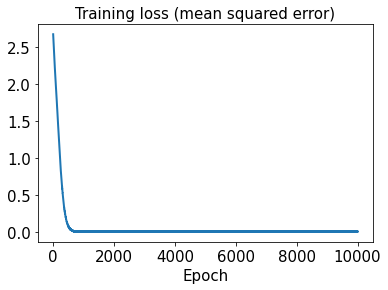

In [100]:
hist3 = history3.history
plt.plot(hist2['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

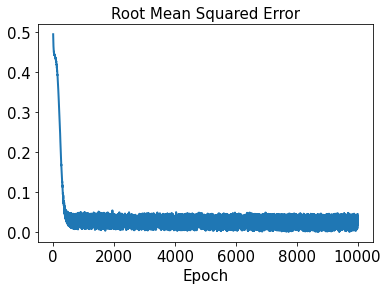

In [101]:
plt.plot(hist1['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [102]:
sd3.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-04),
            loss = tf.keras.losses.MeanSquaredError(),
            metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [103]:
start3 = datetime.datetime.now()
history3 = sd3.fit(x_train3, y_train3, epochs=10000, shuffle=True)
end3 = datetime.datetime.now()

Epoch 1/10000
2/2 [==============================] - 1s 11ms/step - loss: 3.8043 - rmse: 1.9505
Epoch 2/10000
2/2 [==============================] - 0s 18ms/step - loss: 3.7837 - rmse: 1.9452
Epoch 3/10000
2/2 [==============================] - 0s 16ms/step - loss: 3.7630 - rmse: 1.9398
Epoch 4/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7424 - rmse: 1.9345
Epoch 5/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7218 - rmse: 1.9292
Epoch 6/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7014 - rmse: 1.9239
Epoch 7/10000
2/2 [==============================] - 0s 14ms/step - loss: 3.6809 - rmse: 1.9186
Epoch 8/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.6606 - rmse: 1.9133
Epoch 9/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6403 - rmse: 1.9080
Epoch 10/10000
2/2 [==============================] - 0s 10ms/step - loss: 3.6201 - rmse: 1.9027
Epoch 11/10000
2/2 [===================

2/2 [==============================] - 0s 9ms/step - loss: 2.4115 - rmse: 1.5529
Epoch 87/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.4004 - rmse: 1.5493
Epoch 88/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3895 - rmse: 1.5458
Epoch 89/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3762 - rmse: 1.5415
Epoch 90/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3651 - rmse: 1.5379
Epoch 91/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3536 - rmse: 1.5341
Epoch 92/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3433 - rmse: 1.5307
Epoch 93/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3300 - rmse: 1.5264
Epoch 94/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.3188 - rmse: 1.5227
Epoch 95/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3073 - rmse: 1.5189
Epoch 96/10000
2/2 [==============================] - 0

2/2 [==============================] - 0s 9ms/step - loss: 1.6343 - rmse: 1.2783
Epoch 171/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6270 - rmse: 1.2754
Epoch 172/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6180 - rmse: 1.2719
Epoch 173/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6127 - rmse: 1.2698
Epoch 174/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.6058 - rmse: 1.2671
Epoch 175/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5972 - rmse: 1.2637
Epoch 176/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5907 - rmse: 1.2611
Epoch 177/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5892 - rmse: 1.2605
Epoch 178/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.5776 - rmse: 1.2559
Epoch 179/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.5720 - rmse: 1.2537
Epoch 180/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 1.1562 - rmse: 1.0751
Epoch 255/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1526 - rmse: 1.0734
Epoch 256/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1474 - rmse: 1.0710
Epoch 257/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1421 - rmse: 1.0685
Epoch 258/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1379 - rmse: 1.0666
Epoch 259/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1328 - rmse: 1.0642
Epoch 260/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1291 - rmse: 1.0624
Epoch 261/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1238 - rmse: 1.0599
Epoch 262/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1193 - rmse: 1.0578
Epoch 263/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.1150 - rmse: 1.0558
Epoch 264/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.8317 - rmse: 0.9118
Epoch 339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8319 - rmse: 0.9119
Epoch 340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8252 - rmse: 0.9082
Epoch 341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8287 - rmse: 0.9102
Epoch 342/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8254 - rmse: 0.9083
Epoch 343/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.8155 - rmse: 0.9028
Epoch 344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8120 - rmse: 0.9009
Epoch 345/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8088 - rmse: 0.8991
Epoch 346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8062 - rmse: 0.8977
Epoch 347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.8053 - rmse: 0.8972
Epoch 348/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.6054 - rmse: 0.7779
Epoch 423/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.6047 - rmse: 0.7774
Epoch 424/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.6022 - rmse: 0.7758
Epoch 425/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5983 - rmse: 0.7733
Epoch 426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5963 - rmse: 0.7720
Epoch 427/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5946 - rmse: 0.7709
Epoch 428/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.5925 - rmse: 0.7695
Epoch 429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5891 - rmse: 0.7673
Epoch 430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.5869 - rmse: 0.7659
Epoch 431/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.5875 - rmse: 0.7663
Epoch 432/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.4449 - rmse: 0.6668
Epoch 507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4381 - rmse: 0.6617
Epoch 508/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4352 - rmse: 0.6595
Epoch 509/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4335 - rmse: 0.6582
Epoch 510/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4327 - rmse: 0.6576
Epoch 511/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4385 - rmse: 0.6620
Epoch 512/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4291 - rmse: 0.6549
Epoch 513/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4274 - rmse: 0.6535
Epoch 514/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.4283 - rmse: 0.6542
Epoch 515/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.4263 - rmse: 0.6527
Epoch 516/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.3131 - rmse: 0.5593
Epoch 591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3102 - rmse: 0.5568
Epoch 592/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3082 - rmse: 0.5549
Epoch 593/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.3076 - rmse: 0.5544
Epoch 594/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3049 - rmse: 0.5520
Epoch 595/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3041 - rmse: 0.5512
Epoch 596/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3057 - rmse: 0.5527
Epoch 597/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3041 - rmse: 0.5513
Epoch 598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.3009 - rmse: 0.5483
Epoch 599/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.3019 - rmse: 0.5492
Epoch 600/10000
2/2 [=========================

2/2 [==============================] - 0s 8ms/step - loss: 0.2233 - rmse: 0.4724
Epoch 675/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.2158 - rmse: 0.4643
Epoch 676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2223 - rmse: 0.4713
Epoch 677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2125 - rmse: 0.4608
Epoch 678/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2144 - rmse: 0.4629
Epoch 679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2117 - rmse: 0.4599
Epoch 680/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.2095 - rmse: 0.4575
Epoch 681/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2102 - rmse: 0.4582
Epoch 682/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2097 - rmse: 0.4577
Epoch 683/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.2084 - rmse: 0.4563
Epoch 684/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.1420 - rmse: 0.3767
Epoch 759/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1410 - rmse: 0.3753
Epoch 760/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1392 - rmse: 0.3729
Epoch 761/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1383 - rmse: 0.3717
Epoch 762/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1395 - rmse: 0.3733
Epoch 763/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1403 - rmse: 0.3744
Epoch 764/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.1362 - rmse: 0.3689
Epoch 765/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1356 - rmse: 0.3681
Epoch 766/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.1358 - rmse: 0.3683
Epoch 767/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.1351 - rmse: 0.3674
Epoch 768/10000
2/2 [=========================

2/2 [==============================] - 0s 9ms/step - loss: 0.0928 - rmse: 0.3044
Epoch 843/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0931 - rmse: 0.3050
Epoch 844/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0883 - rmse: 0.2970
Epoch 845/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0900 - rmse: 0.2998
Epoch 846/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0884 - rmse: 0.2971
Epoch 847/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0881 - rmse: 0.2967
Epoch 848/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0860 - rmse: 0.2931
Epoch 849/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0949 - rmse: 0.3078
Epoch 850/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0881 - rmse: 0.2967
Epoch 851/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0863 - rmse: 0.2935
Epoch 852/10000
2/2 [=====================

2/2 [==============================] - 0s 7ms/step - loss: 0.0534 - rmse: 0.2308
Epoch 927/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0524 - rmse: 0.2288
Epoch 928/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0598 - rmse: 0.2444
Epoch 929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0542 - rmse: 0.2325
Epoch 930/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0520 - rmse: 0.2278
Epoch 931/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0507 - rmse: 0.2249
Epoch 932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0544 - rmse: 0.2330
Epoch 933/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0531 - rmse: 0.2302
Epoch 934/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0531 - rmse: 0.2302
Epoch 935/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0586 - rmse: 0.2419
Epoch 936/10000
2/2 [=========================

2/2 [==============================] - 0s 7ms/step - loss: 0.0298 - rmse: 0.1723
Epoch 1011/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0286 - rmse: 0.1688
Epoch 1012/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0284 - rmse: 0.1683
Epoch 1013/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0283 - rmse: 0.1679
Epoch 1014/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0280 - rmse: 0.1670
Epoch 1015/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0279 - rmse: 0.1669
Epoch 1016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0335 - rmse: 0.1827
Epoch 1017/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0293 - rmse: 0.1710
Epoch 1018/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0306 - rmse: 0.1748
Epoch 1019/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0279 - rmse: 0.1669
Epoch 1020/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0193 - rmse: 0.1385
Epoch 1094/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0184 - rmse: 0.1352
Epoch 1095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0173 - rmse: 0.1313
Epoch 1096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0191 - rmse: 0.1380
Epoch 1097/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0238 - rmse: 0.1539
Epoch 1098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0164 - rmse: 0.1280
Epoch 1099/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0151 - rmse: 0.1226
Epoch 1100/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0146 - rmse: 0.1205
Epoch 1101/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0170 - rmse: 0.1301
Epoch 1102/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0140 - rmse: 0.1181
Epoch 1103/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0079 - rmse: 0.0884
Epoch 1177/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0088 - rmse: 0.0932
Epoch 1178/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0873
Epoch 1179/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0099 - rmse: 0.0991
Epoch 1180/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0114 - rmse: 0.1063
Epoch 1181/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 1182/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0077 - rmse: 0.0871
Epoch 1183/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0075 - rmse: 0.0864
Epoch 1184/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.1005
Epoch 1185/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0143 - rmse: 0.1193
Epoch 1186/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0989
Epoch 1260/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0053 - rmse: 0.0723
Epoch 1261/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0067 - rmse: 0.0815
Epoch 1262/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 1263/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0848
Epoch 1264/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0072 - rmse: 0.0845
Epoch 1265/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0632
Epoch 1266/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0130 - rmse: 0.1135
Epoch 1267/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 1268/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 1269/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0460
Epoch 1343/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0058 - rmse: 0.0755
Epoch 1344/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0663
Epoch 1345/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0021 - rmse: 0.0451
Epoch 1346/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0454
Epoch 1347/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 1348/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0585
Epoch 1349/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 1350/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 1351/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0621
Epoch 1352/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 0.0102 - rmse: 0.1008
Epoch 1426/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0361
Epoch 1427/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.5330e-04 - rmse: 0.0300
Epoch 1428/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7929e-04 - rmse: 0.0287
Epoch 1429/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0315
Epoch 1430/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 1431/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 1432/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 1433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0465
Epoch 1434/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0390
Epoch 1435/10000
2/2 [=======

2/2 [==============================] - 0s 6ms/step - loss: 0.0041 - rmse: 0.0635
Epoch 1508/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0316
Epoch 1509/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 1510/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0584
Epoch 1511/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 1512/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 1513/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 1514/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0025 - rmse: 0.0494
Epoch 1515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0602
Epoch 1516/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 1517/10000
2/2 [===============

2/2 [==============================] - 0s 11ms/step - loss: 0.0017 - rmse: 0.0402
Epoch 1590/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.2266e-04 - rmse: 0.0165
Epoch 1591/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0550
Epoch 1592/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.0307e-04 - rmse: 0.0159
Epoch 1593/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6619e-04 - rmse: 0.0302
Epoch 1594/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1977e-04 - rmse: 0.0130
Epoch 1595/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 1596/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 1597/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.0520e-04 - rmse: 0.0213
Epoch 1598/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 1599/10000

2/2 [==============================] - 0s 9ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 1672/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0354
Epoch 1673/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.4994e-04 - rmse: 0.0224
Epoch 1674/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0389
Epoch 1675/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8493e-04 - rmse: 0.0116
Epoch 1676/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 1677/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0907
Epoch 1678/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 1679/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0579
Epoch 1680/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1033e-04 - rmse: 0.0190
Epoch 1681/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 5.1715e-04 - rmse: 0.0217
Epoch 1754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 1755/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.1490e-05 - rmse: 0.0066
Epoch 1756/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 1757/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0318
Epoch 1758/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.9783e-04 - rmse: 0.0158
Epoch 1759/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 1760/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0377
Epoch 1761/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5059e-04 - rmse: 0.0174
Epoch 1762/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 1763/10000
2/2 

2/2 [==============================] - 0s 9ms/step - loss: 0.0061 - rmse: 0.0775
Epoch 1836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 1837/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 1838/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 1839/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 1840/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0351
Epoch 1841/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 1842/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 1843/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6572e-04 - rmse: 0.0148
Epoch 1844/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0332
Epoch 1845/10000
2/2 [===========

Epoch 1918/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0041 - rmse: 0.0633
Epoch 1919/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0912
Epoch 1920/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0906
Epoch 1921/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0512
Epoch 1922/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8002e-04 - rmse: 0.0209
Epoch 1923/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 1924/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0443
Epoch 1925/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0489
Epoch 1926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 1927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 1928/10000

2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0480
Epoch 2001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0549
Epoch 2002/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2003/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 2004/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0516
Epoch 2005/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0975
Epoch 2006/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0596
Epoch 2007/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0040 - rmse: 0.0630
Epoch 2008/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7846e-04 - rmse: 0.0183
Epoch 2009/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0571e-04 - rmse: 0.0215
Epoch 2010/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0901
Epoch 2083/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 2084/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 2085/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0093 - rmse: 0.0960
Epoch 2086/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 2087/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0476
Epoch 2088/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6468e-04 - rmse: 0.0179
Epoch 2089/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 2090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 2091/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.6050e-04 - rmse: 0.0204
Epoch 2092/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 2.7947e-04 - rmse: 0.0154
Epoch 2165/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5041e-04 - rmse: 0.0176
Epoch 2166/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0415
Epoch 2167/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 2168/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0913
Epoch 2169/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 2170/10000
2/2 [==============================] - 0s 9ms/step - loss: 9.4204e-04 - rmse: 0.0300
Epoch 2171/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 2172/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9270e-04 - rmse: 0.0292
Epoch 2173/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0049 - rmse: 0.0697
Epoch 2174/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.2961e-04 - rmse: 0.0137
Epoch 2248/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 2249/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6613e-04 - rmse: 0.0112
Epoch 2250/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0150e-04 - rmse: 0.0214
Epoch 2251/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.0171e-04 - rmse: 0.0078
Epoch 2252/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.4804e-04 - rmse: 0.0103
Epoch 2253/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0672
Epoch 2254/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7782e-04 - rmse: 0.0117
Epoch 2255/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 2257/10

2/2 [==============================] - 0s 7ms/step - loss: 7.5572e-05 - rmse: 0.0059
Epoch 2330/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.9945e-05 - rmse: 0.0070
Epoch 2331/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 2332/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0275e-04 - rmse: 0.0127
Epoch 2333/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0560
Epoch 2334/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0428
Epoch 2335/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0473
Epoch 2336/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6337e-04 - rmse: 0.0206
Epoch 2337/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4566e-05 - rmse: 0.0020
Epoch 2338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 2339/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 2412/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5595e-04 - rmse: 0.0178
Epoch 2413/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1106e-04 - rmse: 0.0131
Epoch 2414/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 2415/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.8405e-04 - rmse: 0.0273
Epoch 2416/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 2417/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0896
Epoch 2418/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0593
Epoch 2419/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9171e-04 - rmse: 0.0123
Epoch 2420/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 2421/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 2494/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8219e-04 - rmse: 0.0211
Epoch 2495/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0588
Epoch 2496/10000
2/2 [==============================] - 0s 6ms/step - loss: 7.8496e-04 - rmse: 0.0273
Epoch 2497/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 2498/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0015 - rmse: 0.0378
Epoch 2499/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 2500/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 2501/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 2502/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2503/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.4804e-04 - rmse: 0.0203
Epoch 2576/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 2577/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 2578/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 2579/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1303e-04 - rmse: 0.0087
Epoch 2580/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4577e-04 - rmse: 0.0202
Epoch 2581/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0311
Epoch 2582/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 2583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0321
Epoch 2584/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0312
Epoch 2585/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 3.3789e-04 - rmse: 0.0173
Epoch 2658/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.9902e-04 - rmse: 0.0237
Epoch 2659/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0073 - rmse: 0.0853
Epoch 2660/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0613
Epoch 2661/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 2662/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 2663/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0640
Epoch 2664/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0691
Epoch 2665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 2666/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0568
Epoch 2667/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0324
Epoch 2740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 2741/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0349
Epoch 2742/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8102e-04 - rmse: 0.0120
Epoch 2743/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.3660e-04 - rmse: 0.0142
Epoch 2744/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.2271e-04 - rmse: 0.0093
Epoch 2745/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1506e-04 - rmse: 0.0279
Epoch 2746/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 2747/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2026e-04 - rmse: 0.0136
Epoch 2748/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.2350e-05 - rmse: 0.0068
Epoch 2749/10

2/2 [==============================] - 0s 11ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 2822/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.2798e-04 - rmse: 0.0198
Epoch 2823/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 2824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0840
Epoch 2825/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.6848e-04 - rmse: 0.0115
Epoch 2826/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.7966e-04 - rmse: 0.0120
Epoch 2827/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.5385e-05 - rmse: 0.0078
Epoch 2828/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 2829/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0431
Epoch 2830/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8713e-04 - rmse: 0.0213
Epoch 2831/1000

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 2904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0496
Epoch 2905/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.1006e-04 - rmse: 0.0279
Epoch 2906/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.8888e-04 - rmse: 0.0235
Epoch 2907/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0099 - rmse: 0.0994
Epoch 2908/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 2909/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 2910/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.0262e-04 - rmse: 0.0277
Epoch 2911/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 2912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0505
Epoch 2913/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 2986/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0469
Epoch 2987/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0028 - rmse: 0.0530
Epoch 2988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0421
Epoch 2989/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 2990/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0033 - rmse: 0.0575
Epoch 2991/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0661
Epoch 2992/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 2993/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 2994/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0610
Epoch 2995/10000
2/2 [===============

2/2 [==============================] - 0s 6ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3069/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0541
Epoch 3070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3071/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 3072/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 3073/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 3074/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4081e-04 - rmse: 0.0144
Epoch 3075/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0389e-04 - rmse: 0.0217
Epoch 3076/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3077/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0673
Epoch 3078/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 4.3691e-04 - rmse: 0.0201
Epoch 3151/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 3152/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3153/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0625
Epoch 3154/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6254e-04 - rmse: 0.0208
Epoch 3155/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0084 - rmse: 0.0915
Epoch 3156/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 3157/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0491
Epoch 3158/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 3159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0086 - rmse: 0.0926
Epoch 3160/10000
2/2 [=======

2/2 [==============================] - 0s 10ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 3233/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0031 - rmse: 0.0552
Epoch 3234/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 3235/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 3236/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0016 - rmse: 0.0396
Epoch 3237/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 3238/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 3239/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 3240/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.8309e-04 - rmse: 0.0213
Epoch 3241/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3242/10000
2/2 [=

2/2 [==============================] - 0s 7ms/step - loss: 0.0098 - rmse: 0.0987
Epoch 3315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 3316/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0631
Epoch 3317/10000
2/2 [==============================] - 0s 6ms/step - loss: 9.2469e-04 - rmse: 0.0299
Epoch 3318/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7624e-04 - rmse: 0.0211
Epoch 3319/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.3372e-04 - rmse: 0.0224
Epoch 3320/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.5058e-04 - rmse: 0.0205
Epoch 3321/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0085 - rmse: 0.0921
Epoch 3322/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0416
Epoch 3323/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8461e-04 - rmse: 0.0256
Epoch 3324/10000


2/2 [==============================] - 0s 8ms/step - loss: 2.2664e-04 - rmse: 0.0141
Epoch 3397/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0594
Epoch 3398/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0836e-04 - rmse: 0.0279
Epoch 3399/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 3400/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 3401/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.1023e-04 - rmse: 0.0090
Epoch 3402/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5889e-04 - rmse: 0.0207
Epoch 3403/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 3404/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 3405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 3406/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.8562e-04 - rmse: 0.0214
Epoch 3479/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 3480/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0442
Epoch 3481/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 3482/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 3483/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0011 - rmse: 0.0330
Epoch 3484/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 3485/10000
2/2 [==============================] - 0s 10ms/step - loss: 5.7948e-04 - rmse: 0.0235
Epoch 3486/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0364
Epoch 3487/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 3488/10000
2/2 [==

2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0767
Epoch 3561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 3562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0521
Epoch 3563/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0400
Epoch 3564/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1659e-04 - rmse: 0.0138
Epoch 3565/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 3566/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9615e-04 - rmse: 0.0216
Epoch 3567/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.1889e-04 - rmse: 0.0243
Epoch 3568/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4429e-04 - rmse: 0.0178
Epoch 3569/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 3570/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 3643/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 3644/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 3645/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 3646/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0313
Epoch 3647/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.3430e-04 - rmse: 0.0247
Epoch 3648/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5051e-04 - rmse: 0.0269
Epoch 3649/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8197e-04 - rmse: 0.0213
Epoch 3650/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 3651/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.8853e-04 - rmse: 0.0294
Epoch 3652/10000
2/2 

2/2 [==============================] - 0s 16ms/step - loss: 0.0028 - rmse: 0.0523
Epoch 3725/10000
2/2 [==============================] - 0s 11ms/step - loss: 6.7088e-04 - rmse: 0.0254
Epoch 3726/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0022 - rmse: 0.0463
Epoch 3727/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0012 - rmse: 0.0336
Epoch 3728/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0050 - rmse: 0.0707
Epoch 3729/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 3730/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 3731/10000
2/2 [==============================] - 0s 11ms/step - loss: 9.4709e-04 - rmse: 0.0304
Epoch 3732/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0041 - rmse: 0.0636
Epoch 3733/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 3734/10000
2/

2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 3807/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 3808/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 3809/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 3810/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0373
Epoch 3811/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3035e-04 - rmse: 0.0175
Epoch 3812/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0414
Epoch 3813/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 3814/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 3815/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 3816/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 1.6323e-04 - rmse: 0.0118
Epoch 3889/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6327e-04 - rmse: 0.0210
Epoch 3890/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0034 - rmse: 0.0577
Epoch 3891/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2505e-04 - rmse: 0.0142
Epoch 3892/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 3893/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0033 - rmse: 0.0569
Epoch 3894/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 3895/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0653
Epoch 3896/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8707e-04 - rmse: 0.0128
Epoch 3897/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8041e-04 - rmse: 0.0189
Epoch 3898/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0385
Epoch 3972/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6862e-05 - rmse: 0.0080
Epoch 3973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 3974/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.7125e-05 - rmse: 0.0086
Epoch 3975/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8534e-04 - rmse: 0.0127
Epoch 3976/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1192e-04 - rmse: 0.0197
Epoch 3977/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0061 - rmse: 0.0777
Epoch 3978/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0354e-04 - rmse: 0.0219
Epoch 3979/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6095e-04 - rmse: 0.0117
Epoch 3980/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 3981/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0099 - rmse: 0.0993
Epoch 4054/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 4055/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.1871e-04 - rmse: 0.0299
Epoch 4056/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 4057/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.7301e-04 - rmse: 0.0292
Epoch 4058/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 4059/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 4060/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4061/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 4062/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.0288e-04 - rmse: 0.0219
Epoch 4063/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 4136/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 4137/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.1757e-04 - rmse: 0.0264
Epoch 4138/10000
2/2 [==============================] - 0s 14ms/step - loss: 9.6636e-04 - rmse: 0.0307
Epoch 4139/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0095 - rmse: 0.0971
Epoch 4140/10000
2/2 [==============================] - 0s 14ms/step - loss: 1.4886e-04 - rmse: 0.0113
Epoch 4141/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 4142/10000
2/2 [==============================] - 0s 11ms/step - loss: 3.7238e-04 - rmse: 0.0187
Epoch 4143/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.0239e-04 - rmse: 0.0090
Epoch 4144/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 4

2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0513
Epoch 4218/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 4219/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4220/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8033e-04 - rmse: 0.0190
Epoch 4221/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7391e-04 - rmse: 0.0188
Epoch 4222/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.9743e-04 - rmse: 0.0279
Epoch 4223/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0060 - rmse: 0.0774
Epoch 4224/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 4225/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 4226/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0392
Epoch 4227/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0032 - rmse: 0.0564
Epoch 4300/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0094 - rmse: 0.0966
Epoch 4301/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.1737e-04 - rmse: 0.0199
Epoch 4302/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0011 - rmse: 0.0329
Epoch 4303/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 4304/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 4305/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0070 - rmse: 0.0836
Epoch 4306/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4307/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2942e-04 - rmse: 0.0105
Epoch 4308/10000
2/2 [==============================] - 0s 11ms/step - loss: 5.9500e-05 - rmse: 0.0063
Epoch 4309/1000

2/2 [==============================] - 0s 8ms/step - loss: 4.1819e-04 - rmse: 0.0200
Epoch 4382/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 4383/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 4384/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 4385/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4386/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 4387/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 4388/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0508
Epoch 4389/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0448
Epoch 4390/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5425e-04 - rmse: 0.0116
Epoch 4391/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0509
Epoch 4464/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 4465/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0839
Epoch 4466/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 4467/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0601
Epoch 4468/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0628
Epoch 4469/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 4470/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0344
Epoch 4471/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4835e-04 - rmse: 0.0251
Epoch 4472/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 4473/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 4546/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0010 - rmse: 0.0314
Epoch 4547/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.3446e-05 - rmse: 0.0087
Epoch 4548/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 4549/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4550/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6337e-05 - rmse: 0.0089
Epoch 4551/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 4552/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2827e-04 - rmse: 0.0145
Epoch 4553/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0080 - rmse: 0.0896
Epoch 4554/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1248e-04 - rmse: 0.0199
Epoch 4555/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 9.7713e-05 - rmse: 0.0090
Epoch 4628/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0770
Epoch 4629/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0375
Epoch 4630/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0960
Epoch 4631/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 4632/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2267e-04 - rmse: 0.0284
Epoch 4633/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 4634/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 4635/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0902
Epoch 4636/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4090e-04 - rmse: 0.0111
Epoch 4637/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 4710/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8308e-04 - rmse: 0.0129
Epoch 4711/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 4712/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0458
Epoch 4713/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 4714/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.2989e-04 - rmse: 0.0248
Epoch 4715/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0842
Epoch 4716/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0047 - rmse: 0.0681
Epoch 4717/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0366
Epoch 4718/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0033 - rmse: 0.0573
Epoch 4719/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 9.4915e-05 - rmse: 0.0089
Epoch 4792/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4793/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 4794/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0503
Epoch 4795/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 4796/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 4797/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.1900e-04 - rmse: 0.0102
Epoch 4798/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0410
Epoch 4799/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0971
Epoch 4800/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2715e-04 - rmse: 0.0203
Epoch 4801/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 1.8842e-04 - rmse: 0.0132
Epoch 4874/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 4875/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0165e-05 - rmse: 0.0074
Epoch 4876/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 4877/10000
2/2 [==============================] - 0s 9ms/step - loss: 8.1462e-04 - rmse: 0.0283
Epoch 4878/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 4879/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 4880/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4848e-05 - rmse: 0.0071
Epoch 4881/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0776
Epoch 4882/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 4883/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 4956/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0967
Epoch 4957/10000
2/2 [==============================] - 0s 12ms/step - loss: 4.5291e-04 - rmse: 0.0209
Epoch 4958/10000
2/2 [==============================] - 0s 11ms/step - loss: 7.7872e-04 - rmse: 0.0276
Epoch 4959/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 4960/10000
2/2 [==============================] - 0s 13ms/step - loss: 3.2328e-04 - rmse: 0.0176
Epoch 4961/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 4962/10000
2/2 [==============================] - 0s 14ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 4963/10000
2/2 [==============================] - 0s 20ms/step - loss: 0.0022 - rmse: 0.0472
Epoch 4964/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0028 - rmse: 0.0531
Epoch 4965/10000


2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5038/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5039/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0632
Epoch 5040/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.6241e-04 - rmse: 0.0255
Epoch 5041/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0049 - rmse: 0.0702
Epoch 5042/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 5043/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0694
Epoch 5044/10000
2/2 [==============================] - 0s 6ms/step - loss: 5.7416e-04 - rmse: 0.0237
Epoch 5045/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 5046/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0607
Epoch 5047/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 5120/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0445
Epoch 5121/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 5122/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0905
Epoch 5123/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 5124/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0405
Epoch 5125/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 5126/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0597
Epoch 5127/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.9520e-04 - rmse: 0.0195
Epoch 5128/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7082e-04 - rmse: 0.0125
Epoch 5129/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 3.4817e-04 - rmse: 0.0183
Epoch 5202/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 5203/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6193e-04 - rmse: 0.0274
Epoch 5204/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 5205/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 5206/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0059 - rmse: 0.0769
Epoch 5207/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 5208/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0447
Epoch 5209/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.0105e-05 - rmse: 0.0075
Epoch 5210/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2958e-04 - rmse: 0.0204
Epoch 5211/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 5284/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 5285/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 5286/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0085 - rmse: 0.0919
Epoch 5287/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 5288/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.3904e-04 - rmse: 0.0304
Epoch 5289/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.0913e-04 - rmse: 0.0244
Epoch 5290/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 5291/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0390
Epoch 5292/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0041 - rmse: 0.0639
Epoch 5293/10000
2/2 [=======

2/2 [==============================] - 0s 11ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 5366/10000
2/2 [==============================] - 0s 11ms/step - loss: 0.0045 - rmse: 0.0671
Epoch 5367/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0025 - rmse: 0.0498
Epoch 5368/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 5369/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5530e-04 - rmse: 0.0185
Epoch 5370/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0686
Epoch 5371/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0406
Epoch 5372/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.2172e-04 - rmse: 0.0226
Epoch 5373/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0462
Epoch 5374/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 5375/10000
2/2 [====

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 5448/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 5449/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 5450/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0506
Epoch 5451/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.0295e-04 - rmse: 0.0281
Epoch 5452/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0082 - rmse: 0.0906
Epoch 5453/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 5454/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0353
Epoch 5455/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6836e-04 - rmse: 0.0160
Epoch 5456/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 5457/10000
2/2 [=======

2/2 [==============================] - 0s 9ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 5530/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 5531/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0434
Epoch 5532/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.5939e-04 - rmse: 0.0234
Epoch 5533/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0047 - rmse: 0.0683
Epoch 5534/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0024 - rmse: 0.0493
Epoch 5535/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6687e-04 - rmse: 0.0160
Epoch 5536/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.7639e-04 - rmse: 0.0258
Epoch 5537/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5596e-04 - rmse: 0.0211
Epoch 5538/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.3303e-04 - rmse: 0.0268
Epoch 5539/10000


2/2 [==============================] - 0s 11ms/step - loss: 0.0029 - rmse: 0.0539
Epoch 5612/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0481
Epoch 5613/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0677
Epoch 5614/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4809e-04 - rmse: 0.0117
Epoch 5615/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.7194e-04 - rmse: 0.0127
Epoch 5616/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 5617/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9307e-04 - rmse: 0.0168
Epoch 5618/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.9261e-04 - rmse: 0.0297
Epoch 5619/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0546
Epoch 5620/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0490
Epoch 5621/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0557
Epoch 5694/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5097e-04 - rmse: 0.0155
Epoch 5695/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 5696/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 5697/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0514
Epoch 5698/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 5699/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0439
Epoch 5700/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 5701/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.3834e-04 - rmse: 0.0113
Epoch 5702/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0322
Epoch 5703/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 1.7993e-04 - rmse: 0.0130
Epoch 5776/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0395
Epoch 5777/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0387
Epoch 5778/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.8857e-04 - rmse: 0.0133
Epoch 5779/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.2230e-04 - rmse: 0.0285
Epoch 5780/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 5781/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0901
Epoch 5782/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 5783/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 5784/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6193e-04 - rmse: 0.0158
Epoch 5785/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.9564e-04 - rmse: 0.0169
Epoch 5858/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 5859/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 5860/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 5861/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0323
Epoch 5862/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 5863/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0647
Epoch 5864/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 5865/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5866/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0438
Epoch 5867/10000
2/2 [===========

2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0460
Epoch 5940/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 5941/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 5942/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0593
Epoch 5943/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.7629e-04 - rmse: 0.0216
Epoch 5944/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 5945/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 5946/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0408
Epoch 5947/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0666
Epoch 5948/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0044 - rmse: 0.0659
Epoch 5949/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 6022/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 6023/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 6024/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 6025/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6026/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 6027/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0615
Epoch 6028/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 6029/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 6030/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 6031/10000
2/2 [===============

2/2 [==============================] - 0s 7ms/step - loss: 3.3830e-04 - rmse: 0.0181
Epoch 6104/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0412
Epoch 6105/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 6106/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0444
Epoch 6107/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5967e-04 - rmse: 0.0187
Epoch 6108/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7578e-04 - rmse: 0.0277
Epoch 6109/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 6110/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0081 - rmse: 0.0900
Epoch 6111/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6112/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 6113/10000
2/2 [===

2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 6186/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4461e-04 - rmse: 0.0116
Epoch 6187/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2820e-04 - rmse: 0.0147
Epoch 6188/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.3807e-05 - rmse: 0.0085
Epoch 6189/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4975e-04 - rmse: 0.0118
Epoch 6190/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0541
Epoch 6191/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5500e-04 - rmse: 0.0186
Epoch 6192/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0451
Epoch 6193/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0835
Epoch 6194/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0388
Epoch 6195/10000


2/2 [==============================] - 0s 9ms/step - loss: 1.2671e-04 - rmse: 0.0108
Epoch 6268/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0435
Epoch 6269/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0029 - rmse: 0.0542
Epoch 6270/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 6271/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.4235e-04 - rmse: 0.0182
Epoch 6272/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.8086e-04 - rmse: 0.0164
Epoch 6273/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 6274/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0026 - rmse: 0.0512
Epoch 6275/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 6276/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 6277/10000
2/2 [===

2/2 [==============================] - 0s 9ms/step - loss: 0.0019 - rmse: 0.0430
Epoch 6350/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 6351/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 6352/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.0065e-05 - rmse: 0.0031
Epoch 6353/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.5047e-04 - rmse: 0.0272
Epoch 6354/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.8627e-04 - rmse: 0.0166
Epoch 6355/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 6356/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9108e-04 - rmse: 0.0134
Epoch 6357/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 6358/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0380
Epoch 6359/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 2.3910e-04 - rmse: 0.0151
Epoch 6432/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 6433/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 6434/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.3058e-04 - rmse: 0.0179
Epoch 6435/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.7191e-05 - rmse: 0.0052
Epoch 6436/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.4138e-04 - rmse: 0.0182
Epoch 6437/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 6438/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 6439/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 6440/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 6441/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 6514/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8104e-04 - rmse: 0.0131
Epoch 6515/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 6516/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2329e-04 - rmse: 0.0146
Epoch 6517/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0602
Epoch 6518/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0094 - rmse: 0.0969
Epoch 6519/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 6520/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0488
Epoch 6521/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2383e-04 - rmse: 0.0177
Epoch 6522/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 6523/10000
2/2 [===

Epoch 6596/10000
2/2 [==============================] - 0s 10ms/step - loss: 8.5243e-04 - rmse: 0.0290
Epoch 6597/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0039 - rmse: 0.0627
Epoch 6598/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 6599/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3368e-04 - rmse: 0.0111
Epoch 6600/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6189e-04 - rmse: 0.0292
Epoch 6601/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.7582e-04 - rmse: 0.0163
Epoch 6602/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 6603/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.0958e-04 - rmse: 0.0173
Epoch 6604/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 6605/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.090

2/2 [==============================] - 0s 8ms/step - loss: 3.5767e-04 - rmse: 0.0186
Epoch 6679/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0015 - rmse: 0.0384
Epoch 6680/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 6681/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 6682/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.0873e-04 - rmse: 0.0223
Epoch 6683/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 6684/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0456
Epoch 6685/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 6686/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0581
Epoch 6687/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 6688/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 6762/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4601e-04 - rmse: 0.0209
Epoch 6763/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 6764/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0096 - rmse: 0.0979
Epoch 6765/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9084e-04 - rmse: 0.0219
Epoch 6766/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.4111e-04 - rmse: 0.0230
Epoch 6767/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0083 - rmse: 0.0909
Epoch 6768/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0021 - rmse: 0.0457
Epoch 6769/10000
2/2 [==============================] - 0s 19ms/step - loss: 0.0023 - rmse: 0.0478
Epoch 6770/10000
2/2 [==============================] - 0s 16ms/step - loss: 0.0039 - rmse: 0.0620
Epoch 6771/10000
2/2 [

2/2 [==============================] - 0s 7ms/step - loss: 0.0041 - rmse: 0.0642
Epoch 6844/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 6845/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0068 - rmse: 0.0826
Epoch 6846/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0941
Epoch 6847/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 6848/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0614
Epoch 6849/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0040 - rmse: 0.0634
Epoch 6850/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0712
Epoch 6851/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 6852/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0078 - rmse: 0.0882
Epoch 6853/10000
2/2 [===============

2/2 [==============================] - 0s 8ms/step - loss: 0.0038 - rmse: 0.0616
Epoch 6926/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0690
Epoch 6927/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 6928/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 6929/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0082 - rmse: 0.0904
Epoch 6930/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.9322e-04 - rmse: 0.0242
Epoch 6931/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6932/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0095 - rmse: 0.0973
Epoch 6933/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0658
Epoch 6934/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0061 - rmse: 0.0780
Epoch 6935/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 7008/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0376
Epoch 7009/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9715e-04 - rmse: 0.0314
Epoch 7010/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1983e-05 - rmse: 0.0072
Epoch 7011/10000
2/2 [==============================] - 0s 9ms/step - loss: 1.0589e-04 - rmse: 0.0098
Epoch 7012/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0772
Epoch 7013/10000
2/2 [==============================] - 0s 9ms/step - loss: 3.0017e-04 - rmse: 0.0170
Epoch 7014/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.0001e-04 - rmse: 0.0138
Epoch 7015/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0093 - rmse: 0.0962
Epoch 7016/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7017/10000


2/2 [==============================] - 0s 6ms/step - loss: 0.0034 - rmse: 0.0585
Epoch 7090/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 7091/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0424
Epoch 7092/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.8486e-04 - rmse: 0.0260
Epoch 7093/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 7094/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.0915e-04 - rmse: 0.0141
Epoch 7095/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 7096/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0605
Epoch 7097/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.8544e-04 - rmse: 0.0194
Epoch 7098/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7099/10000
2/2 [===

2/2 [==============================] - 0s 16ms/step - loss: 5.0156e-04 - rmse: 0.0222
Epoch 7172/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0012 - rmse: 0.0347
Epoch 7173/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 7174/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 7175/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0027 - rmse: 0.0517
Epoch 7176/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0793
Epoch 7177/10000
2/2 [==============================] - 0s 8ms/step - loss: 7.1021e-04 - rmse: 0.0265
Epoch 7178/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0667
Epoch 7179/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 7180/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.5745e-04 - rmse: 0.0157
Epoch 7181/10000
2/2

2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0419
Epoch 7254/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0833
Epoch 7255/10000
2/2 [==============================] - 0s 9ms/step - loss: 7.1505e-05 - rmse: 0.0079
Epoch 7256/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 7257/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 7258/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0429
Epoch 7259/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3919e-04 - rmse: 0.0114
Epoch 7260/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 7261/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.9358e-04 - rmse: 0.0314
Epoch 7262/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5184e-05 - rmse: 0.0060
Epoch 7263/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0609
Epoch 7336/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0363
Epoch 7337/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0334
Epoch 7338/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 7339/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0083 - rmse: 0.0908
Epoch 7340/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0051 - rmse: 0.0715
Epoch 7341/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0386
Epoch 7342/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0106 - rmse: 0.1027
Epoch 7343/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 7344/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0768
Epoch 7345/10000
2/2 [===============

2/2 [==============================] - 0s 12ms/step - loss: 4.1568e-04 - rmse: 0.0201
Epoch 7419/10000
2/2 [==============================] - 0s 10ms/step - loss: 1.3691e-04 - rmse: 0.0113
Epoch 7420/10000
2/2 [==============================] - 0s 13ms/step - loss: 2.0362e-04 - rmse: 0.0139
Epoch 7421/10000
2/2 [==============================] - 0s 15ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 7422/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.3134e-04 - rmse: 0.0205
Epoch 7423/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 7424/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0549
Epoch 7425/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0660
Epoch 7426/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5417e-04 - rmse: 0.0211
Epoch 7427/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0013 - rmse: 0.0360
Epoch 7428/10

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0548
Epoch 7501/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0437
Epoch 7502/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.5227e-04 - rmse: 0.0185
Epoch 7503/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0020 - rmse: 0.0450
Epoch 7504/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.1931e-04 - rmse: 0.0145
Epoch 7505/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0537
Epoch 7506/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7507/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0894
Epoch 7508/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 7509/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.7110e-04 - rmse: 0.0162
Epoch 7510/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0464
Epoch 7583/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0062 - rmse: 0.0785
Epoch 7584/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1007e-04 - rmse: 0.0173
Epoch 7585/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0361
Epoch 7586/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0022 - rmse: 0.0470
Epoch 7587/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.3588e-04 - rmse: 0.0181
Epoch 7588/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.6511e-04 - rmse: 0.0160
Epoch 7589/10000
2/2 [==============================] - 0s 7ms/step - loss: 5.7239e-04 - rmse: 0.0237
Epoch 7590/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 7591/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 7592/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 2.5272e-04 - rmse: 0.0156
Epoch 7665/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0095 - rmse: 0.0972
Epoch 7666/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0337
Epoch 7667/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 7668/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.9415e-04 - rmse: 0.0136
Epoch 7669/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0356
Epoch 7670/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 7671/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.6144e-04 - rmse: 0.0274
Epoch 7672/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 7673/10000
2/2 [==============================] - 0s 10ms/step - loss: 2.9197e-04 - rmse: 0.0168
Epoch 7674/10000
2/2

2/2 [==============================] - 0s 7ms/step - loss: 3.6533e-04 - rmse: 0.0189
Epoch 7747/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 7748/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.5036e-04 - rmse: 0.0185
Epoch 7749/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0554
Epoch 7750/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0031 - rmse: 0.0555
Epoch 7751/10000
2/2 [==============================] - 0s 9ms/step - loss: 5.0290e-04 - rmse: 0.0222
Epoch 7752/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0433
Epoch 7753/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.4655e-04 - rmse: 0.0306
Epoch 7754/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0578
Epoch 7755/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0663
Epoch 7756/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0562
Epoch 7829/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0898
Epoch 7830/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0830
Epoch 7831/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 7832/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8511e-04 - rmse: 0.0166
Epoch 7833/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.5877e-04 - rmse: 0.0212
Epoch 7834/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1336e-04 - rmse: 0.0174
Epoch 7835/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0420
Epoch 7836/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0019 - rmse: 0.0432
Epoch 7837/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0038 - rmse: 0.0617
Epoch 7838/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0010 - rmse: 0.0321
Epoch 7911/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6294e-05 - rmse: 0.0088
Epoch 7912/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0535
Epoch 7913/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 7914/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6176e-05 - rmse: 0.0052
Epoch 7915/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0080 - rmse: 0.0895
Epoch 7916/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.6946e-04 - rmse: 0.0127
Epoch 7917/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 7918/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 7919/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 7920/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0035 - rmse: 0.0589
Epoch 7993/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.2482e-04 - rmse: 0.0178
Epoch 7994/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9908e-04 - rmse: 0.0138
Epoch 7995/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.7397e-04 - rmse: 0.0128
Epoch 7996/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0507
Epoch 7997/10000
2/2 [==============================] - 0s 7ms/step - loss: 7.7520e-04 - rmse: 0.0277
Epoch 7998/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.9659e-05 - rmse: 0.0064
Epoch 7999/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 8000/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 8001/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0415
Epoch 8002/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0089 - rmse: 0.0942
Epoch 8075/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.6030e-04 - rmse: 0.0292
Epoch 8076/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0087 - rmse: 0.0932
Epoch 8077/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 8078/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5172e-04 - rmse: 0.0290
Epoch 8079/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0033 - rmse: 0.0571
Epoch 8080/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0046 - rmse: 0.0674
Epoch 8081/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0083 - rmse: 0.0911
Epoch 8082/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0407
Epoch 8083/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0046 - rmse: 0.0680
Epoch 8084/10000
2/2 [======

2/2 [==============================] - 0s 8ms/step - loss: 3.9298e-04 - rmse: 0.0196
Epoch 8157/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0073 - rmse: 0.0857
Epoch 8158/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0013 - rmse: 0.0364
Epoch 8159/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0556
Epoch 8160/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8161/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0461
Epoch 8162/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.5479e-04 - rmse: 0.0291
Epoch 8163/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.7119e-04 - rmse: 0.0190
Epoch 8164/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8165/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 8166/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0963
Epoch 8239/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3382e-04 - rmse: 0.0112
Epoch 8240/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.7226e-04 - rmse: 0.0215
Epoch 8241/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0646
Epoch 8242/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 8243/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0771
Epoch 8244/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 8245/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 8246/10000
2/2 [==============================] - 0s 9ms/step - loss: 2.2214e-04 - rmse: 0.0146
Epoch 8247/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.7006e-04 - rmse: 0.0215
Epoch 8248/10000
2/2 

2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0543
Epoch 8322/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0425
Epoch 8323/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0338
Epoch 8324/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 8325/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 8326/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.2837e-04 - rmse: 0.0148
Epoch 8327/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0675
Epoch 8328/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8661e-04 - rmse: 0.0133
Epoch 8329/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4665e-04 - rmse: 0.0117
Epoch 8330/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.6021e-04 - rmse: 0.0212
Epoch 8331/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 4.7282e-04 - rmse: 0.0215
Epoch 8404/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0655
Epoch 8405/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0540
Epoch 8406/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0538
Epoch 8407/10000
2/2 [==============================] - 0s 10ms/step - loss: 0.0017 - rmse: 0.0416
Epoch 8408/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8409/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0059 - rmse: 0.0771
Epoch 8410/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.8930e-04 - rmse: 0.0219
Epoch 8411/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0536
Epoch 8412/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.9804e-04 - rmse: 0.0137
Epoch 8413/10000
2/2 [==

2/2 [==============================] - 0s 9ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 8486/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.3963e-04 - rmse: 0.0114
Epoch 8487/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0383
Epoch 8488/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0045 - rmse: 0.0673
Epoch 8489/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0567
Epoch 8490/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.5120e-04 - rmse: 0.0233
Epoch 8491/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0094 - rmse: 0.0971
Epoch 8492/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0551
Epoch 8493/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0021 - rmse: 0.0453
Epoch 8494/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0040 - rmse: 0.0633
Epoch 8495/10000
2/2 [=======

Epoch 8568/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0035 - rmse: 0.0594
Epoch 8569/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0348
Epoch 8570/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0346
Epoch 8571/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 8572/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 8573/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1103e-04 - rmse: 0.0174
Epoch 8574/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0649
Epoch 8575/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 8576/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.9388e-04 - rmse: 0.0169
Epoch 8577/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0644
Epoch 8578/1

2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0377
Epoch 8651/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0014 - rmse: 0.0374
Epoch 8652/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8653/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0087 - rmse: 0.0930
Epoch 8654/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0367
Epoch 8655/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0477
Epoch 8656/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0064 - rmse: 0.0801
Epoch 8657/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0604
Epoch 8658/10000
2/2 [==============================] - 0s 7ms/step - loss: 6.4087e-04 - rmse: 0.0251
Epoch 8659/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 8660/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 8733/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.0756e-04 - rmse: 0.0300
Epoch 8734/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0436
Epoch 8735/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0525
Epoch 8736/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0019 - rmse: 0.0440
Epoch 8737/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8738/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0047 - rmse: 0.0684
Epoch 8739/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0656
Epoch 8740/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0048 - rmse: 0.0689
Epoch 8741/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0037 - rmse: 0.0610
Epoch 8742/10000
2/2 [===========

2/2 [==============================] - 0s 8ms/step - loss: 0.0017 - rmse: 0.0417
Epoch 8816/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 8817/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0651
Epoch 8818/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0081 - rmse: 0.0899
Epoch 8819/10000
2/2 [==============================] - 0s 8ms/step - loss: 8.5603e-05 - rmse: 0.0088
Epoch 8820/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 8821/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0326
Epoch 8822/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.8352e-04 - rmse: 0.0312
Epoch 8823/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0042 - rmse: 0.0645
Epoch 8824/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0017 - rmse: 0.0411
Epoch 8825/10000
2/2 [=======

2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 8898/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0016 - rmse: 0.0398
Epoch 8899/10000
2/2 [==============================] - 0s 7ms/step - loss: 8.6025e-04 - rmse: 0.0292
Epoch 8900/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0652
Epoch 8901/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0067 - rmse: 0.0818
Epoch 8902/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0034 - rmse: 0.0584
Epoch 8903/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 8904/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0089 - rmse: 0.0945
Epoch 8905/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0487
Epoch 8906/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0600
Epoch 8907/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 8981/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0599
Epoch 8982/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0626
Epoch 8983/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0037 - rmse: 0.0606
Epoch 8984/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0071 - rmse: 0.0845
Epoch 8985/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3982e-04 - rmse: 0.0152
Epoch 8986/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 8987/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.4024e-04 - rmse: 0.0208
Epoch 8988/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0681
Epoch 8989/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.1017e-04 - rmse: 0.0142
Epoch 8990/10000
2/2 [===

2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 9063/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.2793e-05 - rmse: 0.0058
Epoch 9064/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0042 - rmse: 0.0648
Epoch 9065/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0350
Epoch 9066/10000
2/2 [==============================] - 0s 6ms/step - loss: 1.2967e-04 - rmse: 0.0110
Epoch 9067/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0043 - rmse: 0.0651
Epoch 9068/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0039 - rmse: 0.0622
Epoch 9069/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.9753e-04 - rmse: 0.0221
Epoch 9070/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0036 - rmse: 0.0595
Epoch 9071/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.6956e-04 - rmse: 0.0190
Epoch 9072/10000
2/2 

2/2 [==============================] - 0s 7ms/step - loss: 1.0832e-04 - rmse: 0.0100
Epoch 9145/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0381
Epoch 9146/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0026 - rmse: 0.0504
Epoch 9147/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0069 - rmse: 0.0832
Epoch 9148/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.4887e-04 - rmse: 0.0155
Epoch 9149/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 9150/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0032 - rmse: 0.0561
Epoch 9151/10000
2/2 [==============================] - 0s 8ms/step - loss: 9.6515e-04 - rmse: 0.0309
Epoch 9152/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.8502e-05 - rmse: 0.0045
Epoch 9153/10000
2/2 [==============================] - 0s 8ms/step - loss: 1.8230e-04 - rmse: 0.0132
Epoch 9154/10000


2/2 [==============================] - 0s 7ms/step - loss: 9.6797e-04 - rmse: 0.0310
Epoch 9227/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0044 - rmse: 0.0664
Epoch 9228/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0659
Epoch 9229/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.1623e-04 - rmse: 0.0202
Epoch 9230/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0341
Epoch 9231/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0071 - rmse: 0.0843
Epoch 9232/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0027 - rmse: 0.0519
Epoch 9233/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0021 - rmse: 0.0459
Epoch 9234/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0024 - rmse: 0.0486
Epoch 9235/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0422
Epoch 9236/10000
2/2 [=======

2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0624
Epoch 9309/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8955e-05 - rmse: 0.0064
Epoch 9310/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.4265e-04 - rmse: 0.0116
Epoch 9311/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0038 - rmse: 0.0618
Epoch 9312/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.3174e-04 - rmse: 0.0149
Epoch 9313/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9314/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0060 - rmse: 0.0773
Epoch 9315/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0042 - rmse: 0.0650
Epoch 9316/10000
2/2 [==============================] - 0s 6ms/step - loss: 3.6367e-04 - rmse: 0.0188
Epoch 9317/10000
2/2 [==============================] - 0s 8ms/step - loss: 6.4438e-05 - rmse: 0.0075
Epoch 9318/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0333
Epoch 9391/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 9392/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 9393/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0553
Epoch 9394/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0048 - rmse: 0.0692
Epoch 9395/10000
2/2 [==============================] - 0s 9ms/step - loss: 6.1186e-04 - rmse: 0.0246
Epoch 9396/10000
2/2 [==============================] - 0s 9ms/step - loss: 4.2613e-04 - rmse: 0.0204
Epoch 9397/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0063 - rmse: 0.0791
Epoch 9398/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.5330e-04 - rmse: 0.0211
Epoch 9399/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.8613e-04 - rmse: 0.0219
Epoch 9400/10000
2/2 

2/2 [==============================] - 0s 17ms/step - loss: 0.0027 - rmse: 0.0515
Epoch 9474/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0030 - rmse: 0.0547
Epoch 9475/10000
2/2 [==============================] - 0s 11ms/step - loss: 4.4185e-04 - rmse: 0.0208
Epoch 9476/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0061 - rmse: 0.0778
Epoch 9477/10000
2/2 [==============================] - 0s 13ms/step - loss: 0.0013 - rmse: 0.0362
Epoch 9478/10000
2/2 [==============================] - 0s 13ms/step - loss: 1.2392e-04 - rmse: 0.0107
Epoch 9479/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0094 - rmse: 0.0968
Epoch 9480/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0080 - rmse: 0.0897
Epoch 9481/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0027 - rmse: 0.0518
Epoch 9482/10000
2/2 [==============================] - 0s 7ms/step - loss: 3.1475e-04 - rmse: 0.0175
Epoch 9483/10000
2

2/2 [==============================] - 0s 7ms/step - loss: 7.7527e-05 - rmse: 0.0083
Epoch 9556/10000
2/2 [==============================] - 0s 8ms/step - loss: 4.2982e-04 - rmse: 0.0205
Epoch 9557/10000
2/2 [==============================] - 0s 6ms/step - loss: 6.0571e-05 - rmse: 0.0072
Epoch 9558/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0011 - rmse: 0.0331
Epoch 9559/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 9560/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0011 - rmse: 0.0325
Epoch 9561/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0669
Epoch 9562/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0092 - rmse: 0.0959
Epoch 9563/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0592
Epoch 9564/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0029 - rmse: 0.0534
Epoch 9565/10000
2/2 [===

2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0678
Epoch 9638/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0389
Epoch 9639/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0046 - rmse: 0.0679
Epoch 9640/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0030 - rmse: 0.0545
Epoch 9641/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0449
Epoch 9642/10000
2/2 [==============================] - 0s 7ms/step - loss: 2.5763e-04 - rmse: 0.0158
Epoch 9643/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 9644/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0037 - rmse: 0.0611
Epoch 9645/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 9646/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0023 - rmse: 0.0474
Epoch 9647/10000
2/2 [===========

2/2 [==============================] - 0s 17ms/step - loss: 0.0014 - rmse: 0.0379
Epoch 9720/10000
2/2 [==============================] - 0s 12ms/step - loss: 0.0020 - rmse: 0.0446
Epoch 9721/10000
2/2 [==============================] - 0s 15ms/step - loss: 5.1868e-05 - rmse: 0.0066
Epoch 9722/10000
2/2 [==============================] - 0s 13ms/step - loss: 6.0187e-05 - rmse: 0.0072
Epoch 9723/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0023 - rmse: 0.0475
Epoch 9724/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8497e-04 - rmse: 0.0133
Epoch 9725/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0093 - rmse: 0.0964
Epoch 9726/10000
2/2 [==============================] - 0s 8ms/step - loss: 3.8695e-04 - rmse: 0.0195
Epoch 9727/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0591
Epoch 9728/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0427
Epoch 9729/10000


2/2 [==============================] - 0s 8ms/step - loss: 0.0039 - rmse: 0.0623
Epoch 9802/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0012 - rmse: 0.0345
Epoch 9803/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0015 - rmse: 0.0392
Epoch 9804/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0013 - rmse: 0.0359
Epoch 9805/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0018 - rmse: 0.0423
Epoch 9806/10000
2/2 [==============================] - 0s 6ms/step - loss: 0.0095 - rmse: 0.0975
Epoch 9807/10000
2/2 [==============================] - 0s 9ms/step - loss: 0.0032 - rmse: 0.0569
Epoch 9808/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0016 - rmse: 0.0393
Epoch 9809/10000
2/2 [==============================] - 0s 8ms/step - loss: 2.6270e-04 - rmse: 0.0160
Epoch 9810/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0043 - rmse: 0.0654
Epoch 9811/10000
2/2 [===========

2/2 [==============================] - 0s 7ms/step - loss: 0.0035 - rmse: 0.0590
Epoch 9884/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.8929e-04 - rmse: 0.0135
Epoch 9885/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0028 - rmse: 0.0532
Epoch 9886/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0020 - rmse: 0.0441
Epoch 9887/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0343
Epoch 9888/10000
2/2 [==============================] - 0s 7ms/step - loss: 9.6422e-04 - rmse: 0.0309
Epoch 9889/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0025 - rmse: 0.0502
Epoch 9890/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0070 - rmse: 0.0834
Epoch 9891/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0045 - rmse: 0.0670
Epoch 9892/10000
2/2 [==============================] - 0s 7ms/step - loss: 1.5478e-04 - rmse: 0.0121
Epoch 9893/10000
2/2 [===

2/2 [==============================] - 0s 11ms/step - loss: 0.0070 - rmse: 0.0837
Epoch 9966/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 9967/10000
2/2 [==============================] - 0s 8ms/step - loss: 0.0069 - rmse: 0.0829
Epoch 9968/10000
2/2 [==============================] - 0s 8ms/step - loss: 5.6564e-04 - rmse: 0.0236
Epoch 9969/10000
2/2 [==============================] - 0s 7ms/step - loss: 4.1196e-04 - rmse: 0.0201
Epoch 9970/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0015 - rmse: 0.0382
Epoch 9971/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0031 - rmse: 0.0558
Epoch 9972/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0012 - rmse: 0.0351
Epoch 9973/10000
2/2 [==============================] - 0s 7ms/step - loss: 0.0014 - rmse: 0.0369
Epoch 9974/10000
2/2 [==============================] - 0s 6ms/step - loss: 4.2302e-04 - rmse: 0.0204
Epoch 9975/10000
2/2 [==

In [104]:
time3 = end3 - start3
print("Training time (Case 3):", time3)

Training time (Case 3): 0:02:56.641160


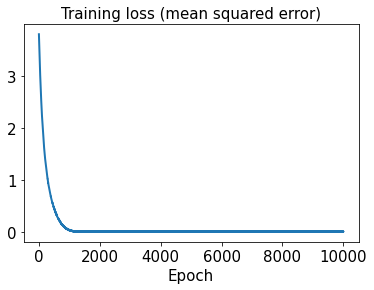

In [105]:
hist3 = history3.history
plt.plot(hist3['loss'], lw=2)
plt.title('Training loss (mean squared error)', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

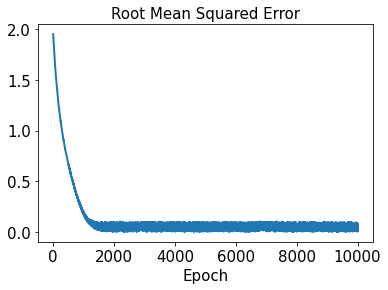

In [106]:
plt.plot(hist3['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

In [107]:
test_results3 = sd3.evaluate(x_test3)

1/1 [==============================] - 0s 81ms/step - loss: 8.0554e-06 - rmse: 0.0000e+00


In [108]:
decoded_sensor_train3 = sensor_pred3.predict(t_train)

In [109]:
decoded_sensor_test3 = sensor_pred3.predict(t_test)

In [110]:
decoded_train3 = sd3.predict(decoded_sensor_train3)

In [111]:
decoded_test3 = sd3.predict(decoded_sensor_test3)

In [112]:
error_train_abs3 = np.abs(decoded_train3 - y_train3)

In [113]:
error_test_abs3 = np.abs(decoded_test3 - y_test3)

In [114]:
l2_error_train3 = np.sqrt(np.sum((decoded_train3 - y_train3)**2) / np.sum(y_train3**2))
print(l2_error_train3)

0.12468488941897583


In [115]:
l2_error_test3 = np.sqrt(np.sum((decoded_test3 - y_test3)**2) / np.sum(y_test3**2))
print(l2_error_test3)

0.12527274068288985


In [116]:
l2_error_train_list3 = []
for i in range(0, len(x_train3)):
    l2_error_train_data3 = np.sqrt(np.sum((decoded_train3[i] - y_train3[i])**2) / np.sum(y_train3[i]**2))
    l2_error_train_list3.append(l2_error_train_data3)
print(l2_error_train_list3)

[0.0813193900638755, 0.14947290340819397, 0.049067082142807965, 0.11466415065886307, 0.04273413389448747, 0.1373874149892837, 0.06777286147271887, 0.12075746433979619, 0.050735521387389355, 0.1578758995360766, 0.14772754442763128, 0.15292423212345813, 0.058703816484454226, 0.1526731140046378, 0.12534246858812334, 0.15652347626010407, 0.09439898997444893, 0.006105837801706705, 0.1592985475388376, 0.10755110980639335, 0.17686064224065517, 0.15972714275839198, 0.16735219492752776, 0.026290815013466633, 0.1340653076797402, 0.1318690011113183, 0.01637168136670765, 0.035664130801531434, 0.02148785517994941, 0.14535625607881253, 0.08499487262073425, 0.0694382514352548, 0.1870673447121117]


In [117]:
l2_error_test_list3 = []
for i in range(0, len(x_test3)):
    l2_error_test_data3 = np.sqrt(np.sum((decoded_test3[i] - y_test3[i])**2) / np.sum(y_test3[i]**2))
    l2_error_test_list3.append(l2_error_test_data3)
print(l2_error_test_list3)

[0.032898394964082846, 0.09987497897601919, 0.14194322631552983, 0.04048061538547121, 0.15608109842917356, 0.20837129157867715, 0.029073677180979626, 0.19755479806417606]


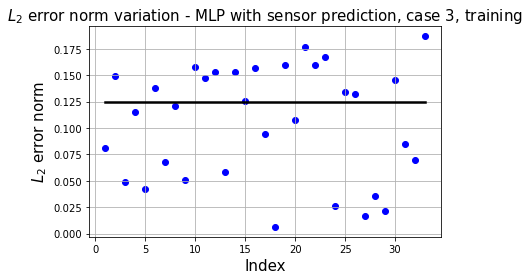

In [118]:
plt.plot(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train3*np.ones(x_train3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_train3.shape[0], x_train3.shape[0]), l2_error_train_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, training', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

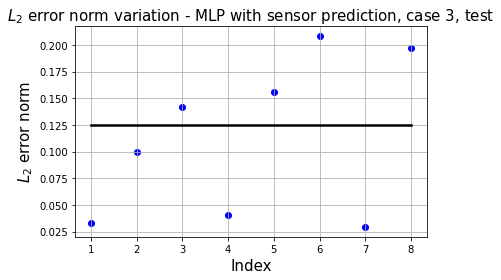

In [119]:
plt.plot(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test3*np.ones(x_test3.shape[0],), 'k',
        lw=2.5)
plt.scatter(np.linspace(1, x_test3.shape[0], x_test3.shape[0]), l2_error_test_list3, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variation - MLP with sensor prediction, case 3, test', fontsize = 15)
plt.grid()
plt.tight_layout()
plt.show()

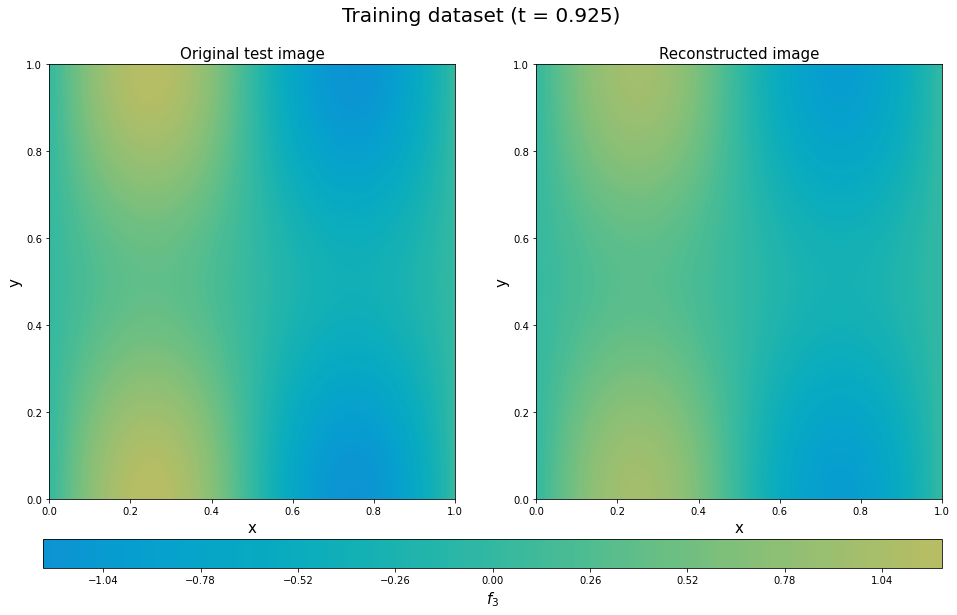

In [120]:
plt.figure(figsize=(16, 8))
y_train3_20_rotate = y_train3[20].T.reshape(101,101)
decoded_rotate3 = decoded_train3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_20_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[37]),fontsize=20)
plt.show()

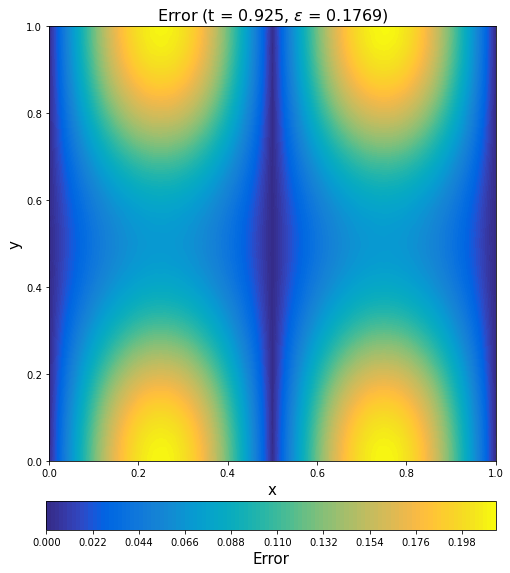

In [121]:
error_train_abs3_rotate20 = error_train_abs3[20].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate20, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.925, $\epsilon$ = %.4f)' %(l2_error_train_list3[20]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

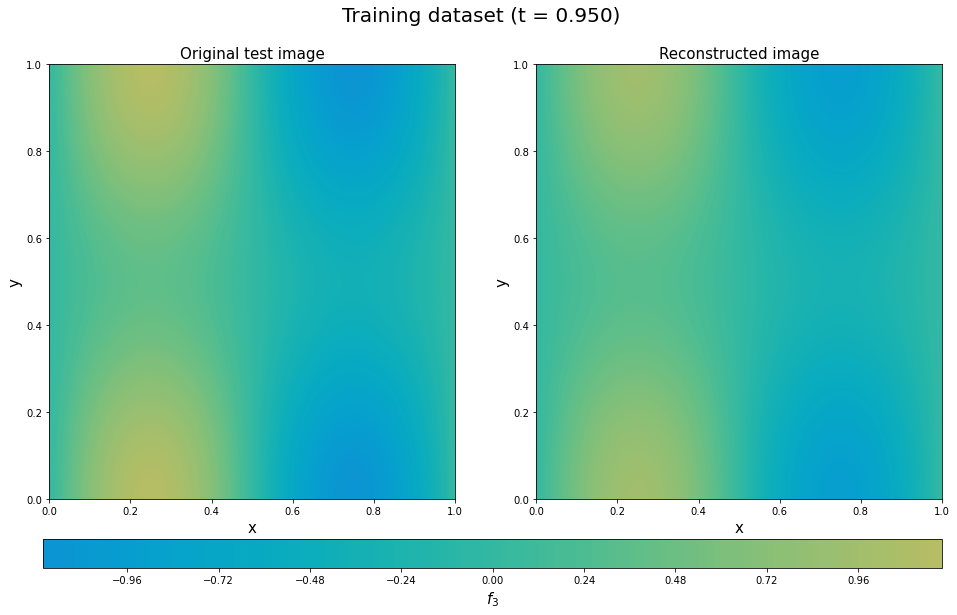

In [122]:
plt.figure(figsize=(16, 8))
y_train3_32_rotate = y_train3[32].T.reshape(101,101)
decoded_rotate3 = decoded_train3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_train3_32_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Training dataset (t = %.3f)' %(t[38]), fontsize=20)
plt.show()

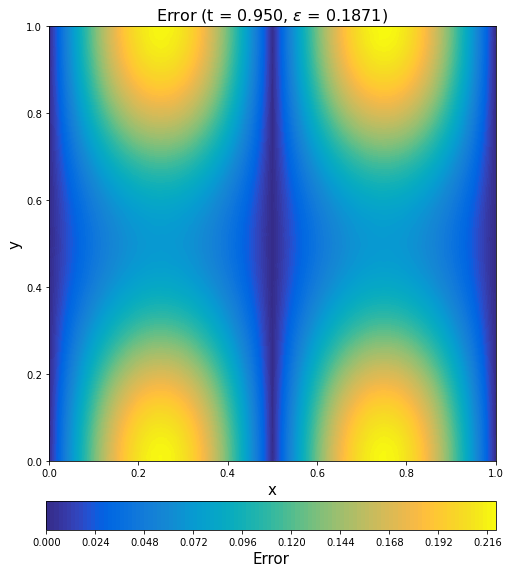

In [123]:
error_train_abs3_rotate32 = error_train_abs3[32].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_train_abs3_rotate32, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.950, $\epsilon$ = %.4f)' %(l2_error_train_list3[32]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)
#cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.show()

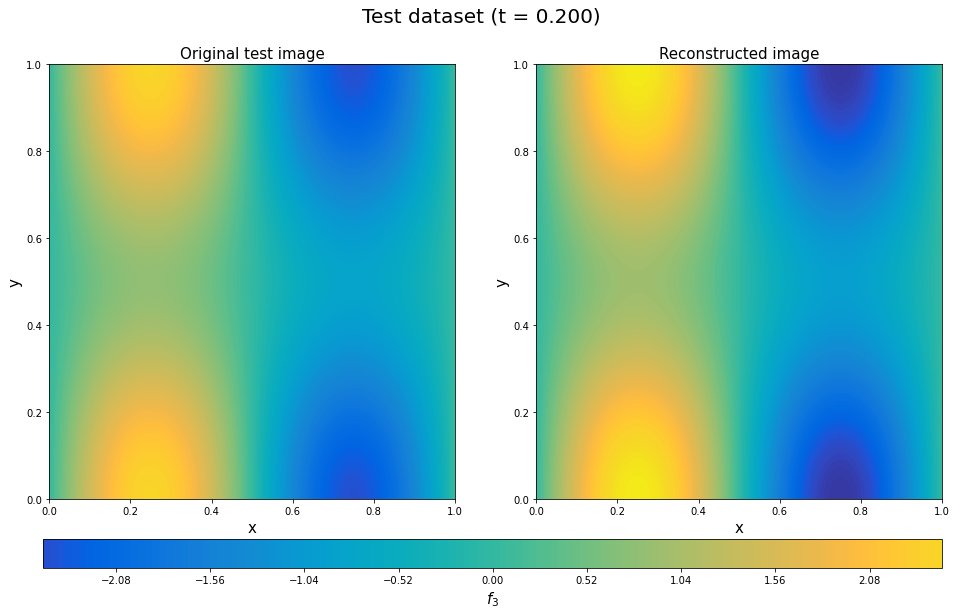

In [124]:
plt.figure(figsize=(16, 8))
y_test3_2_rotate = y_test3[2].T.reshape(101,101)
decoded_rotate3 = decoded_test3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_2_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[8]),fontsize=20)
plt.show()

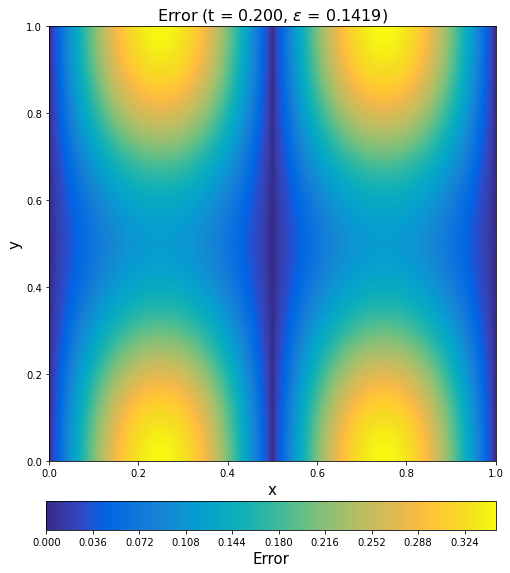

In [125]:
error_test_abs3_rotate2 = error_test_abs3[2].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate2, levels=128, cmap=parula_map)
ax5.set_title(r'Error (t = 0.200, $\epsilon$ = %.4f)' %(l2_error_test_list3[2]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()

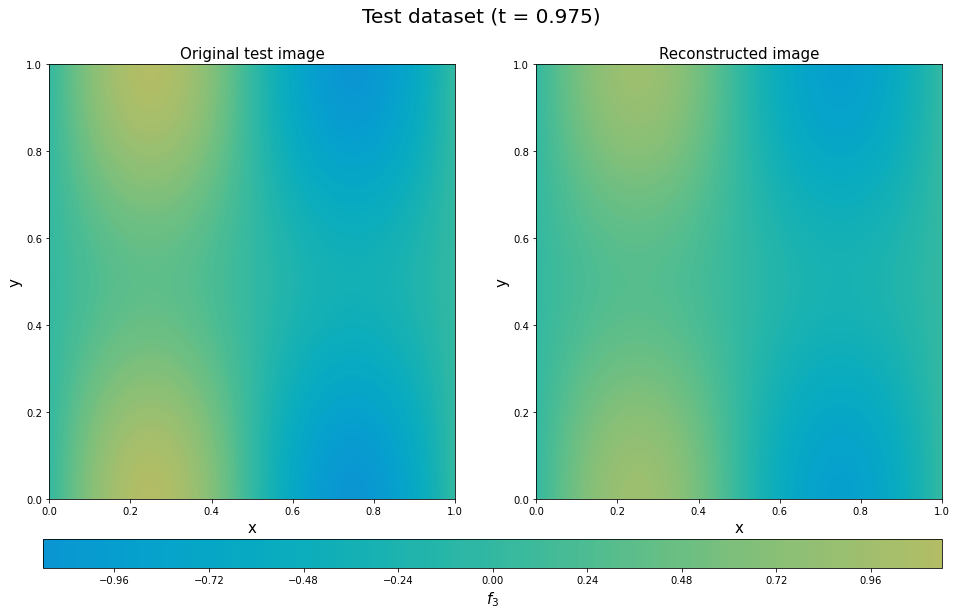

In [126]:
plt.figure(figsize=(16, 8))
y_test3_7_rotate = y_test3[7].T.reshape(101,101)
decoded_rotate3 = decoded_test3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test3_7_rotate, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate3, levels=128, cmap=cmap)
ax.set_xlabel('x', fontsize=15)
ax.set_ylabel('y', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
a1.set_clim(-3.0,3.0)
a2.set_clim(-3.0,3.0)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('$f_3$', fontsize=15)

plt.suptitle(r'Test dataset (t = %.3f)' %(t[39]),fontsize=20)
plt.show()

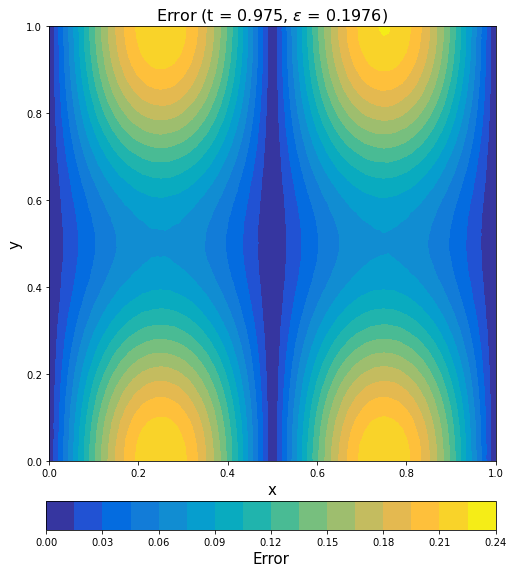

In [127]:
error_test_abs3_rotate7 = error_test_abs3[7].T.reshape(101,101)

cmap = plt.get_cmap(parula_map, 11)

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs3_rotate7, levels=16, cmap=parula_map)
ax5.set_title(r'Error (t = 0.975, $\epsilon$ = %.4f)' %(l2_error_test_list3[7]), fontsize=16)
ax5.set_xlabel('x', fontsize=15)
ax5.set_ylabel('y', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

plt.show()